# AI FOR SECURITY - ASSIGNMENT

## Project overview:

This project focuses on exploring and analyzing the PhiUSIIL Phishing URL dataset, which comprises 134,850 legitimate URLs and 100,945 phishing URLs. The objective is to gain insights into the data through visualization, perform statistical analysis, and build both supervised and unsupervised models.<br>
Key goals include:
1. **Summary Statistics:**
   - Understanding the structure of the dataset, including the number of rows and columns, column names, and data types.  
   - Identifying categorical columns, analyzing their possible values, and determining the most frequent ones.  
   - Computing descriptive statistics for numeric columns to assess trends, variability, and potential anomalies.  
   - Evaluating the target variable's distribution to understand the balance between legitimate and phishing URLs.

3. **Data Visualization:**  
   - Visualizing distributions of features using bar plots and histograms to identify patterns or outliers.  
   - Examining relationships between feature distributions and the target variable to uncover insights.  
   - Creating a heatmap to explore correlations among features and assess their logical coherence.

4. **Supervised Learning:**  
   - Preprocessing the data, handling missing values, and identifying important features for classification.  
   - Training various classifiers to determine which ones perform best in predicting phishing vs. legitimate URLs.  
   - Selecting and applying suitable evaluation metrics for model performance assessment.

5. **Unsupervised Learning:**  
   - Clustering the data to uncover hidden structures and patterns using 2D visualizations and dimensionality reduction techniques.  
   - Interpreting clusters to see if they align with intuitive subsets, and assessing their utility for feature engineering in supervised models.  
   - Applying anomaly detection techniques to identify potential outliers and determine their relevance or noise characteristics.

Through this analysis, I aim to enhance the understanding of phishing URL detection and demonstrate how data science techniques can be effectively applied to combat cyber threats.

## 1. Import libraries

**Remove warnings**

In [4]:
import warnings

# Suppress all warnings
warnings.filterwarnings('ignore')

In [5]:
import pandas as pd
import numpy as np
import time

**Data visualization**

In [7]:
%matplotlib inline
from matplotlib import pyplot as plt
from matplotlib.gridspec import GridSpec
import seaborn as sns

#!pip install missingno
import missingno as msno

**Data pre-processing**

In [9]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

**Linear classifier**

In [11]:
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC

**Non-Linear classifier**

In [13]:
from sklearn.neural_network import MLPClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier, plot_tree

**Ensembler classifier**

In [15]:
#!pip install xgboost
from xgboost import XGBClassifier
from sklearn.ensemble import RandomForestClassifier

**Clustering classifiers**

In [17]:
from sklearn.cluster import (
    KMeans, 
    AgglomerativeClustering, 
    DBSCAN
)

**Anomaly detection**

In [19]:
from sklearn.svm import OneClassSVM
from sklearn.covariance import EllipticEnvelope
from sklearn.ensemble import IsolationForest
from sklearn.neighbors import LocalOutlierFactor

**Evaluation metrics**

In [21]:
from sklearn.metrics import (
    accuracy_score, 
    precision_score,
    recall_score,
    f1_score,
    ConfusionMatrixDisplay,
    precision_recall_curve,
    average_precision_score,
    roc_curve,
    roc_auc_score,
    homogeneity_score,
    completeness_score,
    v_measure_score,
    silhouette_score,
    calinski_harabasz_score
)
from sklearn.calibration import CalibrationDisplay

**Cross validation**

In [23]:
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV

**LIME**

In [25]:
#!pip install lime
import lime
import lime.lime_tabular

**t-SNE**

In [27]:
from sklearn.manifold import TSNE

## 2. Data preparation

Define the path to the dataset `CSV file`

In [30]:
path_db = 'Dataset/Phishing_URL_Dataset.csv'

Load the dataset into a DataFrame using `Pandas`, imported previusly as `pd`. <br>
Don't need to add the `headers` since they are already present in the `CSV first row`.

In [32]:
df = pd.read_csv(path_db)

### 2.1 Data Exploration

<div class ="alert alert-info" role="alert">
    Display the info of the DataFrame
</div>

In [35]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 235795 entries, 0 to 235794
Data columns (total 56 columns):
 #   Column                      Non-Null Count   Dtype  
---  ------                      --------------   -----  
 0   FILENAME                    235795 non-null  object 
 1   URL                         235795 non-null  object 
 2   URLLength                   235795 non-null  int64  
 3   Domain                      235795 non-null  object 
 4   DomainLength                235795 non-null  int64  
 5   IsDomainIP                  235795 non-null  int64  
 6   TLD                         235795 non-null  object 
 7   URLSimilarityIndex          235795 non-null  float64
 8   CharContinuationRate        235795 non-null  float64
 9   TLDLegitimateProb           235795 non-null  float64
 10  URLCharProb                 235795 non-null  float64
 11  TLDLength                   235795 non-null  int64  
 12  NoOfSubDomain               235795 non-null  int64  
 13  HasObfuscation

<div class ="alert alert-info" role="alert">
    Display 5 random rows of the DataFrame
</div>

In [37]:
df.sample(5)

,FILENAME,URL,URLLength,Domain,DomainLength,IsDomainIP,TLD,URLSimilarityIndex,CharContinuationRate,TLDLegitimateProb,...,Pay,Crypto,HasCopyrightInfo,NoOfImage,NoOfCSS,NoOfJS,NoOfSelfRef,NoOfEmptyRef,NoOfExternalRef,label
44867,748919.txt,https://www.en.specwar.info,26,www.en.specwar.info,19,0,info,100.000000,0.800000,0.007505,...,0,0,1,0,3,5,0,0,31,1
11269,418079.txt,https://www.wdtimes.com,22,www.wdtimes.com,15,0,com,100.000000,1.000000,0.522907,...,1,0,1,62,7,50,273,1,64,1
146785,8043938.txt,https://anularcompra.0bancolombia.repl.co/#/,44,anularcompra.0bancolombia.repl.co,33,0,co,31.682540,0.466667,0.005977,...,0,0,0,0,0,0,0,0,2,0
228006,mw10618.txt,http://www.ledgerwallet.com,26,www.ledgerwallet.com,20,0,com,100.000000,1.000000,0.522907,...,0,0,0,0,0,0,0,0,0,0
207991,8036913.txt,http://www04.missedaddress-informations-3en.y9...,52,www04.missedaddress-informations-3en.y92g.live,46,0,live,26.666667,0.390244,0.000372,...,0,0,0,0,0,0,0,0,0,0


<div class ="alert alert-info" role="alert">
    Display the first 5 rows of the DataFrame
</div>

In [39]:
df.head(5)

,FILENAME,URL,URLLength,Domain,DomainLength,IsDomainIP,TLD,URLSimilarityIndex,CharContinuationRate,TLDLegitimateProb,...,Pay,Crypto,HasCopyrightInfo,NoOfImage,NoOfCSS,NoOfJS,NoOfSelfRef,NoOfEmptyRef,NoOfExternalRef,label
0,521848.txt,https://www.southbankmosaics.com,31,www.southbankmosaics.com,24,0,com,100.0,1.000000,0.522907,...,0,0,1,34,20,28,119,0,124,1
1,31372.txt,https://www.uni-mainz.de,23,www.uni-mainz.de,16,0,de,100.0,0.666667,0.032650,...,0,0,1,50,9,8,39,0,217,1
2,597387.txt,https://www.voicefmradio.co.uk,29,www.voicefmradio.co.uk,22,0,uk,100.0,0.866667,0.028555,...,0,0,1,10,2,7,42,2,5,1
3,554095.txt,https://www.sfnmjournal.com,26,www.sfnmjournal.com,19,0,com,100.0,1.000000,0.522907,...,1,1,1,3,27,15,22,1,31,1
4,151578.txt,https://www.rewildingargentina.org,33,www.rewildingargentina.org,26,0,org,100.0,1.000000,0.079963,...,1,0,1,244,15,34,72,1,85,1


<div class ="alert alert-info" role="alert">
    Display the last 5 rows of the DataFrame
</div>

In [41]:
df.tail(5)

,FILENAME,URL,URLLength,Domain,DomainLength,IsDomainIP,TLD,URLSimilarityIndex,CharContinuationRate,TLDLegitimateProb,...,Pay,Crypto,HasCopyrightInfo,NoOfImage,NoOfCSS,NoOfJS,NoOfSelfRef,NoOfEmptyRef,NoOfExternalRef,label
235790,660997.txt,https://www.skincareliving.com,29,www.skincareliving.com,22,0,com,100.000000,1.000000,0.522907,...,1,0,1,51,7,21,187,2,191,1
235791,77185.txt,https://www.winchester.gov.uk,28,www.winchester.gov.uk,21,0,uk,100.000000,0.785714,0.028555,...,1,0,0,50,1,7,88,0,31,1
235792,622132.txt,https://www.nononsensedesign.be,30,www.nononsensedesign.be,23,0,be,100.000000,1.000000,0.003319,...,0,0,1,27,10,30,58,2,67,1
235793,7503962.txt,https://patient-cell-40f5.updatedlogmylogin.wo...,55,patient-cell-40f5.updatedlogmylogin.workers.dev,47,0,dev,28.157537,0.465116,0.000961,...,0,0,0,0,0,3,0,0,0,0
235794,384822.txt,https://www.alternativefinland.com,33,www.alternativefinland.com,26,0,com,100.000000,1.000000,0.522907,...,0,0,1,21,6,18,256,0,261,1


<div class ="alert alert-info" role="alert">
    Display the number of rows of the DataFrame
</div>

In [43]:
len(df)

235795

<div class ="alert alert-info" role="alert">
    Display the columns of the DataFrame
</div>

In [45]:
df.columns

Index(['FILENAME', 'URL', 'URLLength', 'Domain', 'DomainLength', 'IsDomainIP',
       'TLD', 'URLSimilarityIndex', 'CharContinuationRate',
       'TLDLegitimateProb', 'URLCharProb', 'TLDLength', 'NoOfSubDomain',
       'HasObfuscation', 'NoOfObfuscatedChar', 'ObfuscationRatio',
       'NoOfLettersInURL', 'LetterRatioInURL', 'NoOfDegitsInURL',
       'DegitRatioInURL', 'NoOfEqualsInURL', 'NoOfQMarkInURL',
       'NoOfAmpersandInURL', 'NoOfOtherSpecialCharsInURL',
       'SpacialCharRatioInURL', 'IsHTTPS', 'LineOfCode', 'LargestLineLength',
       'HasTitle', 'Title', 'DomainTitleMatchScore', 'URLTitleMatchScore',
       'HasFavicon', 'Robots', 'IsResponsive', 'NoOfURLRedirect',
       'NoOfSelfRedirect', 'HasDescription', 'NoOfPopup', 'NoOfiFrame',
       'HasExternalFormSubmit', 'HasSocialNet', 'HasSubmitButton',
       'HasHiddenFields', 'HasPasswordField', 'Bank', 'Pay', 'Crypto',
       'HasCopyrightInfo', 'NoOfImage', 'NoOfCSS', 'NoOfJS', 'NoOfSelfRef',
       'NoOfEmptyRef', 'NoOf

<div class ="alert alert-info" role="alert">
    Display the number of columns of the DataFrame
</div>

In [47]:
len(df.columns)

56

<div class ="alert alert-info" role="alert">
    Display the number of features of the DataFrame
</div>

In [49]:
len(df.columns)-1

55

Given the 56 columns:
- The first 55 columns are features of the dataframe, since they are not related to the target.
- The last column, called label, represent the target:
  - `Label = 1` => The URL is legitimate.
  - `Label = 0` => The URL is a phishing URL. <br>

Since I am going to detect the phishing URL, I invert the values of the labels, so I use:
  - `Label = 1` => The URL is a phishing URL.
  - `Label = 0` => The URL is legitimate.

<div class ="alert alert-info" role="alert">
    Apply lambda transformation of the label.
</div>

In [52]:
df['label'] = df['label'].apply(lambda x: 1 if x == 0 else 0)

<div class ="alert alert-info" role="alert">
    Display how many rows are there for each unique value of each feature.<br>
    Display also the dtype of each feature.
</div>

In [54]:
for feature in df.columns.drop('label'):
    print(f"{feature} - {df[feature].nunique()}, dtype: {df[feature].dtype}")

FILENAME - 235795, dtype: object
URL - 235370, dtype: object
URLLength - 482, dtype: int64
Domain - 220086, dtype: object
DomainLength - 101, dtype: int64
IsDomainIP - 2, dtype: int64
TLD - 695, dtype: object
URLSimilarityIndex - 36360, dtype: float64
CharContinuationRate - 898, dtype: float64
TLDLegitimateProb - 465, dtype: float64
URLCharProb - 227421, dtype: float64
TLDLength - 12, dtype: int64
NoOfSubDomain - 10, dtype: int64
HasObfuscation - 2, dtype: int64
NoOfObfuscatedChar - 20, dtype: int64
ObfuscationRatio - 146, dtype: float64
NoOfLettersInURL - 421, dtype: int64
LetterRatioInURL - 709, dtype: float64
NoOfDegitsInURL - 182, dtype: int64
DegitRatioInURL - 575, dtype: float64
NoOfEqualsInURL - 25, dtype: int64
NoOfQMarkInURL - 5, dtype: int64
NoOfAmpersandInURL - 31, dtype: int64
NoOfOtherSpecialCharsInURL - 74, dtype: int64
SpacialCharRatioInURL - 240, dtype: float64
IsHTTPS - 2, dtype: int64
LineOfCode - 10738, dtype: int64
LargestLineLength - 26181, dtype: int64
HasTitle - 

<div class ="alert alert-info" role="alert">
    Display categorical features
</div>

In [56]:
categorical_features = [feature for feature in df.columns if df[feature].dtype == 'object']
categorical_features

['FILENAME', 'URL', 'Domain', 'TLD', 'Title']

<div class ="alert alert-info" role="alert">
    Display numerical features and some related statistics
</div>

In [58]:
numerical_features = [feature for feature in df.drop(columns = ['label']).columns if df[feature].dtype != 'object']
numerical_features

['URLLength',
 'DomainLength',
 'IsDomainIP',
 'URLSimilarityIndex',
 'CharContinuationRate',
 'TLDLegitimateProb',
 'URLCharProb',
 'TLDLength',
 'NoOfSubDomain',
 'HasObfuscation',
 'NoOfObfuscatedChar',
 'ObfuscationRatio',
 'NoOfLettersInURL',
 'LetterRatioInURL',
 'NoOfDegitsInURL',
 'DegitRatioInURL',
 'NoOfEqualsInURL',
 'NoOfQMarkInURL',
 'NoOfAmpersandInURL',
 'NoOfOtherSpecialCharsInURL',
 'SpacialCharRatioInURL',
 'IsHTTPS',
 'LineOfCode',
 'LargestLineLength',
 'HasTitle',
 'DomainTitleMatchScore',
 'URLTitleMatchScore',
 'HasFavicon',
 'Robots',
 'IsResponsive',
 'NoOfURLRedirect',
 'NoOfSelfRedirect',
 'HasDescription',
 'NoOfPopup',
 'NoOfiFrame',
 'HasExternalFormSubmit',
 'HasSocialNet',
 'HasSubmitButton',
 'HasHiddenFields',
 'HasPasswordField',
 'Bank',
 'Pay',
 'Crypto',
 'HasCopyrightInfo',
 'NoOfImage',
 'NoOfCSS',
 'NoOfJS',
 'NoOfSelfRef',
 'NoOfEmptyRef',
 'NoOfExternalRef']

In [59]:
df[numerical_features].describe()

,URLLength,DomainLength,IsDomainIP,URLSimilarityIndex,CharContinuationRate,TLDLegitimateProb,URLCharProb,TLDLength,NoOfSubDomain,HasObfuscation,...,Bank,Pay,Crypto,HasCopyrightInfo,NoOfImage,NoOfCSS,NoOfJS,NoOfSelfRef,NoOfEmptyRef,NoOfExternalRef
count,235795.000000,235795.000000,235795.000000,235795.000000,235795.000000,235795.000000,235795.000000,235795.000000,235795.000000,235795.000000,...,235795.000000,235795.000000,235795.000000,235795.000000,235795.000000,235795.000000,235795.000000,235795.000000,235795.000000,235795.000000
mean,34.573095,21.470396,0.002706,78.430778,0.845508,0.260423,0.055747,2.764456,1.164758,0.002057,...,0.127089,0.237007,0.023474,0.486775,26.075689,6.333111,10.522305,65.071113,2.377629,49.262516
std,41.314153,9.150793,0.051946,28.976055,0.216632,0.251628,0.010587,0.599739,0.600969,0.045306,...,0.333074,0.425247,0.151403,0.499826,79.411815,74.866296,22.312192,176.687539,17.641097,161.027430
min,13.000000,4.000000,0.000000,0.155574,0.000000,0.000000,0.001083,2.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,23.000000,16.000000,0.000000,57.024793,0.680000,0.005977,0.050747,2.000000,1.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
50%,27.000000,20.000000,0.000000,100.000000,1.000000,0.079963,0.057970,3.000000,1.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,8.000000,2.000000,6.000000,12.000000,0.000000,10.000000
75%,34.000000,24.000000,0.000000,100.000000,1.000000,0.522907,0.062875,3.000000,1.000000,0.000000,...,0.000000,0.000000,0.000000,1.000000,29.000000,8.000000,15.000000,88.000000,1.000000,57.000000
max,6097.000000,110.000000,1.000000,100.000000,1.000000,0.522907,0.090824,13.000000,10.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,8956.000000,35820.000000,6957.000000,27397.000000,4887.000000,27516.000000


The statistical summary of numerical features reveals generally consistent and reasonable data values. However, there are cases where the standard deviation (std) is notably high, indicating a significant spread in the data. This could suggest potential variability in the feature or the presence of outliers.

Additionally, some features show a maximum value significantly higher than the 75th percentile (Q3). These disparities suggest the presence of extreme values or outliers that may need further investigation. Now I perform visual analysis through boxplots and histograms to better understand the distribution and confirm whether these outliers are valid data points or errors.

### 2.2 Data visualisation

In [62]:
custom_colors = ['#0000FF','#FF0000'] # blue, red

<div class ="alert alert-info" role="alert">
    Plot the balacing of the DataFrame
</div>

        Count  Percentage
label                    
0      134850       57.19
1      100945       42.81


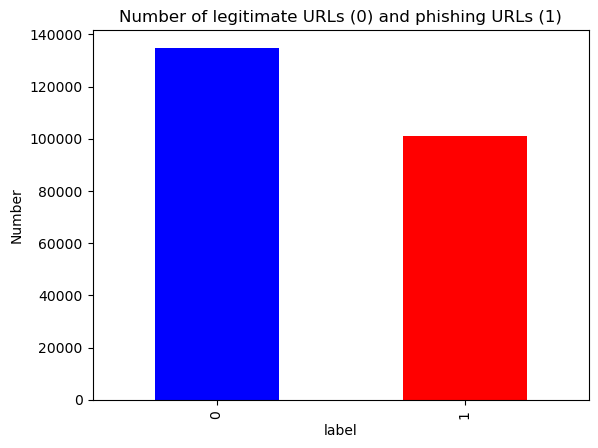

In [64]:
# Calculating value_counts for the column 'label'
labels_counts = df['label'].value_counts()

# Calculating the percentage of values
labels_percentages = df['label'].value_counts(normalize=True) * 100

# Combining the counting with the corresponding percentage value.
summary = pd.DataFrame({
    'Count': labels_counts,
    'Percentage': labels_percentages
})

# Show the result
summary['Percentage'] = summary['Percentage'].round(3)  # Round the percentage to three decimal digits
print(summary)

labels_counts.plot(kind='bar', color=custom_colors, xlabel='label', ylabel='Number', title='Number of legitimate URLs (0) and phishing URLs (1)')
plt.show()

The DataFrame exhibits a moderately balanced distribution of the target labels:

| **Label** | **Count** | **Percentage** |
|-----------|-----------|----------------|
| 0 (Legitimate URLs) | 134,850 | 57.19% |
| 1 (Phishing URLs) | 100,945 | 42.81% |

While there is a quite balance favoring the "Legitimate URLs" (label 0), the distribution is not severely skewed, making it suitable for training most machine learning models without requiring significant rebalancing techniques like oversampling or undersampling.

<div class ="alert alert-info" role="alert">
    Plot the top-10 TLDs and their occurrences
</div>

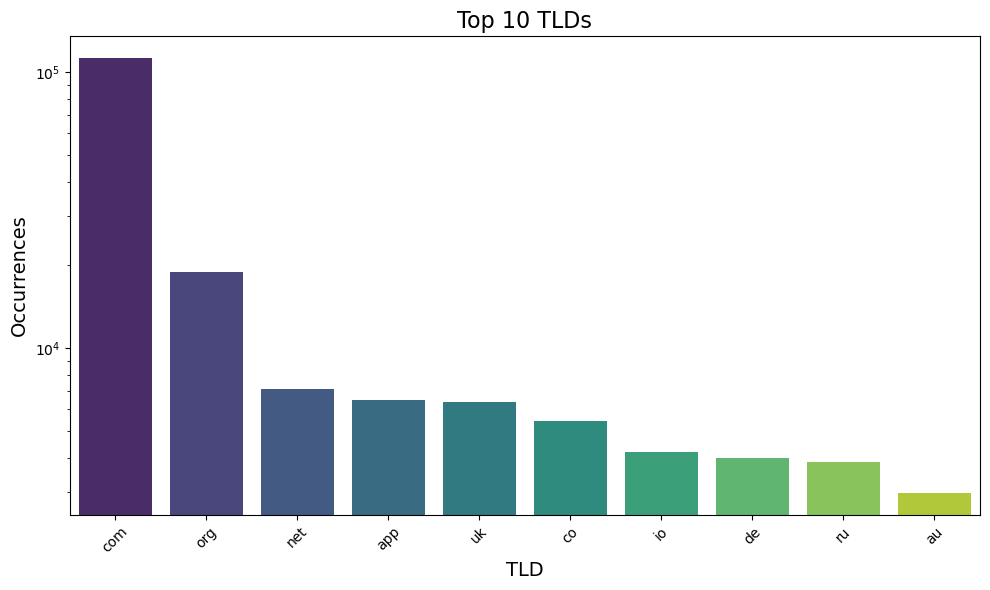

In [67]:
tld_counts = df['TLD'].value_counts()
top_10_tlds = tld_counts.head(10)

plt.figure(figsize=(10, 6))
sns.barplot(x=top_10_tlds.index, y=top_10_tlds.values, palette="viridis")
plt.title('Top 10 TLDs', fontsize=16)
plt.xlabel('TLD', fontsize=14)
plt.ylabel('Occurrences', fontsize=14)
plt.yscale('log')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

<div class ="alert alert-info" role="alert">
    Plot the relationship between the TLDs with 5 or less occurences and the label
</div>

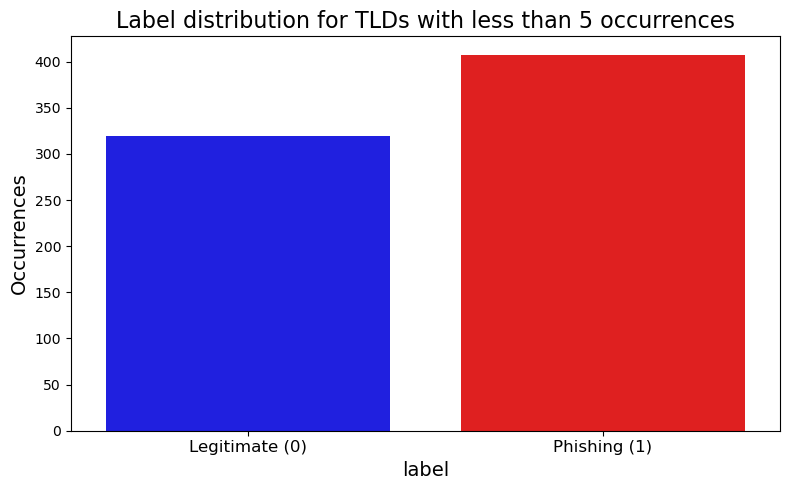

In [70]:
# Calculate occurrences of TLDs and keep only the ones with 5 or less occurrences
tld_counts = df['TLD'].value_counts()
rare_tlds = tld_counts[tld_counts<=5].index

# Filter the dataset for those TLDs
df_tlds = df[df['TLD'].isin(rare_tlds)]

# Count the occurrences
label_distribution = df_tlds['label'].value_counts()

# Create chart
plt.figure(figsize=(8, 5))
sns.barplot(x=label_distribution.index, y=label_distribution.values, palette=custom_colors)
plt.title('Label distribution for TLDs with less than 5 occurrences', fontsize=16)
plt.xlabel('label', fontsize=14)
plt.ylabel('Occurrences', fontsize=14)
plt.xticks(ticks=[0, 1], labels=['Legitimate (0)', 'Phishing (1)'], fontsize=12)
plt.tight_layout()
plt.show()

<div class ="alert alert-info" role="alert">
    Plot the distribution of URLLenght
</div>

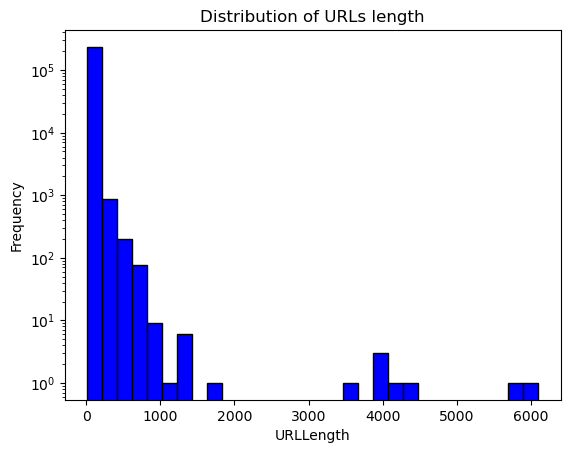

In [73]:
plt.hist(df['URLLength'], bins=30, color='blue', edgecolor='black')
plt.title('Distribution of URLs length')
plt.xlabel('URLLength')
plt.ylabel('Frequency')
plt.yscale('log')
plt.show()

The distribution of the URLLength feature is highly skewed to the right, with the majority of the data concentrated below 1000. A few extreme cases have values exceeding 2000, with some reaching as high as 6000. These extreme values significantly contribute to the high standard deviation and variability observed in the descriptive statistics.

To address this, I decided to eliminate data points where URLLength exceeds 2000. This threshold was chosen based on the histogram, which shows a sharp drop in frequency beyond this value. By doing so, I retain the majority of the meaningful data while excluding extreme outliers that could potentially skew the analysis or model performance.

In [76]:
df = df[df['URLLength'] <= 2000]

<div class ="alert alert-info" role="alert">
    Plot the relationship between URLLength and the label class
</div>

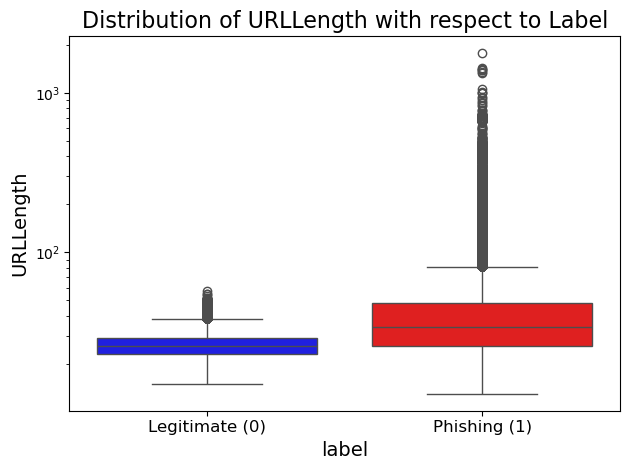

In [78]:
sns.boxplot(data=df, x='label', y='URLLength', palette=custom_colors)
plt.title('Distribution of URLLength with respect to Label', fontsize=16)
plt.xlabel('label', fontsize=14)
plt.ylabel('URLLength', fontsize=14)
plt.yscale('log')
plt.xticks(ticks=[0, 1], labels=['Legitimate (0)', 'Phishing (1)'], fontsize=12)
plt.tight_layout()
plt.show()

<div class ="alert alert-info" role="alert">
    Plot the distribution of DomainLength
</div>

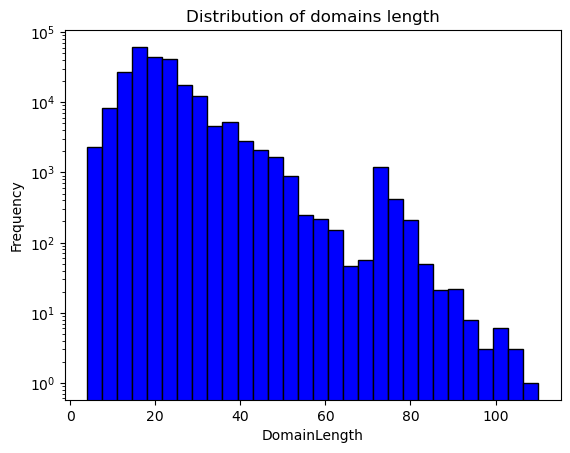

In [81]:
plt.hist(df['DomainLength'], bins=30, color='blue', edgecolor='black')
plt.title('Distribution of domains length')
plt.xlabel('DomainLength')
plt.ylabel('Frequency')
plt.yscale('log')
plt.show()

<div class ="alert alert-info" role="alert">
    Plot the relationship between DomainLength and the label class
</div>

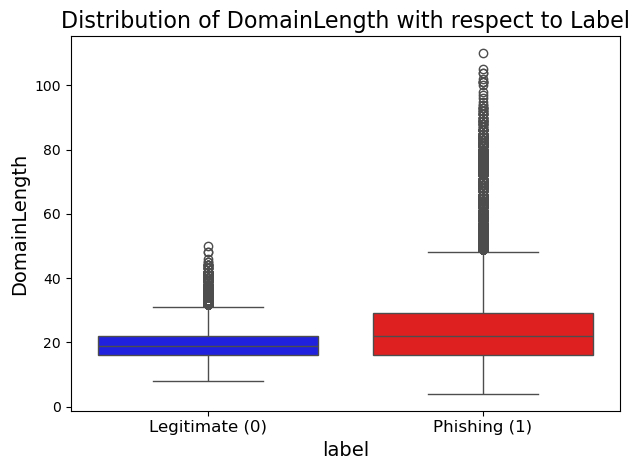

In [84]:
sns.boxplot(data=df, x='label', y='DomainLength', palette=custom_colors)
plt.title('Distribution of DomainLength with respect to Label', fontsize=16)
plt.xlabel('label', fontsize=14)
plt.ylabel('DomainLength', fontsize=14)
plt.xticks(ticks=[0, 1], labels=['Legitimate (0)', 'Phishing (1)'], fontsize=12)
plt.tight_layout()
plt.show()

<div class ="alert alert-info" role="alert">
    Plot the relationship between TLDLenght and the label class
</div>

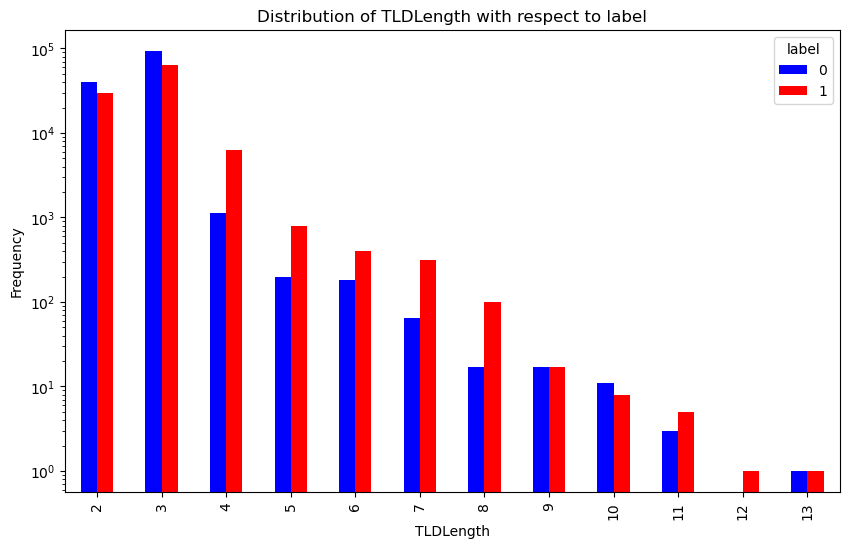

In [87]:
plt.figure(figsize=(10,6))

# Grouping by TLDLength and plotting the label distribution for each TLDLength
df.groupby(['TLDLength', 'label']).size().unstack().plot(kind='bar', stacked=False, color=custom_colors, ax=plt.gca())

# Adding titles and labels
plt.title('Distribution of TLDLength with respect to label')
plt.xlabel('TLDLength')
plt.ylabel('Frequency')
plt.yscale('log')

# Display the plot
plt.show()

<div class ="alert alert-info" role="alert">
    Plot the relationship between URLSimilarityIndex and the label class
</div>

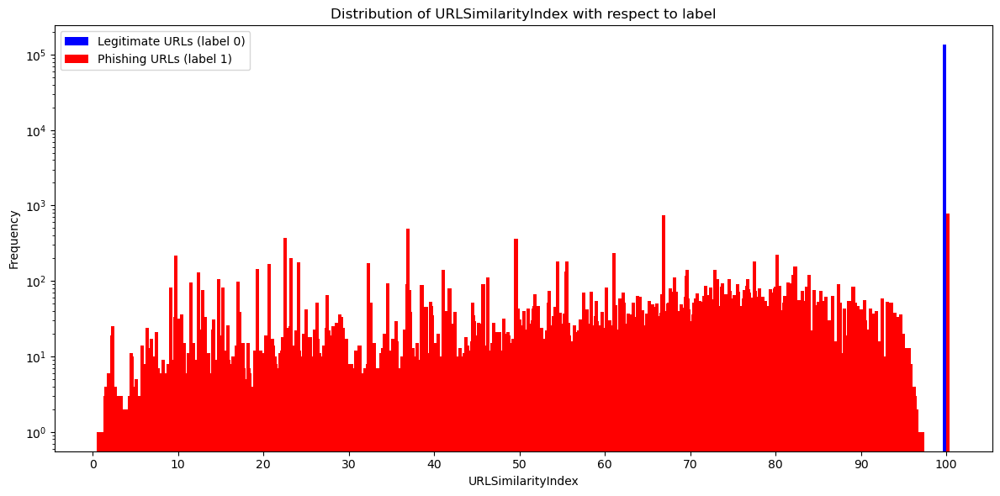

In [90]:
count_label_0 = df[df['label'] == 0]['URLSimilarityIndex'].value_counts().sort_index()
count_label_1 = df[df['label'] == 1]['URLSimilarityIndex'].value_counts().sort_index()

# Create a bar chart
plt.figure(figsize=(12, 6))

# Bar plot for label 0 (Legitimate URLs)
plt.bar(count_label_0.index - 0.2, count_label_0.values, width=0.4, color='blue', align='center', label='Legitimate URLs (label 0)')

# Bar plot for label 1 (Phishing URLs)
plt.bar(count_label_1.index + 0.2, count_label_1.values, width=0.4, color='red', align='center', label='Phishing URLs (label 1)')

# Customize the chart
plt.title('Distribution of URLSimilarityIndex with respect to label')
plt.xlabel('URLSimilarityIndex')
plt.ylabel('Frequency')
plt.xticks(range(0, 101, 10))  # Set x-ticks for better readability
plt.yscale('log')
plt.legend()
plt.tight_layout()
plt.show()

When the label is 0 (legitimate URL), the `URLSimilarityIndex` is always 100, indicating a perfect match with the legitimate URL structure.<br>
However, when the label is 1 (phishing URL), the `URLSimilarityIndex` can vary across the entire range, reflecting the diversity of similarities between phishing URLs and legitimate URLs.<br>
This suggests that phishing URLs tend to have more variation in their similarity to legitimate URLs.

<div class ="alert alert-info" role="alert">
    Plot the relationship between NoOfSubDomain and the label class
</div>

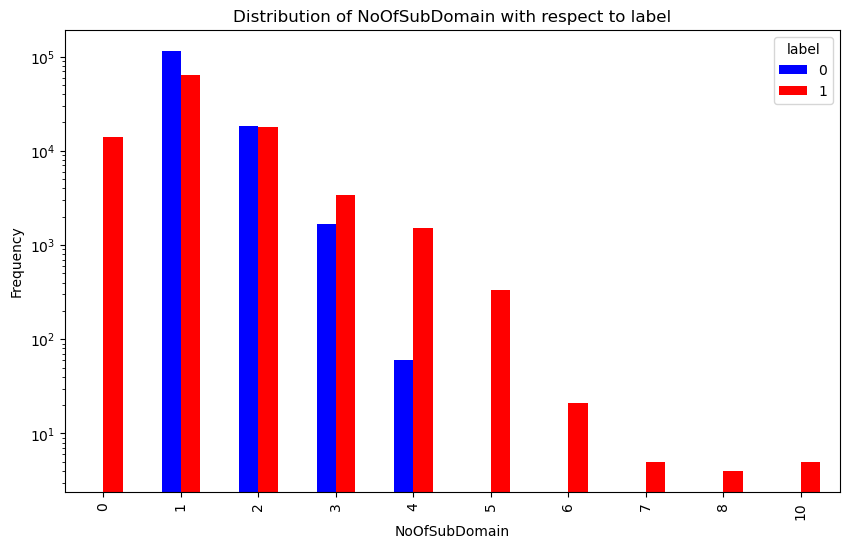

In [93]:
plt.figure(figsize=(10,6))

# Grouping by NoOfSubDomain and plotting the label distribution for each NoOfSubDomain
df.groupby(['NoOfSubDomain', 'label']).size().unstack().plot(kind='bar', stacked=False, color=custom_colors, ax=plt.gca())

# Adding titles and labels
plt.title('Distribution of NoOfSubDomain with respect to label')
plt.xlabel('NoOfSubDomain')
plt.ylabel('Frequency')
plt.yscale('log')

# Display the plot
plt.show()

The distribution of the NoOfSubDomain feature shows that URLs with 0, 5 or more subdomains are phishing URLs. This could influence the decisions of the various models.<br>
I therefore decided to keep only the rows with NoOfSubDomains between 1 and 4 to avoid potential prediction biases.

In [96]:
df = df[(df['NoOfSubDomain'] > 0) & (df['NoOfSubDomain'] < 5)]

### 2.3 Data pre-processing

<div class ="alert alert-info" role="alert">
    Display the percentage of missing values per column
</div>

In [99]:
df.isnull().sum(axis=0)/df.shape[0]

FILENAME                      0.0
URL                           0.0
URLLength                     0.0
Domain                        0.0
DomainLength                  0.0
IsDomainIP                    0.0
TLD                           0.0
URLSimilarityIndex            0.0
CharContinuationRate          0.0
TLDLegitimateProb             0.0
URLCharProb                   0.0
TLDLength                     0.0
NoOfSubDomain                 0.0
HasObfuscation                0.0
NoOfObfuscatedChar            0.0
ObfuscationRatio              0.0
NoOfLettersInURL              0.0
LetterRatioInURL              0.0
NoOfDegitsInURL               0.0
DegitRatioInURL               0.0
NoOfEqualsInURL               0.0
NoOfQMarkInURL                0.0
NoOfAmpersandInURL            0.0
NoOfOtherSpecialCharsInURL    0.0
SpacialCharRatioInURL         0.0
IsHTTPS                       0.0
LineOfCode                    0.0
LargestLineLength             0.0
HasTitle                      0.0
Title         

<Axes: >

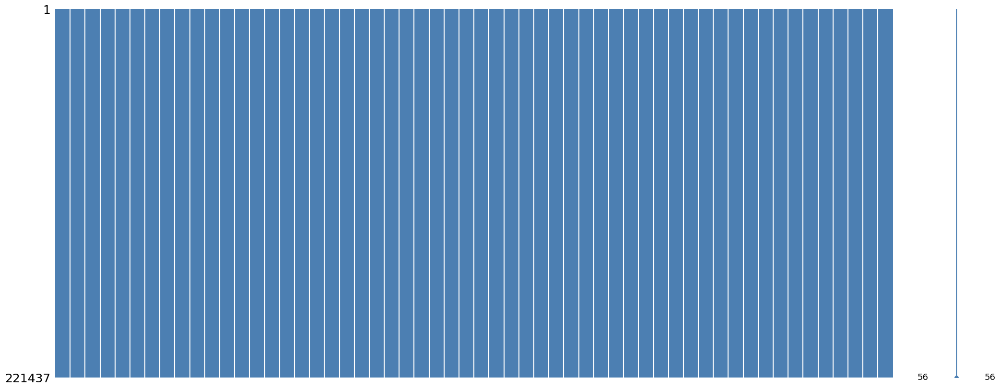

In [100]:
# Show missing values and rows using missingno
msno.matrix(df,color=(0.3, 0.5, 0.7), fontsize=15)

#### Why certain categorical features are dropped

In the process of preparing the dataset for modeling, the categorical features are dropped for the following reasons:

1. **FILENAME**:  
   The `FILENAME` feature is dropped because it contained **unique values** for each record. Including this feature would not contribute meaningful information for classification, as a model would likely overfit the data by memorizing the unique filenames instead of learning the underlying patterns of phishing and legitimate URLs.

2. **URL**:  
   Similar to `FILENAME`, the `URL` feature has **almost unique values** for each URL in the dataset. Using this feature would make the model highly sensitive to each individual URL, which could result in overfitting and poor generalization to new, unseen data.

3. **Domain**:  
   The `Domain` feature is dropped for the same reason as the `URL`. It contained **almost unique values** for each domain, and including it would likely cause the model to memorize specific domain patterns instead of identifying broader, more generalizable trends relevant to phishing detection.

4. **Title**:  
   The `Title` feature, like `URL` and `FILENAME`, contains **almost unique values**. Including it would have introduced similar risks, with the model potentially learning to classify based on the exact title of the webpage rather than focusing on generalizable patterns that are indicative of phishing behavior.

By removing these features, I ensure that the model is not overfitting to highly specific information and instead learns to classify based on more meaningful, generalized patterns that are applicable across different URLs and domains.

The **TLD** feature was initially a categorical variable containing various domain suffixes. To make this feature usable for modeling, I replaced each TLD with its **occurrence** count in the dataset. This encoding provides numerical representation while capturing the importance of frequently occurring TLDs.<br>
Additionally, TLDs with fewer than or equal to 5 occurrences were analyzed separately to evaluate their relationship with the target label. The distribution of legitimate and phishing URLs for these TLDs is relatively balanced, indicating no strong bias in the classification based on low-frequency domains.

In [102]:
categorical_features.remove('TLD')
categorical_features

['FILENAME', 'URL', 'Domain', 'Title']

<div class ="alert alert-info" role="alert">
    Encode TLD with the number of occurrences
</div>

In [104]:
df['TLD'] = df['TLD'].map(tld_counts)

<div class ="alert alert-info" role="alert">
    Drop categorical features from the dataframe
</div>

In [106]:
numerical_df = df.drop(columns = categorical_features)
numerical_df

,URLLength,DomainLength,IsDomainIP,TLD,URLSimilarityIndex,CharContinuationRate,TLDLegitimateProb,URLCharProb,TLDLength,NoOfSubDomain,...,Pay,Crypto,HasCopyrightInfo,NoOfImage,NoOfCSS,NoOfJS,NoOfSelfRef,NoOfEmptyRef,NoOfExternalRef,label
0,31,24,0,112554,100.000000,1.000000,0.522907,0.061933,3,1,...,0,0,1,34,20,28,119,0,124,0
1,23,16,0,3996,100.000000,0.666667,0.032650,0.050207,2,1,...,0,0,1,50,9,8,39,0,217,0
2,29,22,0,6395,100.000000,0.866667,0.028555,0.064129,2,2,...,0,0,1,10,2,7,42,2,5,0
3,26,19,0,112554,100.000000,1.000000,0.522907,0.057606,3,1,...,1,1,1,3,27,15,22,1,31,0
4,33,26,0,18793,100.000000,1.000000,0.079963,0.059441,3,1,...,1,0,1,244,15,34,72,1,85,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
235790,29,22,0,112554,100.000000,1.000000,0.522907,0.058739,3,1,...,1,0,1,51,7,21,187,2,191,0
235791,28,21,0,6395,100.000000,0.785714,0.028555,0.053834,2,2,...,1,0,0,50,1,7,88,0,31,0
235792,30,23,0,696,100.000000,1.000000,0.003319,0.063093,2,1,...,0,0,1,27,10,30,58,2,67,0
235793,55,47,0,2345,28.157537,0.465116,0.000961,0.050211,3,2,...,0,0,0,0,0,3,0,0,0,1


<div class ="alert alert-info" role="alert">
    Display the correlation between features
</div>

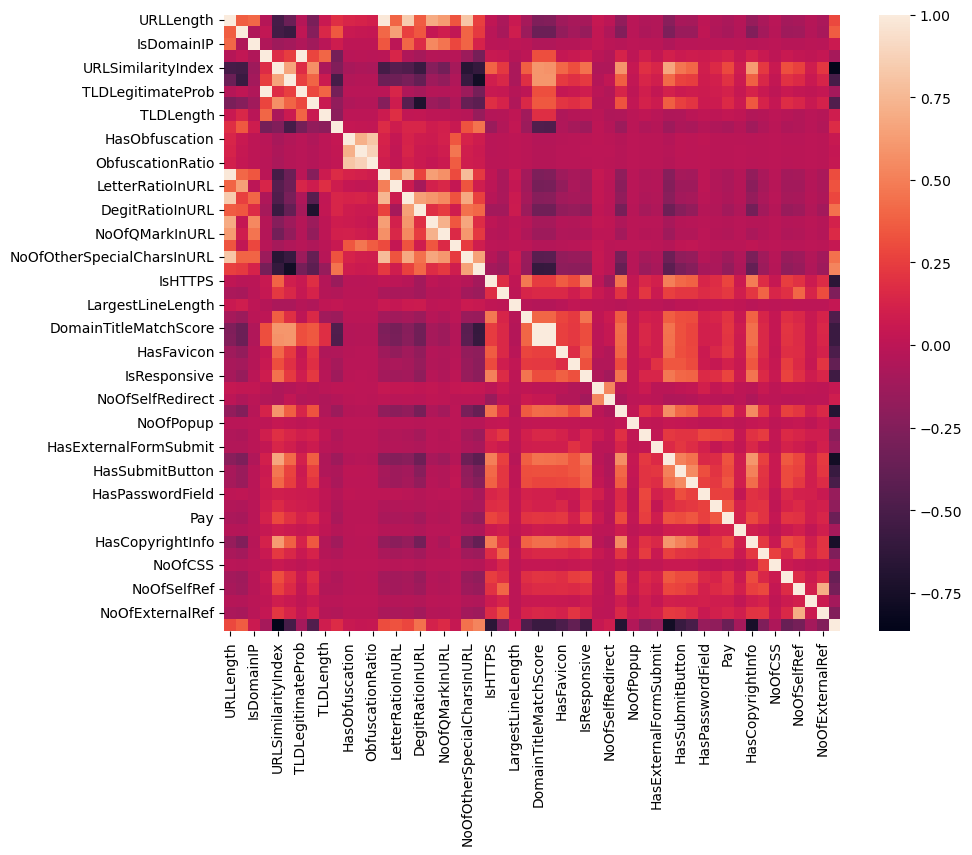

In [108]:
f, ax = plt.subplots(figsize=(10, 8))
sns.heatmap(numerical_df.corr(), square=True);

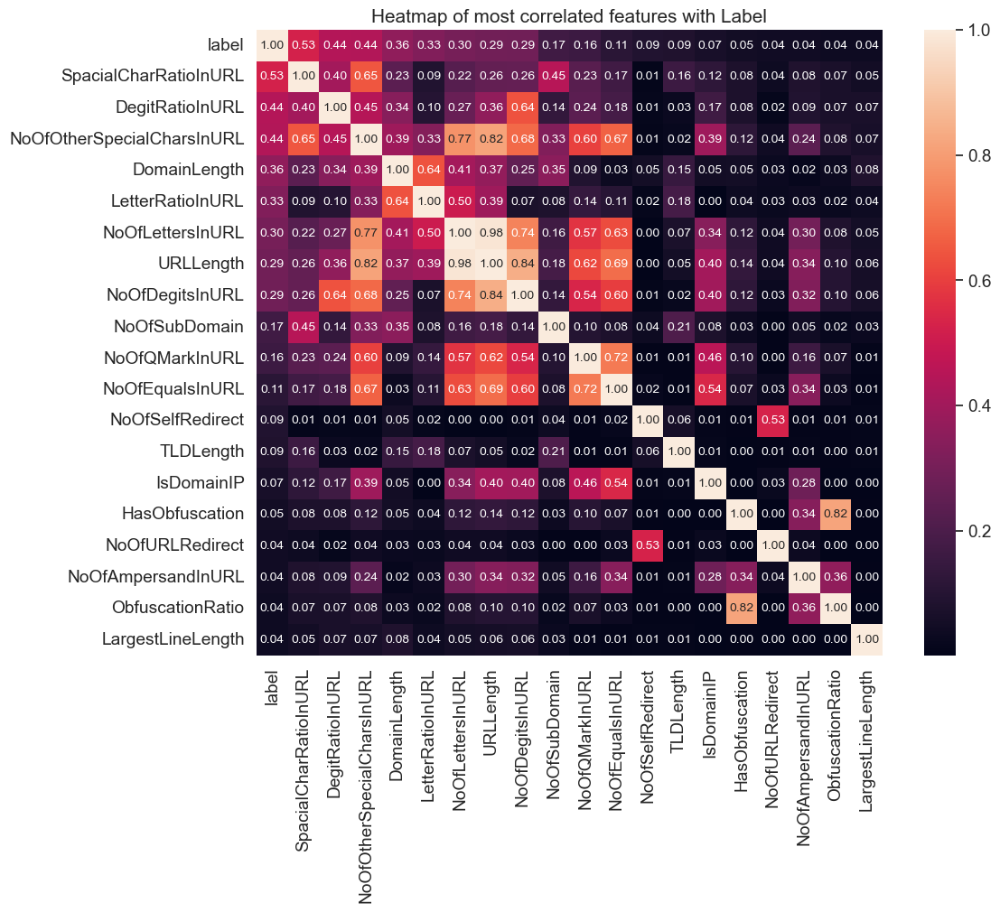

In [109]:
k = 20  # Number of variables for heatmap
# Select the k most correlated features with 'label'
cols = numerical_df.corr().nlargest(k, 'label')['label'].index
cm = np.corrcoef(numerical_df[cols].astype(float).values.T)
cm = np.abs(cm)

sns.set(font_scale=1.25)
f, ax = plt.subplots(figsize=(12, 9))
hm = sns.heatmap(cm, cbar=True, annot=True, square=True, fmt='.2f',
                 annot_kws={'size': 10}, yticklabels=cols.values, xticklabels=cols.values)
plt.title('Heatmap of most correlated features with Label')
plt.show()

The following code finds the variables most correlated to each other. It first finds the upper trinagle of the correlation matrix (column 'label' excluded) and then finds the variables that have a correlation index higher than 0.65, deleting, at last, the columns. This will ensure that there are no 'repeated' variables in the analysis.

In [111]:
correlation_matrix = numerical_df.drop(columns=['label']).corr().abs()

upper_triangle = correlation_matrix.where(
    np.triu(np.ones(correlation_matrix.shape), k=1).astype(bool)
)

threshold = 0.65  # Define the threshold
to_drop = [column for column in upper_triangle.columns if any(upper_triangle[column] > threshold)]

numerical_df = numerical_df.drop(columns=to_drop)

print(f"Removed {len(to_drop)} features due to high correlation.")
to_drop

Removed 14 features due to high correlation.


['CharContinuationRate',
 'TLDLegitimateProb',
 'NoOfObfuscatedChar',
 'ObfuscationRatio',
 'NoOfLettersInURL',
 'NoOfDegitsInURL',
 'DegitRatioInURL',
 'NoOfEqualsInURL',
 'NoOfQMarkInURL',
 'NoOfOtherSpecialCharsInURL',
 'SpacialCharRatioInURL',
 'URLTitleMatchScore',
 'HasSocialNet',
 'NoOfExternalRef']

<div class ="alert alert-info" role="alert">
    Display the correlation between the features and the label
</div>

#### Importance of calculating feature-label correlation before training a model

Before training any machine learning model, it is essential to calculate the correlation between features and the target label. This step helps to identify features that might introduce biases or overfitting in the model, particularly when certain features can uniquely assign the label based on their values. Here's why this is important:

1. **Avoiding Overfitting**:  
   If a feature has a strong correlation with the label, it may contain information that directly predicts the label with high accuracy. For example, if a feature has a certain value that always corresponds to a specific label (e.g., if a particular value in a feature always results in label 1), the model could simply "memorize" this relationship during training. This would lead to **overfitting**, where the model performs well on the training data but fails to generalize to unseen data.

2. **Preventing the Model from Learning Specific Value-Label Associations**:  
   Features that can uniquely assign the label based on their values create a situation where the model essentially "cheats" by associating certain feature values with a specific label class. For instance, if the `URLSimilarityIndex` always has a value of 100 for legitimate URLs (label 0) and varies widely for phishing URLs (label 1), the model could learn this exact relationship. This would result in a model that performs poorly when the feature values differ from this pattern in new, unseen data.

3. **Improving Generalization**:  
   By removing or adjusting features that have a direct, strong correlation with the label, I encourage the model to focus on more complex, generalizable patterns in the data. This allows the model to learn from the overall structure of the features rather than relying on specific, easily identifiable relationships that only exist in the training dataset.

4. **Feature Selection**:  
   Correlation analysis helps with **feature selection**, which is critical for reducing model complexity and improving performance. By removing features that offer no new information or are too strongly correlated with the label, I streamline the dataset, making the model more efficient and less prone to overfitting.

In conclusion, calculating the correlation between features and the target label is a critical preprocessing step that helps ensure that the model learns meaningful patterns rather than memorizing overly specific associations between features and labels. This leads to better model performance and improved generalization to new data.

In [114]:
correlation_matrix = numerical_df.corr().abs()
correlation_matrix['label'].sort_values(ascending=False)

label                    1.000000
URLSimilarityIndex       0.864502
HasCopyrightInfo         0.740908
HasDescription           0.679795
IsHTTPS                  0.648665
HasSubmitButton          0.582357
DomainTitleMatchScore    0.580103
IsResponsive             0.556170
HasHiddenFields          0.504133
HasFavicon               0.491770
HasTitle                 0.475394
URLCharProb              0.467475
Robots                   0.389646
NoOfJS                   0.363535
DomainLength             0.361325
Pay                      0.353236
LetterRatioInURL         0.327054
NoOfSelfRef              0.303925
URLLength                0.290704
NoOfImage                0.263437
LineOfCode               0.261791
NoOfiFrame               0.217117
Bank                     0.190458
NoOfSubDomain            0.168987
HasExternalFormSubmit    0.162718
HasPasswordField         0.162100
NoOfEmptyRef             0.105590
Crypto                   0.099555
TLD                      0.098861
NoOfSelfRedire

Based on the correlation results between the features and the label, I can see that several features exhibit strong correlations (>0.6). These features are particularly important to examine more closely, as they may have a significant impact on the classification performance. <br>

Features with correlation greater than 0.6:
- **URLSimilarityIndex (0.864502)**:
  This feature shows the strongest correlation with the label. A higher similarity index likely indicates a legitimate URL (label = 0), as phishing URLs typically have lower similarity to known URLs. This feature will be crucial for the model, as it directly helps differentiate between legitimate and phishing URLs.

- **HasCopyrightInfo (0.740908)**:
  Copyright information is typically found on legitimate websites. The absence of this information can be an indicator of phishing.

- **HasDescription (0.679795)**:
  URLs with descriptions appear to be more likely to be legitimate. 

- **IsHTTPS (0.648665)**:
  The feature has a strong correlation, meaning that phishing URLs are more likely to not use HTTPS, while legitimate URLs are more often secured with HTTPS.

<div class ="alert alert-info" role="alert">
    Analyse the correlation between the previous features and the label
</div>

**URLSimilarityIndex**

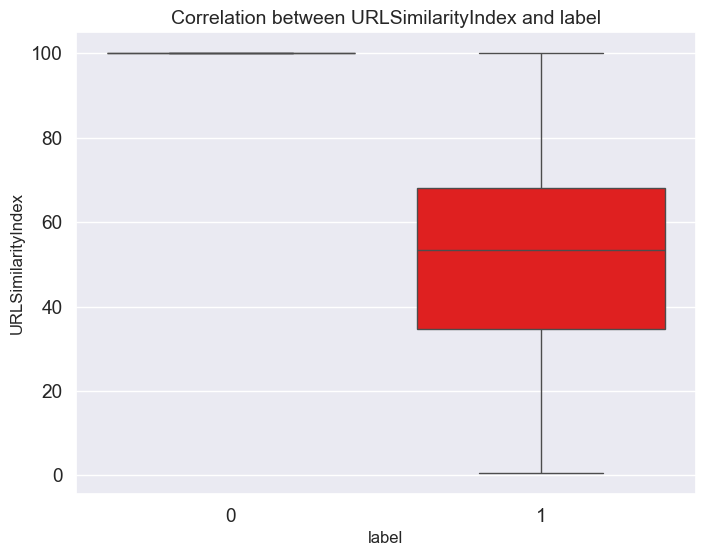

In [118]:
plt.figure(figsize=(8, 6))
sns.boxplot(x='label', y='URLSimilarityIndex', data=df, palette=custom_colors)

plt.title('Correlation between URLSimilarityIndex and label', fontsize=14)
plt.xlabel('label', fontsize=12)
plt.ylabel('URLSimilarityIndex', fontsize=12)
plt.show()

This feature has a **very strong correlation** with the label. In fact, when `URLSimilarityIndex = 100`, the label is almost always `0` (legitimate URL). Because this feature greatly influences the model’s classification decision and causes the model to easily distinguish between legitimate and phishing URLs, I decided to **remove this feature**.

**HasCopyrightInfo**

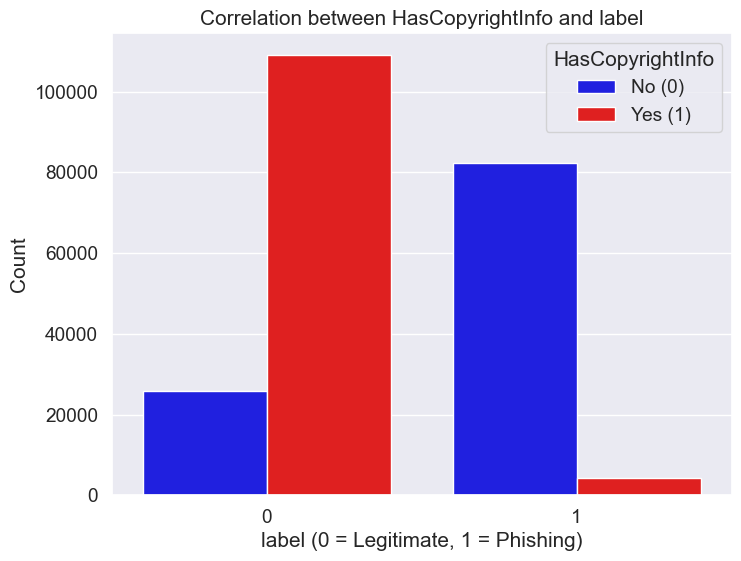

In [121]:
plt.figure(figsize=(8, 6))
sns.countplot(x='label', hue='HasCopyrightInfo', data=df, palette=custom_colors)
plt.title('Correlation between HasCopyrightInfo and label')
plt.xlabel('label (0 = Legitimate, 1 = Phishing)')
plt.ylabel('Count')
plt.legend(title='HasCopyrightInfo', labels=['No (0)', 'Yes (1)'])
plt.show()

This feature has a **strong correlation** with the label, in fact the vast majority of phishing URLs do not have copyright info (`HasCopyrightInfo = 0`). This fact could influence the model's decisions in the testing phase, I have therefore decided to **remove this feature**.

**HasDescription**

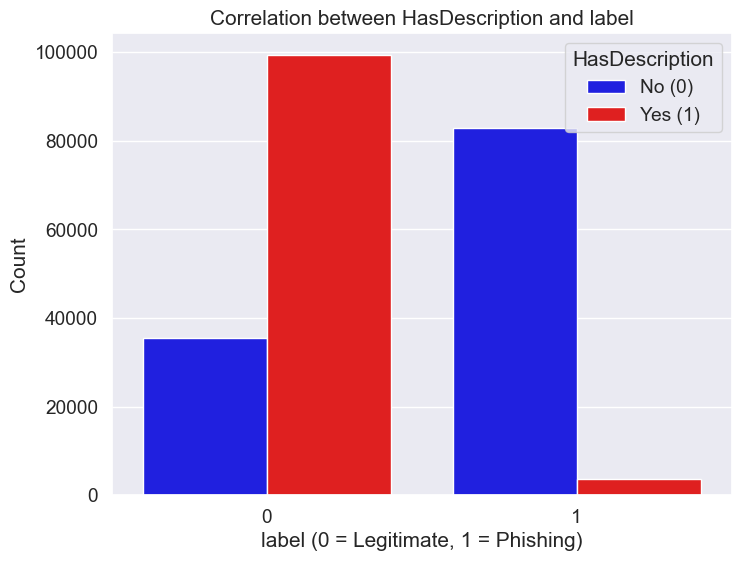

In [124]:
plt.figure(figsize=(8, 6))
sns.countplot(x='label', hue='HasDescription', data=df, palette=custom_colors)
plt.title('Correlation between HasDescription and label')
plt.xlabel('label (0 = Legitimate, 1 = Phishing)')
plt.ylabel('Count')
plt.legend(title='HasDescription', labels=['No (0)', 'Yes (1)'])
plt.show()

This feature has a **strong correlation** with the label, in fact the most of the phishing URLs do not have a description (`HasDescription = 0`). This fact could influence the model's decisions in the testing phase, I have therefore decided to **remove this feature**.

**IsHTTPS**

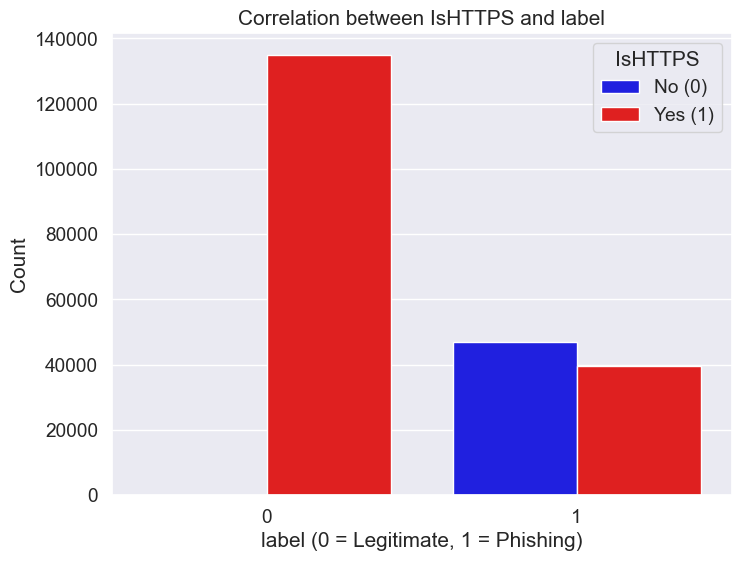

In [127]:
plt.figure(figsize=(8, 6))
sns.countplot(x='label', hue='IsHTTPS', data=df, palette=custom_colors)
plt.title('Correlation between IsHTTPS and label')
plt.xlabel('label (0 = Legitimate, 1 = Phishing)')
plt.ylabel('Count')
plt.legend(title='IsHTTPS', labels=['No (0)', 'Yes (1)'])
plt.show()

This feature shows a **very strong correlation** with the label. When `IsHTTPS = 0`, the label is always `1` (phishing URL). This strong relationship means the model could overfit based on this feature, so I decided to **remove it** from the model.

<div class ="alert alert-info" role="alert">
    Remove the features analysed before
</div>

In [130]:
numerical_df.drop(columns=['URLSimilarityIndex', 'HasCopyrightInfo', 'HasDescription', 'IsHTTPS'], inplace = True)

#### Split data

<div class ="alert alert-info" role="alert">
    Define training data and test data
</div>

In [133]:
X_train, X_test, y_train, y_test = train_test_split(
    numerical_df.drop(columns = ['label']), numerical_df['label'], test_size=0.25
)

<div class ="alert alert-info" role="alert">
    Performing standard scaling
</div>

In [135]:
standard_scaler = StandardScaler()

# Scale the features
train_scaled_features = standard_scaler.fit_transform(X_train)
test_scaled_features = standard_scaler.transform(X_test)

# Convert the scaled training data back to a DataFrame
X_train = pd.DataFrame(train_scaled_features, columns=X_train.columns)
X_test = pd.DataFrame(test_scaled_features, columns=X_train.columns)

<div class ="alert alert-info" role="alert">
    Display information about X_train
</div>

In [137]:
X_train.describe()

,URLLength,DomainLength,IsDomainIP,TLD,URLCharProb,TLDLength,NoOfSubDomain,HasObfuscation,LetterRatioInURL,NoOfAmpersandInURL,...,HasHiddenFields,HasPasswordField,Bank,Pay,Crypto,NoOfImage,NoOfCSS,NoOfJS,NoOfSelfRef,NoOfEmptyRef
count,1.660770e+05,1.660770e+05,1.660770e+05,1.660770e+05,1.660770e+05,1.660770e+05,1.660770e+05,1.660770e+05,1.660770e+05,1.660770e+05,...,1.660770e+05,1.660770e+05,1.660770e+05,1.660770e+05,1.660770e+05,1.660770e+05,1.660770e+05,1.660770e+05,1.660770e+05,1.660770e+05
mean,-3.482612e-17,1.686971e-16,3.443037e-17,2.344560e-17,-9.228067e-16,-8.238046e-17,5.647479e-17,1.525247e-17,9.125813e-17,2.070742e-17,...,-8.086163e-18,-1.816178e-17,-1.752002e-17,-5.407889e-17,-1.985175e-17,-2.353116e-18,1.080294e-18,3.608825e-17,-2.083578e-17,1.022536e-17
std,1.000003e+00,1.000003e+00,1.000003e+00,1.000003e+00,1.000003e+00,1.000003e+00,1.000003e+00,1.000003e+00,1.000003e+00,1.000003e+00,...,1.000003e+00,1.000003e+00,1.000003e+00,1.000003e+00,1.000003e+00,1.000003e+00,1.000003e+00,1.000003e+00,1.000003e+00,1.000003e+00
min,-6.409912e-01,-1.636156e+00,-5.194985e-02,-1.050769e+00,-5.285862e+00,-1.290769e+00,-4.481237e-01,-3.913763e-02,-4.255925e+00,-3.431026e-02,...,-8.059384e-01,-3.331917e-01,-3.862468e-01,-5.736212e-01,-1.584005e-01,-3.443815e-01,-7.569127e-02,-4.507771e-01,-3.611918e-01,-1.336423e-01
25%,-3.401501e-01,-6.445475e-01,-5.194985e-02,-1.007450e+00,-4.533549e-01,-1.290769e+00,-4.481237e-01,-3.913763e-02,-6.113710e-01,-3.431026e-02,...,-8.059384e-01,-3.331917e-01,-3.862468e-01,-5.736212e-01,-1.584005e-01,-3.443815e-01,-7.569127e-02,-4.507771e-01,-3.611918e-01,-1.336423e-01
50%,-2.064429e-01,-2.038324e-01,-5.194985e-02,-7.010944e-01,2.037859e-01,3.959916e-01,-4.481237e-01,-3.913763e-02,-6.678251e-02,-3.431026e-02,...,-8.059384e-01,-3.331917e-01,-3.862468e-01,-5.736212e-01,-1.584005e-01,-2.073270e-01,-5.316614e-02,-1.660982e-01,-2.467752e-01,-1.336423e-01
75%,-5.882199e-03,3.470614e-01,-5.194985e-02,1.043573e+00,6.664949e-01,3.959916e-01,-4.481237e-01,-3.913763e-02,6.118585e-01,-3.431026e-02,...,1.240790e+00,-3.331917e-01,-3.862468e-01,-5.736212e-01,-1.584005e-01,4.186304e-02,1.440927e-02,1.999174e-01,1.276790e-01,-7.967267e-02
max,5.802302e+01,9.712257e+00,1.924934e+01,1.043573e+00,3.327786e+00,1.726359e+01,5.378618e+00,2.555086e+01,3.401827e+00,2.079905e+02,...,1.240790e+00,3.001275e+00,2.589018e+00,1.743311e+00,6.313109e+00,1.112429e+02,4.033495e+02,2.824793e+02,1.421238e+02,2.636161e+02


<div class ="alert alert-info" role="alert">
    Display information about X_text
</div>

In [139]:
X_test.describe()

,URLLength,DomainLength,IsDomainIP,TLD,URLCharProb,TLDLength,NoOfSubDomain,HasObfuscation,LetterRatioInURL,NoOfAmpersandInURL,...,HasHiddenFields,HasPasswordField,Bank,Pay,Crypto,NoOfImage,NoOfCSS,NoOfJS,NoOfSelfRef,NoOfEmptyRef
count,55360.000000,55360.000000,55360.000000,55360.000000,55360.000000,55360.000000,55360.000000,55360.000000,55360.000000,55360.000000,...,55360.000000,55360.000000,55360.000000,55360.000000,55360.000000,55360.000000,55360.000000,55360.000000,55360.000000,55360.000000
mean,0.000292,0.001740,0.004183,-0.003713,-0.004450,-0.006869,0.006564,-0.007705,0.000794,-0.002213,...,-0.002701,-0.004443,0.004364,-0.003010,-0.005848,0.003247,-0.001419,-0.000881,-0.005268,0.006581
std,0.988925,0.996200,1.039376,0.999528,1.005871,0.996779,1.010810,0.896321,1.001260,0.882174,...,0.999418,0.994054,1.004795,0.998243,0.981831,1.068830,0.164254,0.671976,0.752262,0.922197
min,-0.640991,-1.525978,-0.051950,-1.050769,-5.276377,-1.290769,-0.448124,-0.039138,-4.255925,-0.034310,...,-0.805938,-0.333192,-0.386247,-0.573621,-0.158401,-0.344381,-0.075691,-0.450777,-0.361192,-0.133642
25%,-0.340150,-0.644548,-0.051950,-1.007450,-0.449668,-1.290769,-0.448124,-0.039138,-0.611371,-0.034310,...,-0.805938,-0.333192,-0.386247,-0.573621,-0.158401,-0.344381,-0.075691,-0.450777,-0.361192,-0.133642
50%,-0.206443,-0.203832,-0.051950,-0.701094,0.200067,0.395992,-0.448124,-0.039138,-0.066783,-0.034310,...,-0.805938,-0.333192,-0.386247,-0.573621,-0.158401,-0.207327,-0.053166,-0.166098,-0.246775,-0.133642
75%,-0.005882,0.347061,-0.051950,1.043573,0.662606,0.395992,-0.448124,-0.039138,0.611859,-0.034310,...,1.240790,-0.333192,-0.386247,-0.573621,-0.158401,0.041863,0.014409,0.199917,0.122478,-0.079673
max,46.591062,7.839218,19.249335,1.043573,3.314062,13.890073,5.378618,25.550860,3.158857,90.109758,...,1.240790,3.001275,2.589018,1.743311,6.313109,62.015420,22.685957,32.409298,36.949011,74.776260


<div class ="alert alert-info" role="alert">
    Display 5 random rows of the train dataframe
</div>

In [141]:
X_train.sample(5)

,URLLength,DomainLength,IsDomainIP,TLD,URLCharProb,TLDLength,NoOfSubDomain,HasObfuscation,LetterRatioInURL,NoOfAmpersandInURL,...,HasHiddenFields,HasPasswordField,Bank,Pay,Crypto,NoOfImage,NoOfCSS,NoOfJS,NoOfSelfRef,NoOfEmptyRef
30445,-0.206443,-0.203832,-0.05195,1.043573,0.292128,0.395992,-0.448124,-0.039138,0.092405,-0.03431,...,1.240790,-0.333192,2.589018,1.743311,-0.158401,0.602541,-0.030641,-0.206767,0.122478,-0.133642
129894,-0.139589,0.126704,-0.05195,-1.049299,0.564813,3.769512,-0.448124,-0.039138,0.653750,-0.03431,...,-0.805938,-0.333192,-0.386247,-0.573621,-0.158401,-0.344381,-0.075691,-0.450777,-0.361192,-0.133642
115964,-0.473857,-1.085263,-0.05195,-0.701094,0.049879,0.395992,-0.448124,-0.039138,-1.608387,-0.03431,...,1.240790,-0.333192,-0.386247,-0.573621,-0.158401,-0.032894,0.115772,0.159249,0.132880,-0.025703
42136,-0.106163,0.126704,-0.05195,1.043573,0.871111,0.395992,-0.448124,-0.039138,0.494563,-0.03431,...,1.240790,-0.333192,-0.386247,-0.573621,-0.158401,0.291053,-0.064429,0.484596,0.049668,-0.133642
136936,-0.306723,-0.534369,-0.05195,1.043573,1.377520,0.395992,-0.448124,-0.039138,-0.418670,-0.03431,...,1.240790,-0.333192,-0.386247,1.743311,-0.158401,0.079242,0.104510,0.362591,0.335709,-0.079673


Scaling the dataframe is important in machine learning projects because most of the algorithms are sensitive to the magnitude of input features. Otherwise, without scaling, features with larger numerical ranges can dominate the optimization process, which leads to biased model performance. Scaling ensures that all features contribute equally to improve convergence during training and enhance the accuracy and reliability of the predictions.

## 3. Supervised Learning

### 3.1 Linear classifier

Evaluation of the dataset using three different linear classifiers:
1. **Logistic Regression**
2. **Gaussian Naive Bayes**
3. **Support Vector Machine (SVM)**

#### 3.1.1 Logistic Regression

**Logistic Regression** is a linear model used for binary classification tasks, though it can be extended to multi-class problems. It models the probability of the default class using a logistic function (sigmoid function). It is widely used for classification tasks when the relationship between the input variables and the outcome is approximately linear. The logistic function maps predicted values between 0 and 1, representing probabilities.

<div class ="alert alert-info" role="alert">
    Define a Logistic Regression classifier, train it and evaluate it with different hyper-parameters using GridSearchCV
</div>

Define a new instance of the LR classifier

In [150]:
clf = LogisticRegression()

Define the search space of the hyper parameters of the selected model.

In [152]:
param_grid = {'C': np.linspace(0.1, 5.0, 25), 'max_iter': [20000], 'n_jobs': [6]}

In [153]:
param_grid

{'C': array([0.1       , 0.30416667, 0.50833333, 0.7125    , 0.91666667,
        1.12083333, 1.325     , 1.52916667, 1.73333333, 1.9375    ,
        2.14166667, 2.34583333, 2.55      , 2.75416667, 2.95833333,
        3.1625    , 3.36666667, 3.57083333, 3.775     , 3.97916667,
        4.18333333, 4.3875    , 4.59166667, 4.79583333, 5.        ]),
 'max_iter': [20000],
 'n_jobs': [6]}

`C` parameter controls the extent of the regularization.<br>
`max_iter` is the maximum number of iterations for model convergence.<br>
`n_jobs` represents the number of core CPU to use for parallel training.

Create the `GridSearchCV` object.<br>
I'm going to do a 3-fold cross-validation

In [156]:
search = GridSearchCV(clf, param_grid, cv=3, verbose=True)

Fit the search estimator on the train data to search for the best parameters

In [158]:
search.fit(X_train, y_train)

Fitting 3 folds for each of 25 candidates, totalling 75 fits


GridSearchCV(cv=3, estimator=LogisticRegression(),
             param_grid={'C': array([0.1       , 0.30416667, 0.50833333, 0.7125    , 0.91666667,
       1.12083333, 1.325     , 1.52916667, 1.73333333, 1.9375    ,
       2.14166667, 2.34583333, 2.55      , 2.75416667, 2.95833333,
       3.1625    , 3.36666667, 3.57083333, 3.775     , 3.97916667,
       4.18333333, 4.3875    , 4.59166667, 4.79583333, 5.        ]),
                         'max_iter': [20000], 'n_jobs': [6]},
             verbose=True)

Display the results

In [160]:
search.cv_results_

results_df = pd.DataFrame(search.cv_results_)
results_df

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_C,param_max_iter,param_n_jobs,params,split0_test_score,split1_test_score,split2_test_score,mean_test_score,std_test_score,rank_test_score
0,1.456748,0.289174,0.017674,0.004947,0.1,20000,6,"{'C': 0.1, 'max_iter': 20000, 'n_jobs': 6}",0.989288,0.989649,0.989975,0.989637,0.000280,25
1,1.321883,0.166556,0.018014,0.010068,0.304167,20000,6,"{'C': 0.3041666666666667, 'max_iter': 20000, '...",0.991420,0.992016,0.992485,0.991974,0.000436,24
2,1.879907,0.091602,0.018477,0.004025,0.508333,20000,6,"{'C': 0.5083333333333334, 'max_iter': 20000, '...",0.992377,0.992991,0.993443,0.992937,0.000437,23
3,2.062988,0.034395,0.015745,0.012787,0.7125,20000,6,"{'C': 0.7125, 'max_iter': 20000, 'n_jobs': 6}",0.993154,0.993858,0.993732,0.993581,0.000307,22
4,2.095737,0.016154,0.002864,0.004051,0.916667,20000,6,"{'C': 0.9166666666666667, 'max_iter': 20000, '...",0.993696,0.993985,0.994436,0.994039,0.000305,21
5,2.021822,0.142375,0.046993,0.012776,1.120833,20000,6,"{'C': 1.1208333333333336, 'max_iter': 20000, '...",0.994129,0.994472,0.994346,0.994316,0.000142,20
6,2.084336,0.036633,0.026988,0.023514,1.325,20000,6,"{'C': 1.3250000000000002, 'max_iter': 20000, '...",0.994183,0.994617,0.994653,0.994484,0.000213,18
7,2.055049,0.104969,0.037915,0.006605,1.529167,20000,6,"{'C': 1.529166666666667, 'max_iter': 20000, 'n...",0.993985,0.994725,0.994671,0.994460,0.000337,19
8,2.127875,0.017326,0.028807,0.013766,1.733333,20000,6,"{'C': 1.7333333333333336, 'max_iter': 20000, '...",0.994491,0.994816,0.995105,0.994804,0.000251,16
9,2.172191,0.085983,0.013287,0.013231,1.9375,20000,6,"{'C': 1.9375000000000002, 'max_iter': 20000, '...",0.994563,0.994906,0.994924,0.994798,0.000166,17


Display the best parameters

In [162]:
lr_best_params = search.best_params_
lr_best_params

{'C': 4.591666666666667, 'max_iter': 20000, 'n_jobs': 6}

Retrieve the best estimator

In [164]:
lr_best_clf = search.best_estimator_

Evaluate the best estimator in the test data

In [166]:
y_pred = lr_best_clf.predict(X_test)

In [167]:
print(f"Accuracy:  {accuracy_score(y_test, y_pred):.5f}")
print(f"Precision: {precision_score(y_test, y_pred):.5f}")
print(f"Recall:    {recall_score(y_test, y_pred):.5f}")
print(f"F1:        {f1_score(y_test, y_pred):.5f}")

Accuracy:  0.99644
Precision: 0.99396
Recall:    0.99695
F1:        0.99545


**Accuracy** measures the proportion of correct predictions.<br>
**Precision** focuses on the minimisation of false positives.<br>
**Recall** measures the ability to identify true positives.<br>
**F1-Score** is the harmonic mean of precision and recall.

Display the confusion matrix

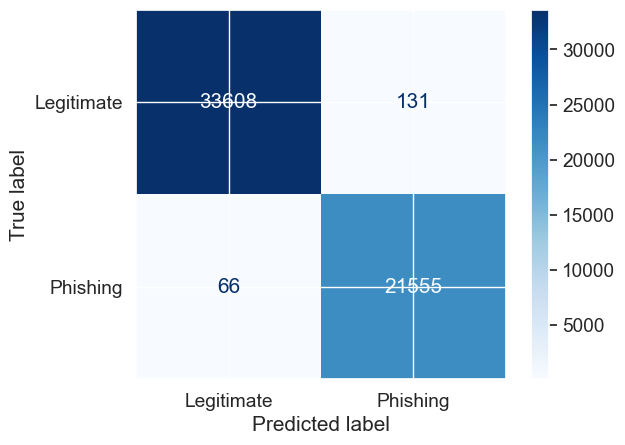

In [169]:
ConfusionMatrixDisplay.from_predictions(y_test, y_pred, display_labels=['Legitimate', 'Phishing'], cmap='Blues')
plt.show()

The **Confusion Matrix** demonstrates a very good performance with very few misclassifications. 

Overall, **Logistic Regression** showcases high accuracy, precision, recall and F1_Score.

#### 3.1.2 Gaussian Naive Bayes

**Gaussian Naive Bayes** is a probabilistic classifier based on Bayes' theorem, assuming that the features are conditionally independent given the class label. It assumes that the data for each class is normally distributed (i.e., follows a Gaussian distribution). This assumption allows the classifier to calculate the likelihood of each feature given the class label.

<div class ="alert alert-info" role="alert">
    Define a Gaussian Naive Bayes classifier, train it and evaluate it with different hyper-parameters using GridSearchCV
</div>

In [174]:
clf = GaussianNB()

Define the search space of the hyper parameters of the selected model.

In [176]:
param_grid = {'var_smoothing' : np.logspace(0, -9, 15)}
param_grid

{'var_smoothing': array([1.00000000e+00, 2.27584593e-01, 5.17947468e-02, 1.17876863e-02,
        2.68269580e-03, 6.10540230e-04, 1.38949549e-04, 3.16227766e-05,
        7.19685673e-06, 1.63789371e-06, 3.72759372e-07, 8.48342898e-08,
        1.93069773e-08, 4.39397056e-09, 1.00000000e-09])}

The `var_smoothing` parameter controls the level of variance smoothing to improve numerical stability.

Create the `GridSearchCV` object.<br>
I'm going to do a 3-fold cross-validation

In [179]:
search = GridSearchCV(clf, param_grid, cv=3, verbose=True)

Fit the search estimator on the train data to search for the best parameters

In [181]:
search.fit(X_train, y_train)

Fitting 3 folds for each of 15 candidates, totalling 45 fits


GridSearchCV(cv=3, estimator=GaussianNB(),
             param_grid={'var_smoothing': array([1.00000000e+00, 2.27584593e-01, 5.17947468e-02, 1.17876863e-02,
       2.68269580e-03, 6.10540230e-04, 1.38949549e-04, 3.16227766e-05,
       7.19685673e-06, 1.63789371e-06, 3.72759372e-07, 8.48342898e-08,
       1.93069773e-08, 4.39397056e-09, 1.00000000e-09])},
             verbose=True)

Display the results

In [183]:
search.cv_results_

{'mean_fit_time': array([0.101185  , 0.1096228 , 0.12550704, 0.16290299, 0.11175116,
        0.13187106, 0.13566168, 0.14627878, 0.11279845, 0.12501629,
        0.14833792, 0.14579773, 0.12501518, 0.12771074, 0.12213294]),
 'std_fit_time': array([5.43505170e-03, 1.28803538e-02, 3.31634228e-02, 3.37495170e-02,
        1.00998500e-02, 2.79198309e-02, 1.47473641e-02, 4.16235339e-02,
        6.58116668e-03, 1.76637258e-06, 1.03784399e-02, 4.04640798e-02,
        2.21065881e-02, 1.59517409e-02, 2.03697324e-02]),
 'mean_score_time': array([0.07000573, 0.07811848, 0.06263113, 0.09921304, 0.07088232,
        0.0729204 , 0.07691487, 0.09936047, 0.08332912, 0.05726949,
        0.10943198, 0.07824683, 0.06279079, 0.06772359, 0.05743742]),
 'std_score_time': array([0.01034388, 0.02551785, 0.01293612, 0.02667495, 0.016716  ,
        0.0147232 , 0.01428979, 0.04008573, 0.007368  , 0.00735897,
        0.01274248, 0.02199594, 0.01271444, 0.00735092, 0.00747428]),
 'param_var_smoothing': masked_array(d

In [184]:
results_df = pd.DataFrame(search.cv_results_)
results_df

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_var_smoothing,params,split0_test_score,split1_test_score,split2_test_score,mean_test_score,std_test_score,rank_test_score
0,0.101185,0.005435,0.070006,0.010344,1.0,{'var_smoothing': 1.0},0.910981,0.928593,0.935422,0.924999,0.010296,12
1,0.109623,0.012880,0.078118,0.025518,0.227585,{'var_smoothing': 0.22758459260747882},0.909897,0.919236,0.931755,0.920296,0.008955,13
2,0.125507,0.033163,0.062631,0.012936,0.051795,{'var_smoothing': 0.0517947467923121},0.926028,0.931556,0.942611,0.933398,0.006894,10
3,0.162903,0.033750,0.099213,0.026675,0.011788,{'var_smoothing': 0.011787686347935866},0.945989,0.948175,0.956159,0.950107,0.004371,8
4,0.111751,0.010100,0.070882,0.016716,0.002683,{'var_smoothing': 0.0026826957952797246},0.961145,0.961813,0.965931,0.962963,0.002117,6
5,0.131871,0.027920,0.072920,0.014723,0.000611,{'var_smoothing': 0.0006105402296585327},0.969797,0.969201,0.971188,0.970062,0.000833,4
6,0.135662,0.014747,0.076915,0.014290,0.000139,{'var_smoothing': 0.0001389495494373136},0.973988,0.972453,0.972344,0.972928,0.000751,1
7,0.146279,0.041624,0.099360,0.040086,0.000032,{'var_smoothing': 3.1622776601683795e-05},0.974458,0.972362,0.970935,0.972585,0.001447,2
8,0.112798,0.006581,0.083329,0.007368,0.000007,{'var_smoothing': 7.196856730011514e-06},0.972453,0.970628,0.968749,0.970610,0.001512,3
9,0.125016,0.000002,0.057269,0.007359,0.000002,{'var_smoothing': 1.6378937069540613e-06},0.970158,0.968370,0.961741,0.966756,0.003621,5


Display the best parameters

In [186]:
gnb_best_params = search.best_params_
gnb_best_params

{'var_smoothing': 0.0001389495494373136}

Retrieve the best estimator.

In [188]:
gnb_best_clf = search.best_estimator_

Evaluate the best estimator in the test data

In [190]:
y_pred = gnb_best_clf.predict(X_test)

In [191]:
print(f"Accuracy:  {accuracy_score(y_test, y_pred):.5f}")
print(f"Precision: {precision_score(y_test, y_pred):.5f}")
print(f"Recall:    {recall_score(y_test, y_pred):.5f}")
print(f"F1:        {f1_score(y_test, y_pred):.5f}")

Accuracy:  0.97363
Precision: 0.98499
Recall:    0.94690
F1:        0.96557


Display the confusion matrix

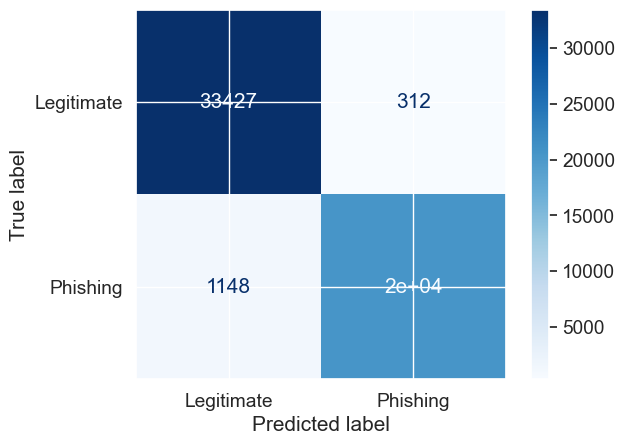

In [193]:
ConfusionMatrixDisplay.from_predictions(y_test, y_pred, display_labels=['Legitimate', 'Phishing'], cmap='Blues')
plt.show()

**Accuracy** is high, meaning that the model correctly classifies the vast majority of phishing and legitimate links. **Precision** is also high, underlining low false positives. **F1_Score** demonstrates a good trade-off between precision and recall. Nevertheless, about 6% of phishing links are missed by the model, even though the recall is high overall. 

**Gaussian-Naive Bayes** assumes that features are conditionally independent and follow a Gaussian distribution, so if the actual data distribution deviates significantly from this assumption, the model may struggle to fit the data properly, leading to false negatives. 

#### 3.1.3 Support Vector Machine

**Support Vector Machine (SVM)** is a powerful classifier that works by finding a hyperplane that best separates the data into different classes. The optimal hyperplane is the one that maximizes the margin, i.e., the distance between the nearest data points of each class, which are known as support vectors.

<div class ="alert alert-info" role="alert">
    Define a Support Vector Machine classifier, train it and evaluate it with different hyper-parameters using GridSearchCV
</div>

In [198]:
clf = SVC()

Define the search space of the hyper parameters of the selected model.

In [200]:
param_grid = {'C' : np.linspace(0.1, 2.0, 10), 'kernel':['linear']}
param_grid

{'C': array([0.1       , 0.31111111, 0.52222222, 0.73333333, 0.94444444,
        1.15555556, 1.36666667, 1.57777778, 1.78888889, 2.        ]),
 'kernel': ['linear']}

`C` parameter controls the extent of the regularization.<br>
`kernel` parameter defines the type of function used to transform the input features into higher dimensions where a linear separation is easier. 

Create the `GridSearchCV` object.<br>
I'm going to do a 3-fold cross-validation

In [203]:
search = GridSearchCV(clf, param_grid, cv=3, verbose=True)

Fit the search estimator on the train data to search for the best parameters

In [205]:
search.fit(X_train, y_train)

Fitting 3 folds for each of 10 candidates, totalling 30 fits


GridSearchCV(cv=3, estimator=SVC(),
             param_grid={'C': array([0.1       , 0.31111111, 0.52222222, 0.73333333, 0.94444444,
       1.15555556, 1.36666667, 1.57777778, 1.78888889, 2.        ]),
                         'kernel': ['linear']},
             verbose=True)

Display the results

In [207]:
search.cv_results_

{'mean_fit_time': array([88.13016685, 74.71192129, 70.93797874, 66.2463541 , 62.42739042,
        62.09886217, 59.38059942, 58.46209065, 56.76284194, 57.8144687 ]),
 'std_fit_time': array([9.8807339 , 6.12842677, 0.76881432, 2.91095714, 1.58439091,
        3.35426537, 1.93990133, 1.86794476, 3.23760272, 2.13852958]),
 'mean_score_time': array([14.6666232 ,  9.94250711,  8.39704227,  8.42126401,  8.43032471,
         7.6474402 ,  7.73160442,  7.16508357,  7.09148558,  6.7512029 ]),
 'std_score_time': array([4.22688926, 0.82666941, 0.13650618, 0.29428673, 0.39852101,
        0.39775683, 0.42583377, 0.40972331, 0.40215665, 0.09842162]),
 'param_C': masked_array(data=[0.1, 0.3111111111111111, 0.5222222222222223,
                    0.7333333333333333, 0.9444444444444444,
                    1.1555555555555557, 1.3666666666666667,
                    1.577777777777778, 1.788888888888889, 2.0],
              mask=[False, False, False, False, False, False, False, False,
                    Fa

In [208]:
results_df = pd.DataFrame(search.cv_results_)
results_df

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_C,param_kernel,params,split0_test_score,split1_test_score,split2_test_score,mean_test_score,std_test_score,rank_test_score
0,88.130167,9.880734,14.666623,4.226889,0.1,linear,"{'C': 0.1, 'kernel': 'linear'}",0.993063,0.993244,0.993551,0.993286,0.000201,10
1,74.711921,6.128427,9.942507,0.826669,0.311111,linear,"{'C': 0.3111111111111111, 'kernel': 'linear'}",0.994906,0.995014,0.995231,0.995050,0.000135,9
2,70.937979,0.768814,8.397042,0.136506,0.522222,linear,"{'C': 0.5222222222222223, 'kernel': 'linear'}",0.995340,0.995647,0.995719,0.995568,0.000164,8
3,66.246354,2.910957,8.421264,0.294287,0.733333,linear,"{'C': 0.7333333333333333, 'kernel': 'linear'}",0.995665,0.995881,0.995954,0.995833,0.000123,7
4,62.427390,1.584391,8.430325,0.398521,0.944444,linear,"{'C': 0.9444444444444444, 'kernel': 'linear'}",0.995845,0.996189,0.996297,0.996110,0.000192,6
5,62.098862,3.354265,7.647440,0.397757,1.155556,linear,"{'C': 1.1555555555555557, 'kernel': 'linear'}",0.995990,0.996279,0.996423,0.996231,0.000180,5
6,59.380599,1.939901,7.731604,0.425834,1.366667,linear,"{'C': 1.3666666666666667, 'kernel': 'linear'}",0.996134,0.996351,0.996586,0.996357,0.000184,4
7,58.462091,1.867945,7.165084,0.409723,1.577778,linear,"{'C': 1.577777777777778, 'kernel': 'linear'}",0.996225,0.996387,0.996748,0.996453,0.000219,3
8,56.762842,3.237603,7.091486,0.402157,1.788889,linear,"{'C': 1.788888888888889, 'kernel': 'linear'}",0.996279,0.996315,0.996803,0.996465,0.000239,2
9,57.814469,2.138530,6.751203,0.098422,2.0,linear,"{'C': 2.0, 'kernel': 'linear'}",0.996297,0.996351,0.996785,0.996478,0.000218,1


Display the best parameters

In [210]:
svm_best_params = search.best_params_
svm_best_params

{'C': 2.0, 'kernel': 'linear'}

Retrieve the best estimator.

In [212]:
svm_best_clf = search.best_estimator_

Evaluate the best estimator in the test data

In [214]:
y_pred = svm_best_clf.predict(X_test)

In [215]:
print(f"Accuracy:  {accuracy_score(y_test, y_pred):.5f}")
print(f"Precision: {precision_score(y_test, y_pred):.5f}")
print(f"Recall:    {recall_score(y_test, y_pred):.5f}")
print(f"F1:        {f1_score(y_test, y_pred):.5f}")

Accuracy:  0.99706
Precision: 0.99598
Recall:    0.99648
F1:        0.99623


Display the confusion matrix

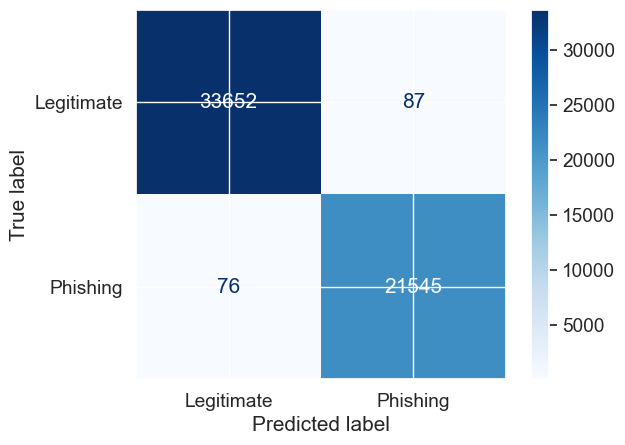

In [217]:
ConfusionMatrixDisplay.from_predictions(y_test, y_pred, display_labels=['Legitimate', 'Phishing'], cmap='Blues')
plt.show()

**Accuracy** is high, indicating that the model is performs correctly overall. **Precision** is high too, meaning that the model is highly confident when predicting phishign, with very few false positives. **Recall** is high too, meaning that false negatives are minimised, and **F1-Score**'s value indicates a strong balance between precision and recall. The **Confusion Matrix** shows few false positives and false negatives, indicating very good performance.

#### 3.1.4 Conclusion on Linear classifiers

The evaluation of **Linear Classifiers** for this dataset reveals some key insights regarding their strengths, weakenesses, and overall performance. In particular, the **Logistic Regression** classifier achieved high accuracy, precision, recall and F1_score, demonstrating its ability to handle linearly separable data efficiently; it works well with linear relationship between features and may underperform otherwise. 
The **Gaussian Naive Bayes** classifier achieved strong overall accuracy but struggled with false negatives, namely phishing links classified as legitimate. Its main limitation is that it assumes feature independence and Gaussian distribution, that may not hold in real situations. In addition, false negatives could be problematic in phishing detection, where missing phishing links can have severe consequences. 

### 3.2 Non-Linear classifiers

Evaluation of the dataset using three different non-linear classifiers:
1. **Decision Tree**
2. **k-Nearest Neighbors**
3. **Deep Neural Network**

#### 3.2.1 Decision Tree

**Decision Tree** is a non-linear classifier used for classification and regression, which splits data recursively based on decision rules, creating a tree-like structure of nodes for decision-making. 

<div class ="alert alert-info" role="alert">
    Define a Decision Tree classifier, train it and evaluate it with different hyper-parameters using RandomSearchCV
</div>

In [226]:
clf =  DecisionTreeClassifier()

Define the search space of the hyper parameters of the selected model.

In [228]:
param_grid = {'max_depth': [5, 10, 15], 'min_samples_split': [2, 5, 10]}
param_grid

{'max_depth': [5, 10, 15], 'min_samples_split': [2, 5, 10]}

The `max_depth` parameter indicates the maximum depth of the tree in order not to incur in overfitting.<br>
The parameter `min_samples_split` represents the minimum number of samples requierd to split an internal node.

Create the `RandomSearchCV` object.<br>
I'm going to do a 3-fold cross-validation

In [231]:
search = RandomizedSearchCV(clf, param_grid, n_iter=50, cv=3, verbose=True)

Fit the search estimator on the train data to search for the best parameters

In [233]:
search.fit(X_train, y_train)

Fitting 3 folds for each of 9 candidates, totalling 27 fits


RandomizedSearchCV(cv=3, estimator=DecisionTreeClassifier(), n_iter=50,
                   param_distributions={'max_depth': [5, 10, 15],
                                        'min_samples_split': [2, 5, 10]},
                   verbose=True)

Display the results

In [235]:
search.cv_results_

{'mean_fit_time': array([0.6524229 , 0.69458469, 0.6437335 , 1.11932588, 1.14174636,
        1.1366384 , 1.49723069, 1.5181876 , 1.49916426]),
 'std_fit_time': array([0.00876075, 0.04406761, 0.01191791, 0.02484682, 0.03876427,
        0.01121529, 0.02311034, 0.02639669, 0.02756351]),
 'mean_score_time': array([0.02101215, 0.02061494, 0.01563271, 0.02584982, 0.02652001,
        0.02084184, 0.02599502, 0.01572402, 0.0260311 ]),
 'std_score_time': array([7.60426063e-03, 7.49240457e-03, 1.93930062e-05, 7.62780551e-03,
        7.74018686e-03, 7.35395160e-03, 7.34906317e-03, 1.13440708e-04,
        7.34726640e-03]),
 'param_min_samples_split': masked_array(data=[2, 5, 10, 2, 5, 10, 2, 5, 10],
              mask=[False, False, False, False, False, False, False, False,
                    False],
        fill_value='?',
             dtype=object),
 'param_max_depth': masked_array(data=[5, 5, 5, 10, 10, 10, 15, 15, 15],
              mask=[False, False, False, False, False, False, False, False,

In [236]:
results_df = pd.DataFrame(search.cv_results_)
results_df

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_min_samples_split,param_max_depth,params,split0_test_score,split1_test_score,split2_test_score,mean_test_score,std_test_score,rank_test_score
0,0.652423,0.008761,0.021012,0.007604,2,5,"{'min_samples_split': 2, 'max_depth': 5}",0.993605,0.993407,0.992774,0.993262,0.000354,7
1,0.694585,0.044068,0.020615,0.007492,5,5,"{'min_samples_split': 5, 'max_depth': 5}",0.993605,0.993352,0.992774,0.993244,0.000348,9
2,0.643734,0.011918,0.015633,0.000019,10,5,"{'min_samples_split': 10, 'max_depth': 5}",0.993605,0.993407,0.992774,0.993262,0.000354,7
3,1.119326,0.024847,0.025850,0.007628,2,10,"{'min_samples_split': 2, 'max_depth': 10}",0.996821,0.996297,0.996911,0.996676,0.000271,4
4,1.141746,0.038764,0.026520,0.007740,5,10,"{'min_samples_split': 5, 'max_depth': 10}",0.996893,0.996315,0.996622,0.996610,0.000236,6
5,1.136638,0.011215,0.020842,0.007354,10,10,"{'min_samples_split': 10, 'max_depth': 10}",0.996929,0.996387,0.996712,0.996676,0.000223,4
6,1.497231,0.023110,0.025995,0.007349,2,15,"{'min_samples_split': 2, 'max_depth': 15}",0.997435,0.996785,0.996839,0.997019,0.000295,1
7,1.518188,0.026397,0.015724,0.000113,5,15,"{'min_samples_split': 5, 'max_depth': 15}",0.997363,0.996658,0.996911,0.996977,0.000291,2
8,1.499164,0.027564,0.026031,0.007347,10,15,"{'min_samples_split': 10, 'max_depth': 15}",0.997345,0.996676,0.996748,0.996923,0.000299,3


Display the best parameters.

In [238]:
dt_best_params = search.best_params_
dt_best_params

{'min_samples_split': 2, 'max_depth': 15}

Retrieve the best estimator.

In [240]:
dt_best_clf = search.best_estimator_

Evaluate the best estimator in the test data.

In [242]:
y_pred = dt_best_clf.predict(X_test)

In [243]:
print(f"Accuracy:  {accuracy_score(y_test, y_pred):.5f}")
print(f"Precision: {precision_score(y_test, y_pred):.5f}")
print(f"Recall:    {recall_score(y_test, y_pred):.5f}")
print(f"F1:        {f1_score(y_test, y_pred):.5f}")

Accuracy:  0.99754
Precision: 0.99690
Recall:    0.99681
F1:        0.99685


Display the confusion matrix

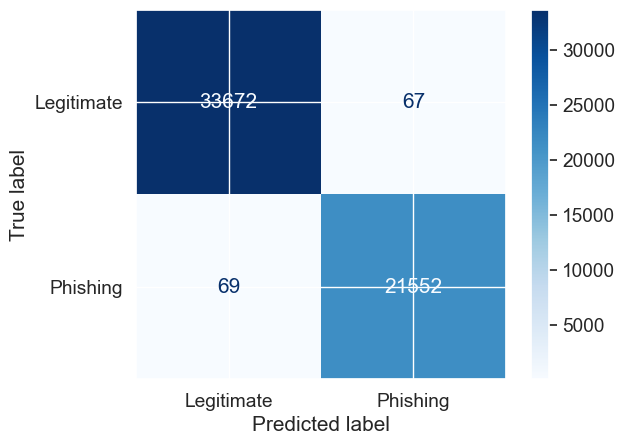

In [245]:
ConfusionMatrixDisplay.from_predictions(y_test, y_pred, display_labels=['Legitimate', 'Phishing'], cmap='Blues')
plt.show()

The **Confusion Matrix** shows that false positives and false negatives are pretty low, with most predictions being correct, coherently with the high precision and recall scores. This balance ensures reliable detection of phishing links without penalizing legitimate users.

Visualise the tree

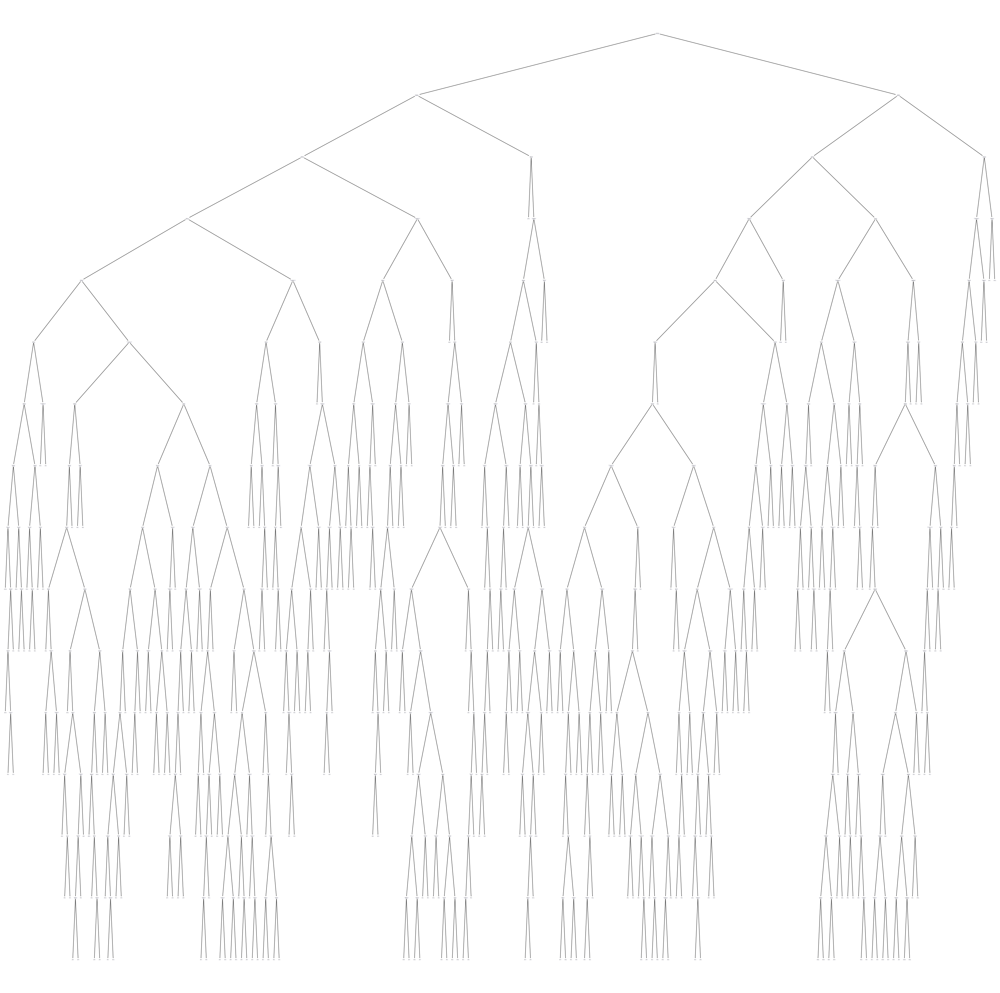

In [247]:
plt.figure(figsize=(50, 50))
plot_tree(dt_best_clf, feature_names=list(X_train.columns))
plt.show()

The tree is quite deep and complex due to the `max_depth` = 15. Each split represents a decision based on features values and captures complex decision boundaries. Features importance could be further analysed to understand which features contribute most to the model's decisions.

#### 3.2.2 k-Nearest Neighbors

**k-Nearest Neighbors (k-NN)** is a simple algorithm that classifies data points based on the majority class of their k nearest neighbors. It's used for classification and regression, relying on distance metrics (e.g., Euclidean) to find similarities.

<div class ="alert alert-info" role="alert">
    Define a k-Nearest Neighbors classifier, train it and evaluate it with different hyper-parameters using RandomSearchCV
</div>

In [252]:
clf = KNeighborsClassifier()

Define the search space of the hyper parameters of the selected model.

In [254]:
param_grid = {'n_neighbors': [3, 5, 7, 9], 'weights': ['uniform', 'distance'], 'n_jobs': [6]}
param_grid

{'n_neighbors': [3, 5, 7, 9],
 'weights': ['uniform', 'distance'],
 'n_jobs': [6]}

The `n_neighbors` parameter specifies the number of nearest neighbors to consider for majority voting.<br>
The `weights` parameter determines how the neighbors contribute to the classification (uniform meaning equal contribution, distance that closer neighbors contribute more than farther ones).<br>
The `n_jobs` parameter represents the number of core CPU to use for parallel training.

Create the `RandomSearchCV` object.<br>
I'm going to do a 3-fold cross-validation

In [257]:
search = RandomizedSearchCV(clf, param_grid, n_iter=50, cv=3, verbose=True)

Fit the search estimator on the train data to search for the best parameters

In [259]:
search.fit(X_train, y_train)

Fitting 3 folds for each of 8 candidates, totalling 24 fits


RandomizedSearchCV(cv=3, estimator=KNeighborsClassifier(), n_iter=50,
                   param_distributions={'n_jobs': [6],
                                        'n_neighbors': [3, 5, 7, 9],
                                        'weights': ['uniform', 'distance']},
                   verbose=True)

Display the results

In [261]:
search.cv_results_

{'mean_fit_time': array([0.07553951, 0.05730573, 0.05208556, 0.04167708, 0.03935591,
        0.07497056, 0.05210209, 0.04686324]),
 'std_fit_time': array([2.24082396e-02, 1.47302143e-02, 7.38287324e-03, 7.35434411e-03,
        6.39293040e-03, 3.97240229e-02, 7.37283405e-03, 6.19155296e-05]),
 'mean_score_time': array([22.73182193, 16.98397231, 22.77539158, 17.19454662, 22.60683497,
        17.21481252, 23.05104582, 17.22159576]),
 'std_score_time': array([0.32200093, 0.09088501, 0.4206508 , 0.13649124, 0.11551776,
        0.23992917, 0.51951748, 0.25990386]),
 'param_weights': masked_array(data=['uniform', 'distance', 'uniform', 'distance',
                    'uniform', 'distance', 'uniform', 'distance'],
              mask=[False, False, False, False, False, False, False, False],
        fill_value='?',
             dtype=object),
 'param_n_neighbors': masked_array(data=[3, 3, 5, 5, 7, 7, 9, 9],
              mask=[False, False, False, False, False, False, False, False],
        fill

In [262]:
results_df = pd.DataFrame(search.cv_results_)
results_df

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_weights,param_n_neighbors,param_n_jobs,params,split0_test_score,split1_test_score,split2_test_score,mean_test_score,std_test_score,rank_test_score
0,0.075540,0.022408,22.731822,0.322001,uniform,3,6,"{'weights': 'uniform', 'n_neighbors': 3, 'n_jo...",0.983761,0.983562,0.983959,0.983761,0.000162,2
1,0.057306,0.014730,16.983972,0.090885,distance,3,6,"{'weights': 'distance', 'n_neighbors': 3, 'n_j...",0.984321,0.984104,0.984664,0.984363,0.000231,1
2,0.052086,0.007383,22.775392,0.420651,uniform,5,6,"{'weights': 'uniform', 'n_neighbors': 5, 'n_jo...",0.982315,0.982370,0.982604,0.982430,0.000125,6
3,0.041677,0.007354,17.194547,0.136491,distance,5,6,"{'weights': 'distance', 'n_neighbors': 5, 'n_j...",0.983291,0.983399,0.983761,0.983484,0.000201,3
4,0.039356,0.006393,22.606835,0.115518,uniform,7,6,"{'weights': 'uniform', 'n_neighbors': 7, 'n_jo...",0.981575,0.981647,0.981665,0.981629,0.000039,7
5,0.074971,0.039724,17.214813,0.239929,distance,7,6,"{'weights': 'distance', 'n_neighbors': 7, 'n_j...",0.983164,0.983092,0.983381,0.983213,0.000123,4
6,0.052102,0.007373,23.051046,0.519517,uniform,9,6,"{'weights': 'uniform', 'n_neighbors': 9, 'n_jo...",0.980672,0.980527,0.980870,0.980690,0.000141,8
7,0.046863,0.000062,17.221596,0.259904,distance,9,6,"{'weights': 'distance', 'n_neighbors': 9, 'n_j...",0.982568,0.982315,0.982857,0.982580,0.000221,5


Display the best parameters.

In [264]:
knn_best_params = search.best_params_
knn_best_params

{'weights': 'distance', 'n_neighbors': 3, 'n_jobs': 6}

Retrieve the best estimator.

In [266]:
knn_best_clf = search.best_estimator_

Evaluate the best estimator in the test data.

In [268]:
y_pred = knn_best_clf.predict(X_test)

In [269]:
print(f"Accuracy:  {accuracy_score(y_test, y_pred):.5f}")
print(f"Precision: {precision_score(y_test, y_pred):.5f}")
print(f"Recall:    {recall_score(y_test, y_pred):.5f}")
print(f"F1:        {f1_score(y_test, y_pred):.5f}")

Accuracy:  0.98647
Precision: 0.98132
Recall:    0.98409
F1:        0.98270


Display the confusion matrix

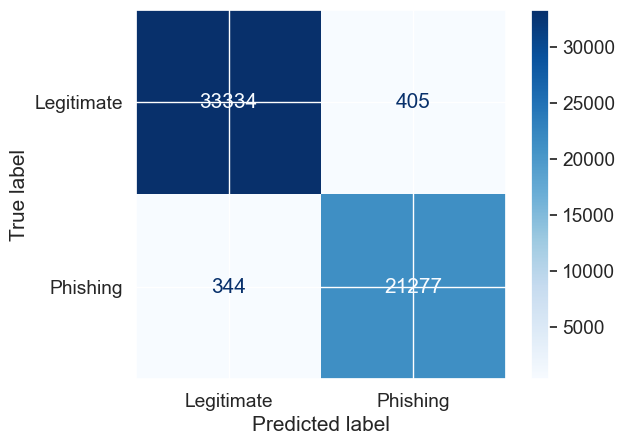

In [271]:
ConfusionMatrixDisplay.from_predictions(y_test, y_pred, display_labels=['Legitimate', 'Phishing'], cmap='Blues')
plt.show()

The **k-NN** model performs some misclassifications, which are almost equally distributed among false positives and false negatives.

#### 3.2.3 Deep Neural Network

**Deep Neural Network (DNN)** is a machine learning model composed of multiple layers of interconnected neurons. It can learn complex patterns from large datasets, and processes data through a series of transformations.

<div class ="alert alert-info" role="alert">
    Define a Deep Neural Network classifier, train it and evaluate it with different hyper-parameters using RandomSearchCV
</div>

In [276]:
clf = MLPClassifier()

Define the search space of the hyper parameters of the selected model.

In [278]:
param_grid = {'learning_rate_init' : [0.001, 0.01, 0.1], 'hidden_layer_sizes': [2, 3, 4]}
param_grid

{'learning_rate_init': [0.001, 0.01, 0.1], 'hidden_layer_sizes': [2, 3, 4]}

The `learning_rate_init` parameter defines the step size at each iteration during the optimization process, with smaller values providing more precise updates but taking longer.<br>
The `hidden_layer_sizes` parameter specifies the architecture of the neural network, where the number indicates the layers and neurons in each layer.

Create the `RandomSearchCV` object.<br>
I'm going to do a 3-fold cross-validation

In [281]:
search = RandomizedSearchCV(clf, param_grid, n_iter=50, cv=3, verbose=True)

Fit the search estimator on the train data to search for the best parameters

In [283]:
search.fit(X_train, y_train)

Fitting 3 folds for each of 9 candidates, totalling 27 fits


RandomizedSearchCV(cv=3, estimator=MLPClassifier(), n_iter=50,
                   param_distributions={'hidden_layer_sizes': [2, 3, 4],
                                        'learning_rate_init': [0.001, 0.01,
                                                               0.1]},
                   verbose=True)

Display the results

In [285]:
search.cv_results_

{'mean_fit_time': array([28.79538568, 22.46329713, 14.27529184, 30.76753084, 27.34235406,
        14.82877858, 29.39560366, 22.20029449, 13.63284302]),
 'std_fit_time': array([2.05513227, 4.14787589, 1.44838916, 2.7775707 , 3.40033454,
        2.19072273, 1.1586913 , 5.98742688, 1.52711763]),
 'mean_score_time': array([0.01562095, 0.02622024, 0.0208598 , 0.02173948, 0.03124205,
        0.01562452, 0.03130666, 0.02081855, 0.02084629]),
 'std_score_time': array([1.56317277e-05, 7.50528288e-03, 7.40904308e-03, 5.37116432e-03,
        2.21067561e-02, 1.14109301e-05, 2.20650364e-02, 7.33096668e-03,
        7.36833893e-03]),
 'param_learning_rate_init': masked_array(data=[0.001, 0.01, 0.1, 0.001, 0.01, 0.1, 0.001, 0.01, 0.1],
              mask=[False, False, False, False, False, False, False, False,
                    False],
        fill_value='?',
             dtype=object),
 'param_hidden_layer_sizes': masked_array(data=[2, 2, 2, 3, 3, 3, 4, 4, 4],
              mask=[False, False, Fals

In [286]:
results_df = pd.DataFrame(search.cv_results_)
results_df

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_learning_rate_init,param_hidden_layer_sizes,params,split0_test_score,split1_test_score,split2_test_score,mean_test_score,std_test_score,rank_test_score
0,28.795386,2.055132,0.015621,0.000016,0.001,2,"{'learning_rate_init': 0.001, 'hidden_layer_si...",0.996405,0.995899,0.996730,0.996345,0.000342,6
1,22.463297,4.147876,0.026220,0.007505,0.01,2,"{'learning_rate_init': 0.01, 'hidden_layer_siz...",0.997254,0.997308,0.997038,0.997200,0.000117,2
2,14.275292,1.448389,0.020860,0.007409,0.1,2,"{'learning_rate_init': 0.1, 'hidden_layer_size...",0.995105,0.994888,0.996243,0.995412,0.000594,9
3,30.767531,2.777571,0.021739,0.005371,0.001,3,"{'learning_rate_init': 0.001, 'hidden_layer_si...",0.996947,0.996983,0.997453,0.997128,0.000230,5
4,27.342354,3.400335,0.031242,0.022107,0.01,3,"{'learning_rate_init': 0.01, 'hidden_layer_siz...",0.996568,0.997453,0.997634,0.997218,0.000466,1
5,14.828779,2.190723,0.015625,0.000011,0.1,3,"{'learning_rate_init': 0.1, 'hidden_layer_size...",0.996026,0.994617,0.996514,0.995719,0.000804,8
6,29.395604,1.158691,0.031307,0.022065,0.001,4,"{'learning_rate_init': 0.001, 'hidden_layer_si...",0.996893,0.996803,0.997724,0.997140,0.000415,3
7,22.200294,5.987427,0.020819,0.007331,0.01,4,"{'learning_rate_init': 0.01, 'hidden_layer_siz...",0.996387,0.996658,0.998374,0.997140,0.000880,3
8,13.632843,1.527118,0.020846,0.007368,0.1,4,"{'learning_rate_init': 0.1, 'hidden_layer_size...",0.997128,0.994942,0.996261,0.996110,0.000899,7


Display the best parameters.

In [288]:
dnn_best_params = search.best_params_
dnn_best_params

{'learning_rate_init': 0.01, 'hidden_layer_sizes': 3}

Retrieve the best estimator.

In [290]:
dnn_best_clf = search.best_estimator_

Evaluate the best estimator in the test data.

In [292]:
y_pred = dnn_best_clf.predict(X_test)

In [293]:
print(f"Accuracy:  {accuracy_score(y_test, y_pred):.5f}")
print(f"Precision: {precision_score(y_test, y_pred):.5f}")
print(f"Recall:    {recall_score(y_test, y_pred):.5f}")
print(f"F1:        {f1_score(y_test, y_pred):.5f}")

Accuracy:  0.99713
Precision: 0.99791
Recall:    0.99473
F1:        0.99632


Display the confusion matrix

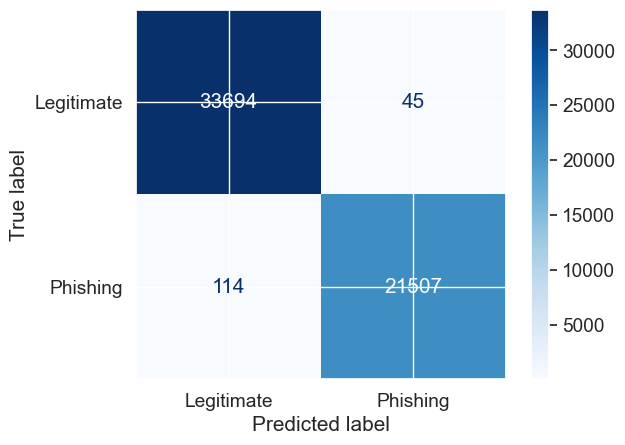

In [295]:
ConfusionMatrixDisplay.from_predictions(y_test, y_pred, display_labels=['Legitimate', 'Phishing'], cmap='Blues')
plt.show()

The **Confusion Matrix** visuallly displays the results of the classification, highlighting that the model has a very low error rate, with very few false positives and false negatives, achieving near-perfect classification. The model is thus highly reliable and effective, balancing precision and recall.

#### 3.2.4 Conclusion on Non-Linear classifiers

Non-Linear classifiers perform well on this dataset, with all of them displaying high levels of accuracy, precision, recall and F1. **k-NN** is the one that performs worst among the three non-linear classifiers.

### 3.3 Ensemble classifiers

Evaluation of the dataset using two different ensemble classifiers:
1. **XGBoost**
2. **Random Forest**

#### 3.3.1 XGBoost

**XGBoost (Extreme Gradient Boosting)** is a machine learning algorithm based on gradient boosting. It optimizes model performance using efficient techniques like parallelization and regularization, making it ideal for structured/tabular data in classification and regression tasks.

<div class ="alert alert-info" role="alert">
    Define a XGBoost classifier, train it and evaluate it with different hyper-parameters using RandomSearchCV
</div>

In [304]:
clf = XGBClassifier()

Define the search space of the hyper parameters of the selected model.

In [306]:
param_grid = {'n_estimators' : [50, 100, 200], 'max_depth': [3, 5, 7, 10], 'n_jobs': [6]}
param_grid

{'n_estimators': [50, 100, 200], 'max_depth': [3, 5, 7, 10], 'n_jobs': [6]}

The parameter `n_estimators` determines the number of boosting rounds.<br>
The `max_depth` one limits the depth of each tree to avoid overfitting.<br>
The `n_jobs` parameter represents the number of core CPU to use for parallel training.

Create the `RandomSearchCV` object.<br>
I'm going to do a 3-fold cross-validation

In [309]:
search = RandomizedSearchCV(clf, param_grid, n_iter=50, cv=3, verbose=True)

Fit the search estimator on the train data to search for the best parameters

In [311]:
search.fit(X_train, y_train)

Fitting 3 folds for each of 12 candidates, totalling 36 fits


RandomizedSearchCV(cv=3,
                   estimator=XGBClassifier(base_score=None, booster=None,
                                           callbacks=None,
                                           colsample_bylevel=None,
                                           colsample_bynode=None,
                                           colsample_bytree=None, device=None,
                                           early_stopping_rounds=None,
                                           enable_categorical=False,
                                           eval_metric=None, feature_types=None,
                                           gamma=None, grow_policy=None,
                                           importance_type=None,
                                           interaction_constraints=None,
                                           learning_rate...
                                           max_cat_threshold=None,
                                           max_cat_to_onehot=None,
                                           max_delta_step=None, max_depth=None,
                                           max_leaves=None,
                                           min_child_weight=None, missing=nan,
                                           monotone_constraints=None,
                                           multi_strategy=None,
                                           n_estimators=None, n_jobs=None,
                                           num_parallel_tree=None,
                                           random_state=None, ...),
                   n_iter=50,
                   param_distributions={'max_depth': [3, 5, 7, 10],
                                        'n_estimators': [50, 100, 200],
                                        'n_jobs': [6]},
                   verbose=True)

Display the results

In [313]:
search.cv_results_

{'mean_fit_time': array([1.31973449, 0.72585162, 1.28234108, 0.53335881, 0.87862476,
        1.63145351, 0.61162972, 0.99283282, 1.73336339, 0.64927419,
        1.05428783, 1.7498498 ]),
 'std_fit_time': array([1.23205631, 0.01151799, 0.01037822, 0.00935901, 0.0166244 ,
        0.02189757, 0.0308496 , 0.01150504, 0.01415227, 0.01131347,
        0.02233346, 0.01195184]),
 'mean_score_time': array([0.04686117, 0.06280462, 0.0885129 , 0.05439488, 0.09442472,
        0.12921723, 0.06773011, 0.10943786, 0.17727264, 0.07717609,
        0.11273011, 0.15273539]),
 'std_score_time': array([3.18845668e-05, 2.59474591e-04, 7.33831373e-03, 6.36501037e-03,
        9.09408680e-04, 5.59149657e-03, 7.39668192e-03, 1.00156678e-04,
        7.62481454e-03, 1.78908521e-03, 4.73217562e-03, 1.73803095e-02]),
 'param_n_jobs': masked_array(data=[6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6],
              mask=[False, False, False, False, False, False, False, False,
                    False, False, False, False],
    

In [314]:
results_df = pd.DataFrame(search.cv_results_)
results_df

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_n_jobs,param_n_estimators,param_max_depth,params,split0_test_score,split1_test_score,split2_test_score,mean_test_score,std_test_score,rank_test_score
0,1.319734,1.232056,0.046861,0.000032,6,50,3,"{'n_jobs': 6, 'n_estimators': 50, 'max_depth': 3}",0.998356,0.998248,0.998717,0.998440,0.000201,12
1,0.725852,0.011518,0.062805,0.000259,6,100,3,"{'n_jobs': 6, 'n_estimators': 100, 'max_depth'...",0.998826,0.998681,0.998916,0.998808,0.000097,7
2,1.282341,0.010378,0.088513,0.007338,6,200,3,"{'n_jobs': 6, 'n_estimators': 200, 'max_depth'...",0.999025,0.998898,0.999115,0.999013,0.000089,1
3,0.533359,0.009359,0.054395,0.006365,6,50,5,"{'n_jobs': 6, 'n_estimators': 50, 'max_depth': 5}",0.998754,0.998447,0.998952,0.998717,0.000208,10
4,0.878625,0.016624,0.094425,0.000909,6,100,5,"{'n_jobs': 6, 'n_estimators': 100, 'max_depth'...",0.999079,0.998645,0.999079,0.998934,0.000204,3
5,1.631454,0.021898,0.129217,0.005591,6,200,5,"{'n_jobs': 6, 'n_estimators': 200, 'max_depth'...",0.999043,0.998826,0.999151,0.999006,0.000135,2
6,0.611630,0.030850,0.067730,0.007397,6,50,7,"{'n_jobs': 6, 'n_estimators': 50, 'max_depth': 7}",0.998844,0.998483,0.998880,0.998736,0.000179,9
7,0.992833,0.011505,0.109438,0.000100,6,100,7,"{'n_jobs': 6, 'n_estimators': 100, 'max_depth'...",0.998934,0.998736,0.999006,0.998892,0.000115,5
8,1.733363,0.014152,0.177273,0.007625,6,200,7,"{'n_jobs': 6, 'n_estimators': 200, 'max_depth'...",0.999025,0.998772,0.998952,0.998916,0.000106,4
9,0.649274,0.011313,0.077176,0.001789,6,50,10,"{'n_jobs': 6, 'n_estimators': 50, 'max_depth':...",0.998736,0.998465,0.998898,0.998699,0.000179,11


Display the best parameters.

In [316]:
xgb_best_params = search.best_params_
xgb_best_params

{'n_jobs': 6, 'n_estimators': 200, 'max_depth': 3}

Retrieve the best estimator.

In [318]:
xgb_best_clf = search.best_estimator_

Evaluate the best estimator in the test data.

In [320]:
y_pred = xgb_best_clf.predict(X_test)

In [321]:
print(f"Accuracy:  {accuracy_score(y_test, y_pred):.5f}")
print(f"Precision: {precision_score(y_test, y_pred):.5f}")
print(f"Recall:    {recall_score(y_test, y_pred):.5f}")
print(f"F1:        {f1_score(y_test, y_pred):.5f}")

Accuracy:  0.99942
Precision: 0.99944
Recall:    0.99907
F1:        0.99926


Display the confusion matrix

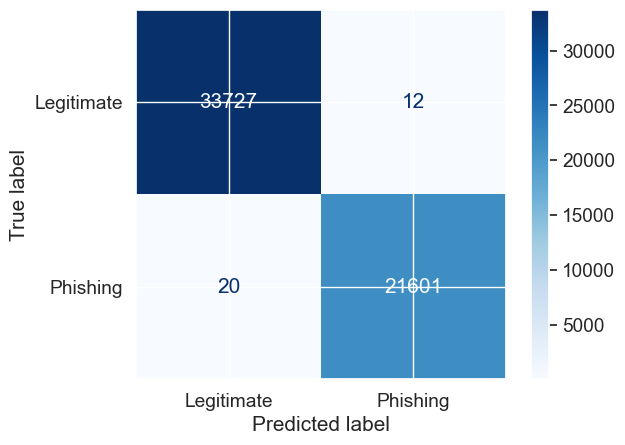

In [323]:
ConfusionMatrixDisplay.from_predictions(y_test, y_pred, display_labels=['Legitimate', 'Phishing'], cmap='Blues')
plt.show()

The metrics and the **Confusion Matrix** reflect nearly perfect classification performance, with a very small number of false positives and false negatives. The misclassification of legitimate data as phishing is minimal, and the same can be said for missed phishing cases, even though the number is slightly higher. The trade-off between recall and precision is balanced, showing the model is effective in both detecting phishing and avoiding false alarms.

#### 3.3.2 Random Forest

**Random Forest** is an ensemble learning algorithm that combines multiple decision trees to improve accuracy and reduce overfitting, used for classification and regression tasks.

<div class ="alert alert-info" role="alert">
    Define a Random Forest classifier, train it and evaluate it with different hyper-parameters using RandomSearchCV
</div>

In [328]:
clf = RandomForestClassifier()

Define the search space of the hyper parameters of the selected model.

In [330]:
param_grid = {'n_estimators': [50, 100, 200], 'max_depth':[10, 20, 30], 'n_jobs': [6]}
param_grid

{'n_estimators': [50, 100, 200], 'max_depth': [10, 20, 30], 'n_jobs': [6]}

The parameter `n_estimators` identifies the number of trees in the forest.<br>
`max_depth` one defines the maximum depth of each tree.<br>
`n_jobs` parameter represents the number of core CPU to use for parallel training.

Create the `RandomSearchCV` object.<br>
I'm going to do a 3-fold cross-validation

In [333]:
search = RandomizedSearchCV(clf, param_grid, n_iter=50, cv=3, verbose=True)

Fit the search estimator on the train data to search for the best parameters

In [335]:
search.fit(X_train, y_train)

Fitting 3 folds for each of 9 candidates, totalling 27 fits


RandomizedSearchCV(cv=3, estimator=RandomForestClassifier(), n_iter=50,
                   param_distributions={'max_depth': [10, 20, 30],
                                        'n_estimators': [50, 100, 200],
                                        'n_jobs': [6]},
                   verbose=True)

Display the results

In [337]:
search.cv_results_

{'mean_fit_time': array([ 2.27658423,  4.41884875,  8.67098467,  2.71894614,  5.18762104,
        10.23480407,  2.66787688,  5.26777244, 10.27318827]),
 'std_fit_time': array([0.05335262, 0.07146486, 0.04188083, 0.02375757, 0.08749361,
        0.18366511, 0.09235213, 0.11454535, 0.21108121]),
 'mean_score_time': array([0.13031665, 0.25135644, 0.42812451, 0.17763217, 0.29172556,
        0.46993383, 0.1493659 , 0.27157664, 0.48357916]),
 'std_score_time': array([0.0075917 , 0.01847384, 0.02602697, 0.0147568 , 0.01658436,
        0.01041532, 0.00739187, 0.03973991, 0.00868568]),
 'param_n_jobs': masked_array(data=[6, 6, 6, 6, 6, 6, 6, 6, 6],
              mask=[False, False, False, False, False, False, False, False,
                    False],
        fill_value='?',
             dtype=object),
 'param_n_estimators': masked_array(data=[50, 100, 200, 50, 100, 200, 50, 100, 200],
              mask=[False, False, False, False, False, False, False, False,
                    False],
        

In [338]:
results_df = pd.DataFrame(search.cv_results_)
results_df

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_n_jobs,param_n_estimators,param_max_depth,params,split0_test_score,split1_test_score,split2_test_score,mean_test_score,std_test_score,rank_test_score
0,2.276584,0.053353,0.130317,0.007592,6,50,10,"{'n_jobs': 6, 'n_estimators': 50, 'max_depth':...",0.997887,0.997652,0.998374,0.997971,0.000301,9
1,4.418849,0.071465,0.251356,0.018474,6,100,10,"{'n_jobs': 6, 'n_estimators': 100, 'max_depth'...",0.998031,0.997634,0.998410,0.998025,0.000317,8
2,8.670985,0.041881,0.428125,0.026027,6,200,10,"{'n_jobs': 6, 'n_estimators': 200, 'max_depth'...",0.997995,0.997760,0.998338,0.998031,0.000237,7
3,2.718946,0.023758,0.177632,0.014757,6,50,20,"{'n_jobs': 6, 'n_estimators': 50, 'max_depth':...",0.998176,0.998085,0.998681,0.998314,0.000262,6
4,5.187621,0.087494,0.291726,0.016584,6,100,20,"{'n_jobs': 6, 'n_estimators': 100, 'max_depth'...",0.998392,0.998176,0.998681,0.998416,0.000207,4
5,10.234804,0.183665,0.469934,0.010415,6,200,20,"{'n_jobs': 6, 'n_estimators': 200, 'max_depth'...",0.998374,0.998176,0.998772,0.998440,0.000248,2
6,2.667877,0.092352,0.149366,0.007392,6,50,30,"{'n_jobs': 6, 'n_estimators': 50, 'max_depth':...",0.998392,0.998248,0.998681,0.998440,0.000180,2
7,5.267772,0.114545,0.271577,0.039740,6,100,30,"{'n_jobs': 6, 'n_estimators': 100, 'max_depth'...",0.998338,0.998302,0.998808,0.998483,0.000230,1
8,10.273188,0.211081,0.483579,0.008686,6,200,30,"{'n_jobs': 6, 'n_estimators': 200, 'max_depth'...",0.998284,0.998230,0.998736,0.998416,0.000227,4


Display the best parameters.

In [340]:
rf_best_params = search.best_params_
rf_best_params

{'n_jobs': 6, 'n_estimators': 100, 'max_depth': 30}

Retrieve the best estimator.

In [342]:
rf_best_clf = search.best_estimator_

Evaluate the best estimator in the test data.

In [344]:
y_pred = rf_best_clf.predict(X_test)

In [345]:
print(f"Accuracy:  {accuracy_score(y_test, y_pred):.5f}")
print(f"Precision: {precision_score(y_test, y_pred):.5f}")
print(f"Recall:    {recall_score(y_test, y_pred):.5f}")
print(f"F1:        {f1_score(y_test, y_pred):.5f}")

Accuracy:  0.99884
Precision: 0.99931
Recall:    0.99773
F1:        0.99852


Display the confusion matrix

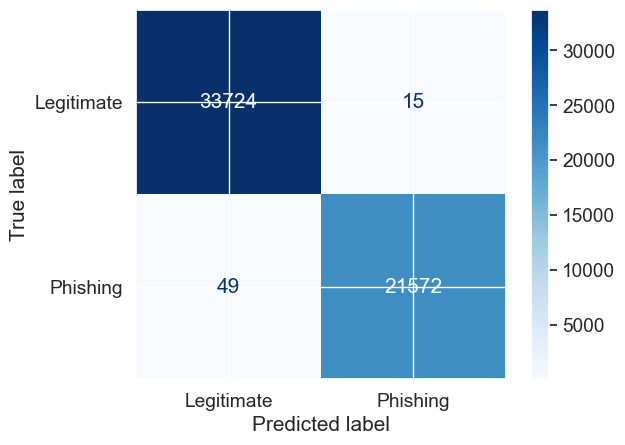

In [347]:
ConfusionMatrixDisplay.from_predictions(y_test, y_pred, display_labels=['Legitimate', 'Phishing'], cmap='Blues')
plt.show()

The metrics and the **Confusion Matrix** shows a low number of false positives, suggesting a very good precision for identifying legitimate examples. The false negatives are also minimal, indicating strong recall for detecting phishing cases. **Random Forest** performs very well with high precision, recall, and accuracy.

#### 3.3.3 Conclusion on Ensemble classifiers

**Ensemble classifiers** are the best-performing models in this task, a scenario requiring both precision and recall.

### 3.4 Supervised Learning classifiers comparison

In [352]:
clf_dict = {
    'Logistic Regression': LogisticRegression(
        C=lr_best_params['C'], max_iter=lr_best_params['max_iter'], n_jobs=lr_best_params['n_jobs']
    ).fit(X_train, y_train),
    
    'Gaussian Naive Bayes': GaussianNB(
        var_smoothing=gnb_best_params['var_smoothing']
    ).fit(X_train, y_train),
    
    'Support Vector Machine': SVC(
        C=svm_best_params['C'], kernel=svm_best_params['kernel'], probability=True
    ).fit(X_train, y_train),
    
    'Decision Tree': DecisionTreeClassifier(
        max_depth=dt_best_params['max_depth'], min_samples_split=dt_best_params['min_samples_split']
    ).fit(X_train, y_train),
    
    'k-Nearest Neighbors': KNeighborsClassifier(
        n_neighbors=knn_best_params['n_neighbors'], weights=knn_best_params['weights'], n_jobs=knn_best_params['n_jobs']
    ).fit(X_train, y_train),
    
    'Deep Neural Network': MLPClassifier(
        learning_rate_init=dnn_best_params['learning_rate_init'], hidden_layer_sizes=dnn_best_params['hidden_layer_sizes']
    ).fit(X_train, y_train),
    
    'XGBoost': XGBClassifier(
        max_depth=xgb_best_params['max_depth'], n_estimators=xgb_best_params['n_estimators'], n_jobs=xgb_best_params['n_jobs']
    ).fit(X_train, y_train),
    
    'Random Forest': RandomForestClassifier(
        n_estimators=rf_best_params['n_estimators'], max_depth=rf_best_params['max_depth'], n_jobs=rf_best_params['n_jobs']
    ).fit(X_train, y_train)
}

#### 3.4.1  Precision - Recall

The **Precision-Recall** curve shows the trade-off between precision and recall for a classifier, highlighting its ability to balance false positives and false negatives in predicting the positive class. It underscores the trade-off between **Precision** and **Recall** as the decision threshold varies.

Logistic Regression

In [356]:
clf = clf_dict['Logistic Regression']

y_proba = clf.predict_proba(X_test)
lr_pr, lr_rc, _ = precision_recall_curve(y_test, y_proba[:, 1])
lr_avg_prec = average_precision_score(y_test, y_proba[:, 1])

Gaussian Naive Bayes

In [358]:
clf = clf_dict['Gaussian Naive Bayes']

y_proba = clf.predict_proba(X_test)
gnb_pr, gnb_rc, _ = precision_recall_curve(y_test, y_proba[:, 1])
gnb_avg_prec = average_precision_score(y_test, y_proba[:, 1])

Support Vector Machine

In [360]:
clf = clf_dict['Support Vector Machine']

y_proba = clf.predict_proba(X_test)
svm_pr, svm_rc, _ = precision_recall_curve(y_test, y_proba[:, 1])
svm_avg_prec = average_precision_score(y_test, y_proba[:, 1])

Decision Tree

In [362]:
clf = clf_dict['Decision Tree']

y_proba = clf.predict_proba(X_test)
dt_pr, dt_rc, _ = precision_recall_curve(y_test, y_proba[:, 1])
dt_avg_prec = average_precision_score(y_test, y_proba[:, 1])

k-Nearest Neighbors

In [364]:
clf = clf_dict['k-Nearest Neighbors']

y_proba = clf.predict_proba(X_test)
knn_pr, knn_rc, _ = precision_recall_curve(y_test, y_proba[:, 1])
knn_avg_prec = average_precision_score(y_test, y_proba[:, 1])

Deep Neural Network

In [366]:
clf = clf_dict['Deep Neural Network']

y_proba = clf.predict_proba(X_test)
dnn_pr, dnn_rc, _ = precision_recall_curve(y_test, y_proba[:, 1])
dnn_avg_prec = average_precision_score(y_test, y_proba[:, 1])

XGBoost

In [368]:
clf = clf_dict['XGBoost']

y_proba = clf.predict_proba(X_test)
xgb_pr, xgb_rc, _ = precision_recall_curve(y_test, y_proba[:, 1])
xgb_avg_prec = average_precision_score(y_test, y_proba[:, 1])

Random Forest

In [370]:
clf = clf_dict['Random Forest']

y_proba = clf.predict_proba(X_test)
rf_pr, rf_rc, _ = precision_recall_curve(y_test, y_proba[:, 1])
rf_avg_prec = average_precision_score(y_test, y_proba[:, 1])

Plot a unique chart with all the curves

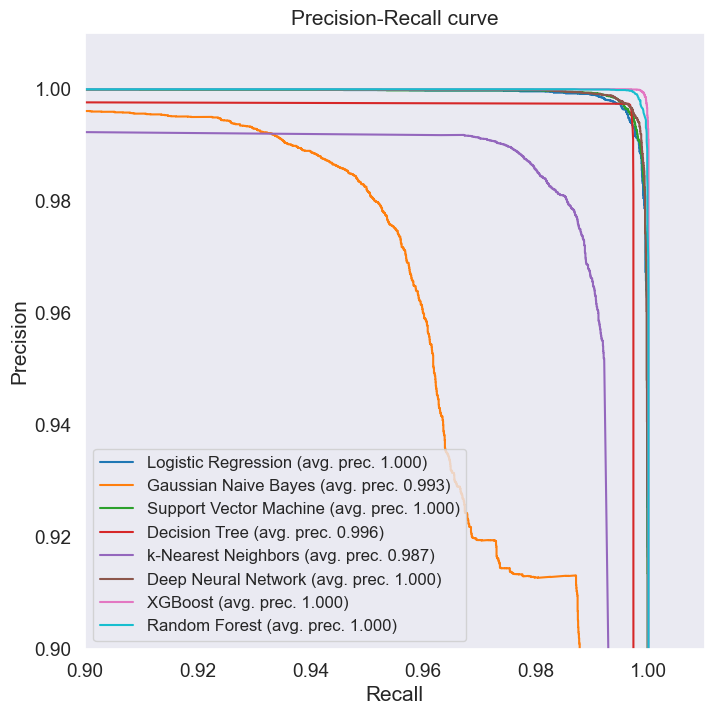

In [372]:
plt.figure(figsize=(8, 8))

plt.plot(lr_rc, lr_pr, c='tab:blue', label=f'Logistic Regression (avg. prec. {lr_avg_prec:.3f})')
plt.plot(gnb_rc, gnb_pr, c='tab:orange', label=f'Gaussian Naive Bayes (avg. prec. {gnb_avg_prec:.3f})')
plt.plot(svm_rc, svm_pr, c='tab:green', label=f'Support Vector Machine (avg. prec. {svm_avg_prec:.3f})')
plt.plot(dt_rc, dt_pr, c='tab:red', label=f'Decision Tree (avg. prec. {dt_avg_prec:.3f})')
plt.plot(knn_rc, knn_pr, c='tab:purple', label=f'k-Nearest Neighbors (avg. prec. {knn_avg_prec:.3f})')
plt.plot(dnn_rc, dnn_pr, c='tab:brown', label=f'Deep Neural Network (avg. prec. {dnn_avg_prec:.3f})')
plt.plot(xgb_rc, xgb_pr, c='tab:pink', label=f'XGBoost (avg. prec. {xgb_avg_prec:.3f})')
plt.plot(rf_rc, rf_pr, c='tab:cyan', label=f'Random Forest (avg. prec. {rf_avg_prec:.3f})')

plt.xlim([0.90, 1.01])
plt.ylim([0.90, 1.01])
plt.grid()
plt.legend(fontsize=12)

plt.title('Precision-Recall curve')
plt.xlabel('Recall')
plt.ylabel('Precision')

plt.show()

The **Precision-Recall** curve should stay close to the top-right corner of the graph for high performing classifiers, indicating both high precision and recall. As recall increases, precision tends to decrease beacuse predicting more positives often increases false positives. The graph shows that all classifiers except for **Gaussian Naive Bayes** and **k-NN** are very close to the top right-corner. In particular, the **Gaussian Naive Bayes** classifier shows a drop in precision as recall increases, so not maintaining near-perfect precision across the recall spectrum. 

Plot 3 different sub-charts for better readability

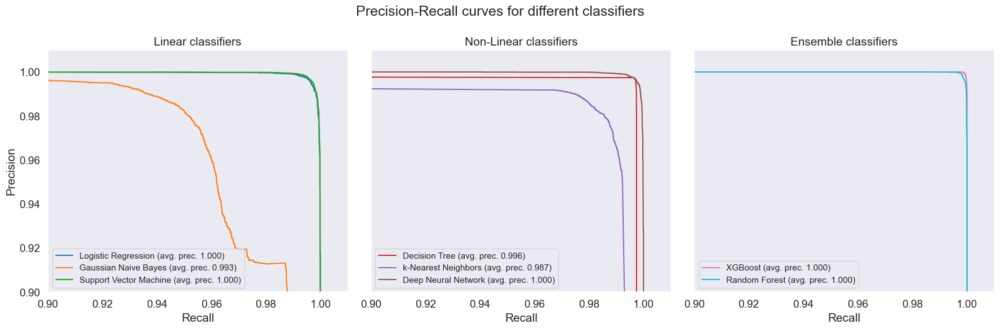

In [374]:
# Create a figure with 3 side-by-side subplots
fig, axes = plt.subplots(1, 3, figsize=(18, 6), sharex=True, sharey=True)

# Set the common x and y axis limits for all plots
x_min, x_max = 0.9, 1.01
y_min, y_max = 0.9, 1.01

# First plot: Linear Classifiers - use axes[0]
axes[0].plot(lr_rc, lr_pr, c='tab:blue', label=f'Logistic Regression (avg. prec. {lr_avg_prec:.3f})')
axes[0].plot(gnb_rc, gnb_pr, c='tab:orange', label=f'Gaussian Naive Bayes (avg. prec. {gnb_avg_prec:.3f})')
axes[0].plot(svm_rc, svm_pr, c='tab:green', label=f'Support Vector Machine (avg. prec. {svm_avg_prec:.3f})')

axes[0].set_title('Linear classifiers')
axes[0].set_xlabel('Recall')
axes[0].set_ylabel('Precision')
axes[0].set_xlim(x_min, x_max)
axes[0].set_ylim(y_min, y_max)
axes[0].grid()
axes[0].legend(fontsize=11)

# Second plot: Non-Linear Classifiers - use axes[1]
axes[1].plot(dt_rc, dt_pr, c='tab:red', label=f'Decision Tree (avg. prec. {dt_avg_prec:.3f})')
axes[1].plot(knn_rc, knn_pr, c='tab:purple', label=f'k-Nearest Neighbors (avg. prec. {knn_avg_prec:.3f})')
axes[1].plot(dnn_rc, dnn_pr, c='tab:brown', label=f'Deep Neural Network (avg. prec. {dnn_avg_prec:.3f})')

axes[1].set_title('Non-Linear classifiers')
axes[1].set_xlabel('Recall')
axes[1].set_xlim(x_min, x_max)
axes[1].set_ylim(y_min, y_max)
axes[1].grid()
axes[1].legend(fontsize=11)

# Third plot: Ensemble Classifiers - use axes[2]
axes[2].plot(xgb_rc, xgb_pr, c='tab:pink', label=f'XGBoost (avg. prec. {xgb_avg_prec:.3f})')
axes[2].plot(rf_rc, rf_pr, c='tab:cyan', label=f'Random Forest (avg. prec. {rf_avg_prec:.3f})')

axes[2].set_title('Ensemble classifiers')
axes[2].set_xlabel('Recall')
axes[2].set_xlim(x_min, x_max)
axes[2].set_ylim(y_min, y_max)
axes[2].grid()
axes[2].legend(fontsize=11)

fig.suptitle('Precision-Recall curves for different classifiers')
plt.tight_layout()
plt.show()

**Precision-Recall** curves are divided into three subplots.<br>
**Linear Classifiers** show a visible drop in **Gaussian Naive Bayes** performance.<br>
**Non-Linear Classifiers** demonstrate strong performance, particularly **Deep Neural Network**.<br>
**Ensemble Classifiers** maintain excellent **precision** and **recall**. They seem to outperform others across all thresholds.

#### 3.4.2 ROC

The **ROC curve** (Receiver Operating Characteristic curve) is a graphical representation of a classifier's performance across different decision thresholds.

Logistic Regression

In [379]:
clf = clf_dict['Logistic Regression']

y_proba = clf.predict_proba(X_test)
lr_fpr, lr_tpr, _ = roc_curve(y_test, y_proba[:, 1])
lr_auc= roc_auc_score(y_test, y_proba[:, 1])

Gaussian Naive Bayes

In [381]:
clf = clf_dict['Gaussian Naive Bayes']

y_proba = clf.predict_proba(X_test)
gnb_fpr, gnb_tpr, _ = roc_curve(y_test, y_proba[:, 1])
gnb_auc= roc_auc_score(y_test, y_proba[:, 1])

Support Vector Machine

In [383]:
clf = clf_dict['Support Vector Machine']

y_proba = clf.predict_proba(X_test)
svm_fpr, svm_tpr, _ = roc_curve(y_test, y_proba[:, 1])
svm_auc= roc_auc_score(y_test, y_proba[:, 1])

Decision Tree

In [385]:
clf = clf_dict['Decision Tree']

y_proba = clf.predict_proba(X_test)
dt_fpr, dt_tpr, _ = roc_curve(y_test, y_proba[:, 1])
dt_auc= roc_auc_score(y_test, y_proba[:, 1])

k-Nearest Neighbors

In [387]:
clf = clf_dict['k-Nearest Neighbors']

y_proba = clf.predict_proba(X_test)
knn_fpr, knn_tpr, _ = roc_curve(y_test, y_proba[:, 1])
knn_auc = roc_auc_score(y_test, y_proba[:, 1])

Deep Neural Network

In [389]:
clf = clf_dict['Deep Neural Network']

y_proba = clf.predict_proba(X_test)
dnn_fpr, dnn_tpr, _ = roc_curve(y_test, y_proba[:, 1])
dnn_auc = roc_auc_score(y_test, y_proba[:, 1])

XGBoost

In [391]:
clf = clf_dict['XGBoost']

y_proba = clf.predict_proba(X_test)
xgb_fpr, xgb_tpr, _ = roc_curve(y_test, y_proba[:, 1])
xgb_auc = roc_auc_score(y_test, y_proba[:, 1])

Random Forest

In [393]:
clf = clf_dict['Random Forest']

y_proba = clf.predict_proba(X_test)
rf_fpr, rf_tpr, _ = roc_curve(y_test, y_proba[:, 1])
rf_auc = roc_auc_score(y_test, y_proba[:, 1])

Plot a unique chart with all the curves

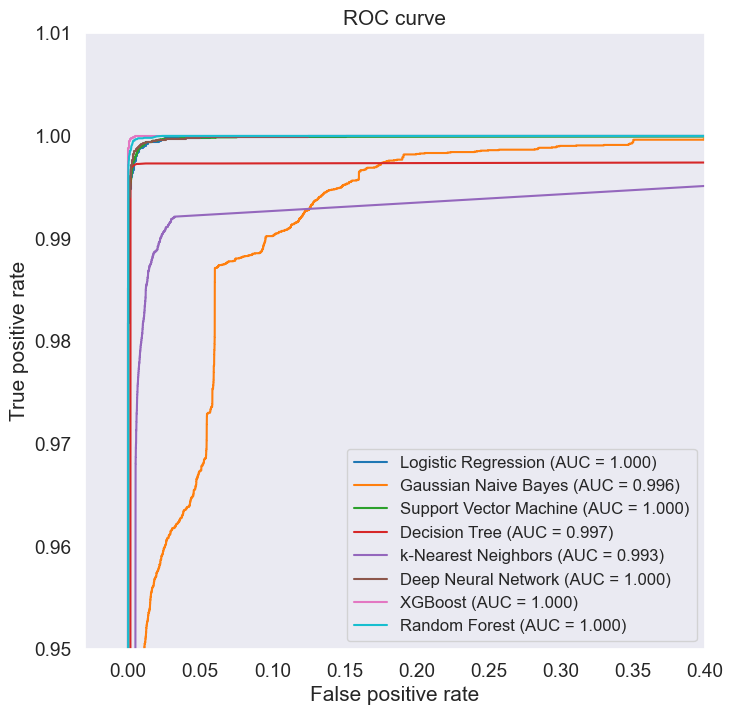

In [395]:
plt.figure(figsize=(8, 8))

plt.plot(lr_fpr, lr_tpr , c='tab:blue', label=f'Logistic Regression (AUC = {lr_auc:.3f})')
plt.plot(gnb_fpr, gnb_tpr , c='tab:orange', label=f'Gaussian Naive Bayes (AUC = {gnb_auc:.3f})')
plt.plot(svm_fpr, svm_tpr , c='tab:green', label=f'Support Vector Machine (AUC = {svm_auc:.3f})')
plt.plot(dt_fpr, dt_tpr, c='tab:red', label=f'Decision Tree (AUC = {dt_auc:.3f})')
plt.plot(knn_fpr, knn_tpr, c='tab:purple', label=f'k-Nearest Neighbors (AUC = {knn_auc:.3f})')
plt.plot(dnn_fpr, dnn_tpr, c='tab:brown', label=f'Deep Neural Network (AUC = {dnn_auc:.3f})')
plt.plot(xgb_fpr, xgb_tpr, c='tab:pink', label=f'XGBoost (AUC = {xgb_auc:.3f})')
plt.plot(rf_fpr, rf_tpr, c='tab:cyan', label=f'Random Forest (AUC = {rf_auc:.3f})')

plt.xlim([-0.03, 0.4])
plt.ylim([0.95, 1.01])
plt.grid()
plt.legend(fontsize=12)

plt.title('ROC curve')
plt.xlabel('False positive rate')
plt.ylabel('True positive rate')

plt.show()

The graph and the values for the **AUC (Area Under the Curve)** indicate excellent discrimination between the positive and negative classes for all classifiers, even though the value is slightly lower for **Gaussian Naive Bayes**, **Decision Tree** and **k-NN**. The **AUC** summarizes the overall performance of the classifier, so it is a quite important indicator: a value equal to 1 indicates near-perfect models. It is a useful value when comparing multiple classifiers.

Plot 3 different sub-charts for better readability

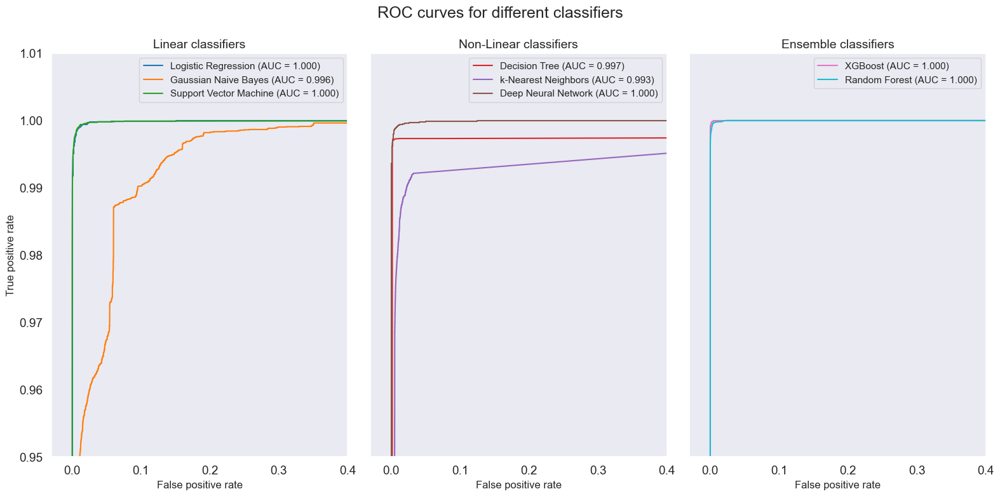

In [397]:
# Create a figure with 3 side-by-side subplots
fig, axes = plt.subplots(1, 3, figsize=(16, 8), sharex=True, sharey=True)

# Set the common x and y axis limits for all plots
x_min, x_max = -0.03, 0.4
y_min, y_max = 0.95, 1.01

# First plot: Linear Classifiers - use axes[0]
axes[0].plot(lr_fpr, lr_tpr, c='tab:blue', label=f'Logistic Regression (AUC = {lr_auc:.3f})')
axes[0].plot(gnb_fpr, gnb_tpr, c='tab:orange', label=f'Gaussian Naive Bayes (AUC = {gnb_auc:.3f})')
axes[0].plot(svm_fpr, svm_tpr, c='tab:green', label=f'Support Vector Machine (AUC = {svm_auc:.3f})')

axes[0].set_title('Linear classifiers', fontsize=14)
axes[0].set_xlabel('False positive rate', fontsize=12)
axes[0].set_ylabel('True positive rate', fontsize=12)
axes[0].set_xlim(x_min, x_max)
axes[0].set_ylim(y_min, y_max)
axes[0].grid()
axes[0].legend(fontsize=11)

# Second plot: Non-Linear Classifiers - use axes[1]
axes[1].plot(dt_fpr, dt_tpr, c='tab:red', label=f'Decision Tree (AUC = {dt_auc:.3f})')
axes[1].plot(knn_fpr, knn_tpr, c='tab:purple', label=f'k-Nearest Neighbors (AUC = {knn_auc:.3f})')
axes[1].plot(dnn_fpr, dnn_tpr, c='tab:brown', label=f'Deep Neural Network (AUC = {dnn_auc:.3f})')

axes[1].set_title('Non-Linear classifiers', fontsize=14)
axes[1].set_xlabel('False positive rate', fontsize=12)
axes[1].set_xlim(x_min, x_max)
axes[1].set_ylim(y_min, y_max)
axes[1].grid()
axes[1].legend(fontsize=11)

# Third plot: Ensemble Classifiers - use axes[2]
axes[2].plot(xgb_fpr, xgb_tpr, c='tab:pink', label=f'XGBoost (AUC = {xgb_auc:.3f})')
axes[2].plot(rf_fpr, rf_tpr, c='tab:cyan', label=f'Random Forest (AUC = {rf_auc:.3f})')

axes[2].set_title('Ensemble classifiers', fontsize=14)
axes[2].set_xlabel('False positive rate', fontsize=12)
axes[2].set_xlim(x_min, x_max)
axes[2].set_ylim(y_min, y_max)
axes[2].grid()
axes[2].legend(fontsize=11)

fig.suptitle('ROC curves for different classifiers')
plt.tight_layout()
plt.show()

**ROC** curves are divided into three subplots.<br>
**Gaussian Naive Bayes** performs worse than other classifiers. **Decision Tree** and **k-NN** perform reasonably well but slightly worse than **Ensemble Classifiers**, that demonstrate outstanding precision and recall, suggesting a very good prediction balance across positive and negative classes.

#### 3.4.3 Calibration

The calibration plot is displayed to assess how well the predicted probabilities of each classifier align with the observed outcomes.

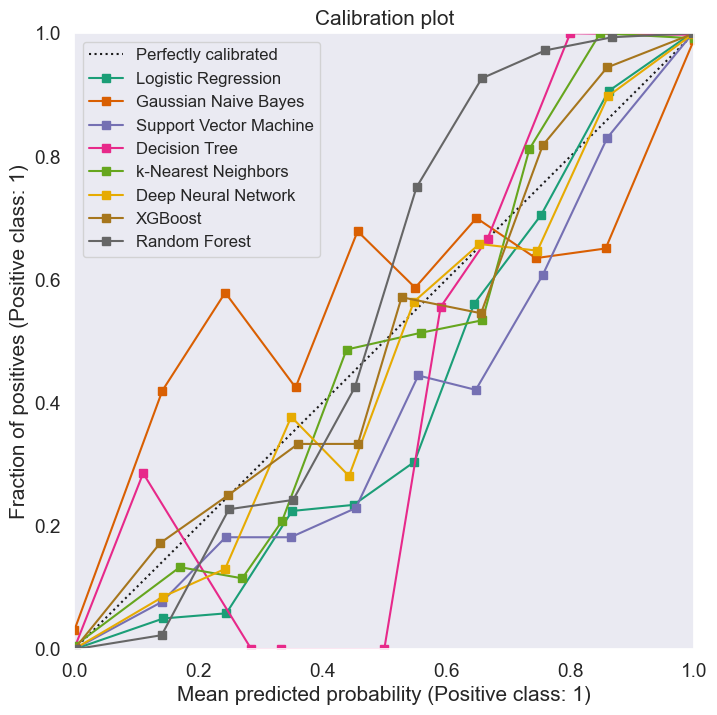

In [401]:
fig = plt.figure(figsize=(8, 8))
gs = GridSpec(1, 1)
ax_calibration_curve = fig.add_subplot(gs[:1, :1])
colors = plt.cm.get_cmap('Dark2')

calibration_displays = {}

for i, (name, clf) in enumerate(clf_dict.items()):
    y_proba = clf.predict_proba(X_test)
    display = CalibrationDisplay.from_predictions(
        y_test,
        y_proba[:, 1],
        n_bins=10,
        name=name,
        ax=ax_calibration_curve,
        color=colors(i),
    )
    calibration_displays[name] = display
    
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.grid()
plt.legend(fontsize=12)

plt.title('Calibration plot')

plt.show()

The plot shows that the **Gaussian Naive Bayes** has significant deviations from the diagonal, corresponding to the perfect calibration line. Also **Decision Tree**'s calibration deviates significantly from the line of optimal calibration.

Plot 3 different sub-charts for better readability

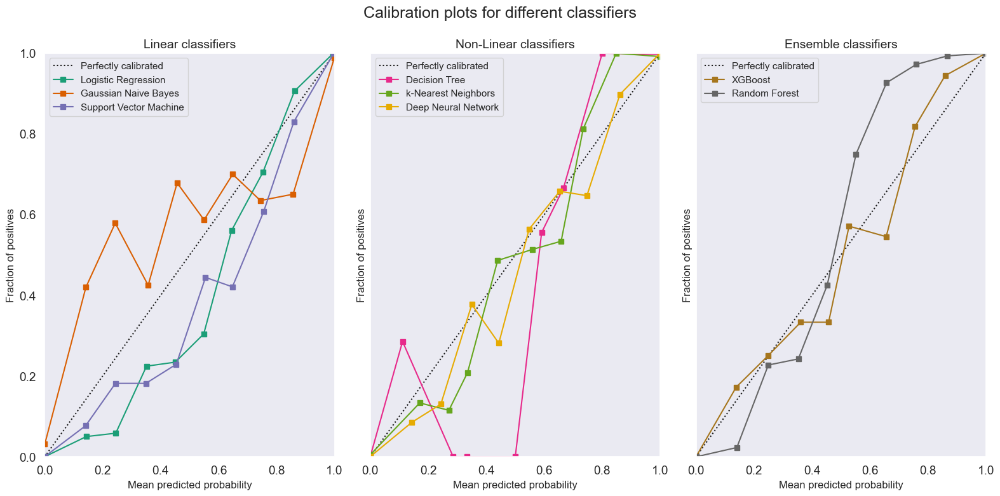

In [403]:
# Create a figure with 3 side-by-side subplots
fig, axes = plt.subplots(1, 3, figsize=(16, 8), sharex=True, sharey=True)

# Set the common x and y axis limits for all plots
x_min, x_max = 0, 1
y_min, y_max = 0, 1

# Loop over classifiers and plot the calibration curves
for i, (name, clf) in enumerate(clf_dict.items()):
    y_proba = clf.predict_proba(X_test)
    
    # Determine which axis to plot on based on classifier group
    if name in ['Logistic Regression', 'Gaussian Naive Bayes', 'Support Vector Machine']:
        ax = axes[0]  # Linear classifiers
    elif name in ['Decision Tree', 'k-Nearest Neighbors', 'Deep Neural Network']:
        ax = axes[1]  # Non-Linear classifiers
    else:
        ax = axes[2]  # Ensemble classifiers
    
    # Create calibration display for each classifier
    display = CalibrationDisplay.from_predictions(
        y_test,
        y_proba[:, 1],
        n_bins=10,
        name=name,
        ax=ax,
        color=colors(i),
    )

# Set the axis limits and titles for each subplot
for ax in axes:
    ax.set_xlim(x_min, x_max)
    ax.set_ylim(y_min, y_max)
    ax.grid()
    ax.legend(fontsize=11)
    
# Titles for each plot
axes[0].set_title('Linear classifiers', fontsize=14)
axes[1].set_title('Non-Linear classifiers', fontsize=14)
axes[2].set_title('Ensemble classifiers', fontsize=14)

# Axis labels
for ax in axes:
    ax.set_xlabel('Mean predicted probability', fontsize=12)
    ax.set_ylabel('Fraction of positives', fontsize=12)

fig.suptitle('Calibration plots for different classifiers')
plt.tight_layout()
plt.show()

The subplots allow to better visualize the calibration plots.

**XGBoost** and **Random Forest** consistently achieve the best performance across **PR curves**, **ROC curves**, and **calibration**.<br>**Linear Classifiers** are slightly less powerful. The **Gaussian Naive Bayes** classifier struggles the most due to its assumption of a Gaussian distribution.

### 3.5 Supervised Learning conclusion

For the phishing detection task, **supervised learning** offers a range of powerful tools, with ensemble classifiers (**XGBoost**, **Random Forest**) emerging as the most effective choices. These models excel at capturing the complexity of phishing patterns while minimizing errors. However, simpler models like **Logistic Regression** and **SVM** remain good alternatives. Overall, **supervised learning** provides a robust framework for building reliable and scalable phishing detection systems.

### 3.6 Explaining predictions: LIME

**LIME** (Local Interpretable Model-Agnostic Explanations) is a tool designed to explain predictions of black-box machine learning models, making them interpretable. It does so by training local surrogate models that approximate the behavior of the original model around a specific instance.

Declare a LIME explainer

In [410]:
explainer = lime.lime_tabular.LimeTabularExplainer(
    X_train.values, 
    feature_names=X_train.columns.values.tolist(),
    class_names= ['legitimate', 'phishing'], 
    verbose=True, 
    mode='classification'
)

Select a random instance from the test set and use it to explain the **Random Forest** (chosed randomly, any other classifier could be taken) model:

In [412]:
j = 30
exp = explainer.explain_instance(X_test.values[j], rf_best_clf.predict_proba)

Intercept 0.3178056008318437
Prediction_local [0.52064537]
Right: 1.0


Show the predictions

In [414]:
exp.show_in_notebook(show_table=True)

In [415]:
exp.as_list()

[('LineOfCode <= -0.33', 0.39849543670162346),
 ('NoOfAmpersandInURL <= -0.03', -0.07271618659882431),
 ('URLLength <= -0.34', -0.05692603844065552),
 ('IsDomainIP <= -0.05', -0.0485697190939817),
 ('LetterRatioInURL <= -0.61', -0.030117668421608748),
 ('HasObfuscation <= -0.04', 0.015843882153438665),
 ('NoOfPopup <= -0.06', -0.015051939103444087),
 ('HasSubmitButton <= -0.87', 0.012724839630071604),
 ('NoOfEmptyRef <= -0.13', -0.009261123323682579),
 ('-1.29 < TLDLength <= 0.40', 0.008418282121781527)]

In this example `NoOfEqualsInURL`, `LargestLineLength` and `URLLength` seem to strongly push towards 'legitimate' outcomes, while `IsDomainIP` has minimal effect on predictions.

## 4. Unsupervised Learning: Clustering

Evaluation of the dataset using three different clustering algorithms:
1. **K-Means**
2. **DBScan**
3. **Hierarchical clustering**

To ensure the reproducibility of the results I use a random seed. Seeding a random generator makes sure that every time I run the code, random samples are always the same. I will do it passing the additional random seed parameter.

In [420]:
random_seed = 0

For computational reasons, I will not use the full dataset during this phase.<br>
Of the approximately 220000 rows, I use the first 50000.

Now I create a new dataframe that doesn't contain the true label, ensuring the clustering remains unsupervised, and an array which contains only the true labels (legitimate or phishing).

In [422]:
cluster_df = numerical_df[:50000]

In [423]:
true_labels = cluster_df['label'].values

In [424]:
df_no_labels = cluster_df.drop(['label'], axis=1)

### 4.1 Clustering results visualisation using t-SNE

A possible solution to the high-dimensionality problem is t-SNE (t-distributed Stochastic Neighbor Embedding), an algorithm for dimensionality reduction. It helps to better visualize the clusters.

The t-SNE algorithm is applied to reduce the high-dimensional data to **2 components**. I want the data to be represented in 2D for better visualization.

Now I fit the embedding model on the data and transform them.

In [427]:
X_embedded = TSNE(n_components=2, perplexity=20).fit_transform(df_no_labels)

Now look at the shape of the transformed data.

In [429]:
X_embedded.shape

(50000, 2)

Now I plot the points in a two dimensions and divide them based on the labels.

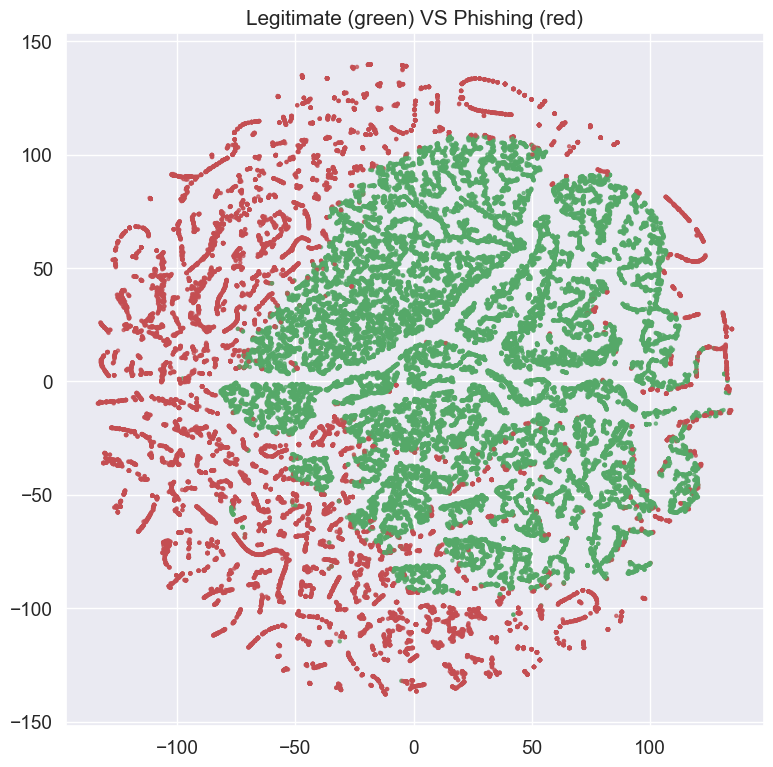

In [431]:
plt.figure(figsize=(9, 9))
plt.title('Legitimate (green) VS Phishing (red)')
plt.scatter(
    X_embedded[:, 0], 
    X_embedded[:, 1], 
    s=5, 
    alpha=0.7, 
    c=['r' if label else 'g' for label in true_labels]
)

plt.show()

The green points (legitimate URLs) form a dense central region, suggesting that many legitimate URLs share similar features. While, the red points (phishing URLs) mostly surround the legitimate cluster, forming distinct boundaries and some scattered clusters.

Here I can get an intuition of the behaviour of the clustering by looking at the true label (which in this case was known).

### 4.2 K-Means

**K-Means** is an unsupervised machine learning algorithm used for clustering, that groups data points into a previously determined number (k) of clusters based on their similarity. It aims to minimize the distance between data points and the center of their assigned cluster.

<div class ="alert alert-info" role="alert">
    Define a K-Means algorithm and fit it with different number of clusters
</div>

In [436]:
n_clusters = list(range(2, 12))
n_clusters

[2, 3, 4, 5, 6, 7, 8, 9, 10, 11]

When evaluating clustering performance, especially with true labels available, I use the following metrics:

1. **Homogeneity Score**: A cluster is homogeneous if it contains only members of a single class.
2. **Completeness Score**: A clustering result satisfies completeness if all members of a class are assigned to the same cluster.
3. **V-Measure**: The V-Measure is the harmonic mean of homogeneity and completeness, it combines both metrics to evaluate the overall quality of clustering.
4. **Silhouette Score**: Measures how similar a data point is to its own cluster compared to other clusters.
5. **Calinski-Harabasz Index**: Measures the ratio of inter-cluster dispersion (how far apart clusters are) to intra-cluster dispersion (how compact clusters are).

I iterate over different values of the `n_clusters` parameter. <br>
I also compute the different **extrinsic** and **intrinsic evaluation metrics** using the **elbow method**

In [439]:
homogeneity_values_km = []
completeness_values_km = []
v_measure_values_km = []
silhouette_values_km = []
calinksi_harabasz_values_km = []

In [440]:
for k in n_clusters:
    # Fit clustering algorithm
    kmeans = KMeans(n_clusters=k, random_state=random_seed).fit(X_embedded)
    predicted_clusters = kmeans.predict(X_embedded)

    # Save predictions when there are 2 clusters (chart plotted later)
    if k==2:
        predicted_clusters_km_2 = predicted_clusters
    
    # Compute the different scores with corrent configuration and append it to the list of collected scores
    homogeneity_values_km.append(homogeneity_score(true_labels, predicted_clusters))
    completeness_values_km.append(completeness_score(true_labels, predicted_clusters))
    v_measure_values_km.append(v_measure_score(true_labels, predicted_clusters))
    silhouette_values_km.append(silhouette_score(X_embedded, predicted_clusters))
    calinksi_harabasz_values_km.append(calinski_harabasz_score(X_embedded, predicted_clusters))

<div class ="alert alert-info" role="alert">
    Plot the values of the different evaluating measures
</div>

1. **Homogeneity**

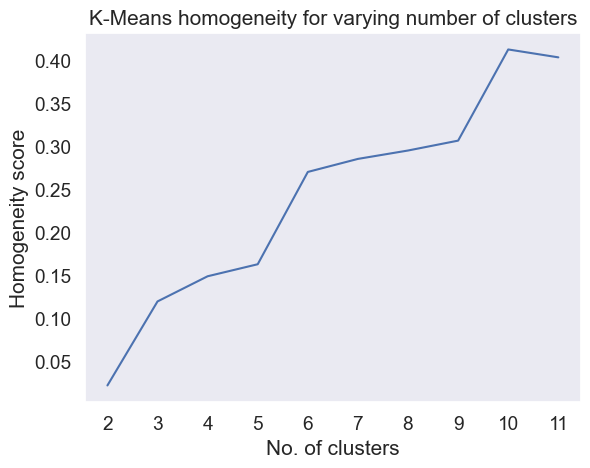

In [443]:
plt.figure()

plt.plot(n_clusters, homogeneity_values_km)
plt.xticks(n_clusters)

plt.title('K-Means homogeneity for varying number of clusters')
plt.xlabel('No. of clusters')
plt.ylabel('Homogeneity score')
plt.grid()
plt.show()

Knowing that high homogeneity means clusters do not mix different classes, and that the range goes from 0 (worst) to 1 (best), if a cluster only contains legitimate URLs, it is perfectly homogeneous.

In this case, I can observe that homogeneity increases with the number of clusters, peaking at `n_clusters = 10`.<br>
This means that predictions with more clusterings are more precise.

2. **Completeness**

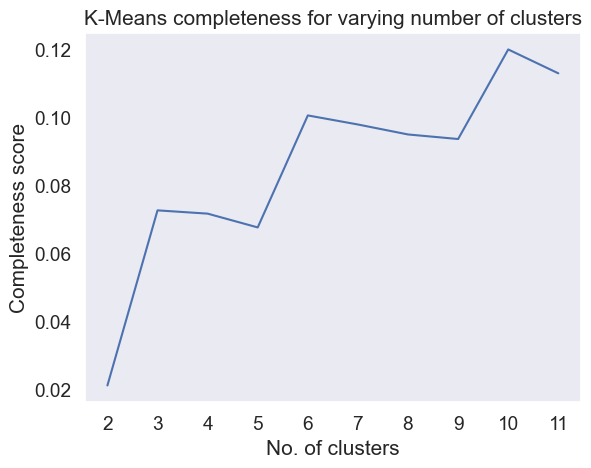

In [446]:
plt.figure()

plt.plot(n_clusters, completeness_values_km)
plt.xticks(n_clusters)

plt.title('K-Means completeness for varying number of clusters')
plt.xlabel('No. of clusters')
plt.ylabel('Completeness score')
plt.grid()
plt.show()

Given that high completeness means all data points of a specific class are grouped together, if all phishing URLs are grouped in the same cluster, the completeness score is high.

Here completeness improves as clusters increase but plateaus between `n_clusters = 6` and `n_clusters = 9`. It then reaches a peak with `n_clusters = 10`.

3. **V_measure**

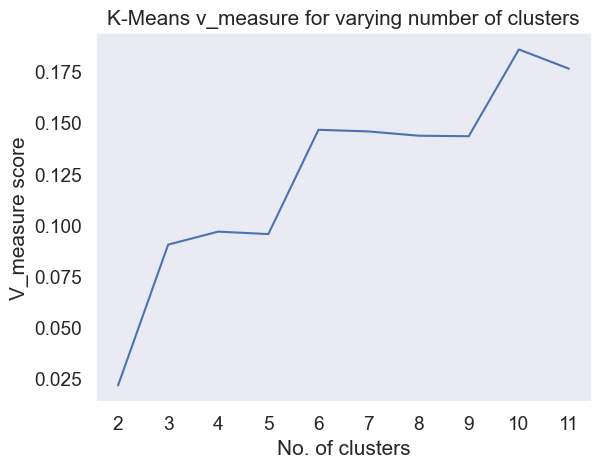

In [449]:
plt.figure()

plt.plot(n_clusters, v_measure_values_km)
plt.xticks(n_clusters)

plt.title('K-Means v_measure for varying number of clusters')
plt.xlabel('No. of clusters')
plt.ylabel('V_measure score')
plt.grid()
plt.show()

The V-Measure (harmonic mean of homogeneity and completeness), which evaluate the overall quality of clustering, increases steadily up to `n_clusters = 10`, as one could predict the homogeneity and completeness graphs reported above.

4. **Silhouette**

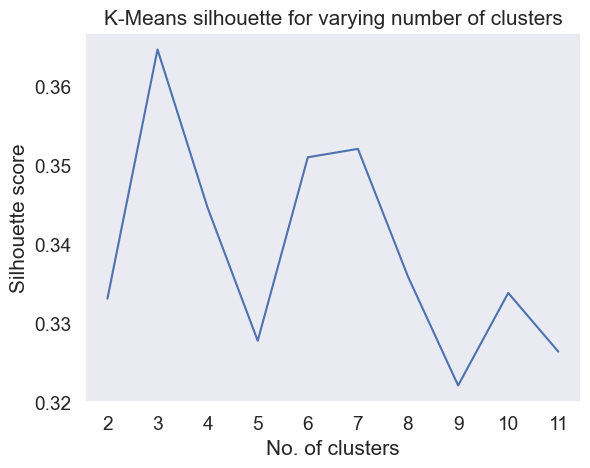

In [452]:
plt.figure()

plt.plot(n_clusters, silhouette_values_km)
plt.xticks(n_clusters)

plt.title('K-Means silhouette for varying number of clusters')
plt.xlabel('No. of clusters')
plt.ylabel('Silhouette score')
plt.grid()
plt.show()

The range is from -1 (points are assigned to the wrong clusters) to 1 (points are well clustered, compact and separated).

In this case, Silhouette score peaks at `n_clusters = 3` and decreases as the number of clusters increases. This indicates that clusters become less compact or overlap more as clusters grow.

5. **Calinski-Harabasz**

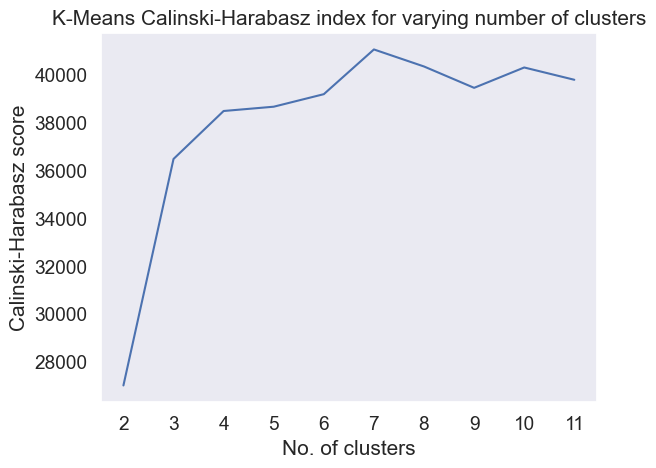

In [455]:
plt.figure()

plt.plot(n_clusters, calinksi_harabasz_values_km)
plt.xticks(n_clusters)

plt.title('K-Means Calinski-Harabasz index for varying number of clusters')
plt.xlabel('No. of clusters')
plt.ylabel('Calinski-Harabasz score')
plt.grid()
plt.show()

Higher values indicate better clustering performance with well-separated and compact clusters. <br>
The score increases up to `n_clusters = 7` and stabilizes, therefore indicating a good balance of cluster separation and compactness.

As a result I can state that homogeneity, completeness, and V-measure all improve as the number of clusters increases, peaking around 10 clusters.<br>
The Silhouette Score peaks at 3 clusters, suggesting a smaller number of clusters leads to better-defined groups.<br>
The Calinski-Harabasz Index peaks at 7 clusters, supporting an optimal cluster range of 7-9.

### 4.3 DBSCAN

**DBSCAN** (Density-Based Spatial Clustering of Applications with Noise) is an unsupervised machine learning algorithm used for clustering that identifies clusters based on the density of data points in a given space.<br>
The DBSCAN algorithm can detect clusters of arbitrary shapes and it automatically identifies outliers (noise points).<br>
It defines these 3 "types" of points:
- *Core points*: Points with sufficient neighbors.<br>
- *Border points*: Points within `eps (ε)` but lacking sufficient neighbors.<br>
- *Noise points*: Points not belonging to any cluster.<br>

<div class ="alert alert-info" role="alert">
    Define a DBSCAN algorithm and fit it with different values of the radius
</div>

The parameter `eps (ε)` indicates the radius of the neighborhood around a data point.

In [462]:
eps = [(e + 1) / 10 for e in range(10)]
eps

[0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0]

I iterate over different values of the `eps` parameter. <br>
I also compute the different **extrinsic** and **intrinsic evaluation metrics** using the **elbow method**

In [464]:
homogeneity_values_dbs = []
completeness_values_dbs = []
v_measure_values_dbs = []
silhouette_values_dbs = []
calinksi_harabasz_values_dbs = []

In [465]:
for e in eps:
    # Fit clustering algorithm
    dbscan = DBSCAN(eps=e).fit(X_embedded)
    predicted_clusters = dbscan.labels_

    # Save predictions when there is a higher probability of having 2 clusters (chart plotted later)
    # The value of eps is higher, so the probability of having 2 clusters increases
    if e==0.9:
        predicted_clusters_dbs = predicted_clusters
    
    # Compute the different scores with corrent configuration and append it to the list of collected scores
    homogeneity_values_dbs.append(homogeneity_score(true_labels, predicted_clusters))
    completeness_values_dbs.append(completeness_score(true_labels, predicted_clusters))
    v_measure_values_dbs.append(v_measure_score(true_labels, predicted_clusters))
    silhouette_values_dbs.append(silhouette_score(X_embedded, predicted_clusters))
    calinksi_harabasz_values_dbs.append(calinski_harabasz_score(X_embedded, predicted_clusters))

<div class ="alert alert-info" role="alert">
    Plot the values of the different evaluating measures
</div>

1. **Homogeneity**

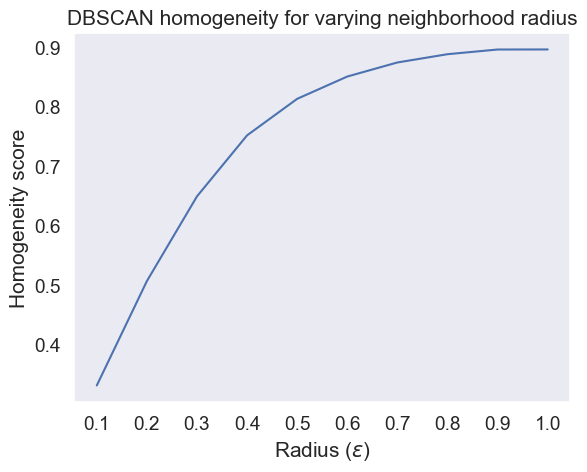

In [468]:
plt.figure()

plt.plot(eps, homogeneity_values_dbs)
plt.xticks(eps)

plt.title('DBSCAN homogeneity for varying neighborhood radius')
plt.xlabel('Radius ($\epsilon$)')
plt.ylabel('Homogeneity score')
plt.grid()
plt.show()

Homogeneity increases steadily as `eps` grows, stabilizing around 0.9 for `eps = 0.8` or higher. <br>
Larger epsilon values, which increase the radius of the neighborhood around a data point, lead to fewer, broader clusters, increasing the overall homogeneity score.

2. **Completeness**

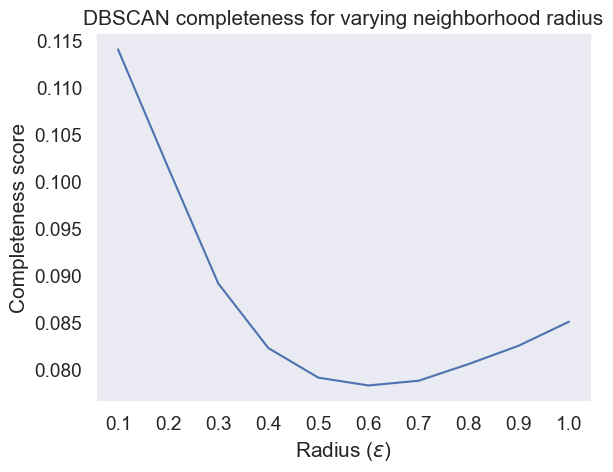

In [471]:
plt.figure()

plt.plot(eps, completeness_values_dbs)
plt.xticks(eps)

plt.title('DBSCAN completeness for varying neighborhood radius')
plt.xlabel('Radius ($\epsilon$)')
plt.ylabel('Completeness score')
plt.grid()
plt.show()

Completeness decreases sharply for small `eps` values and stabilizes around 0.08. <br>
Such a low completeness value indicates that different members of the same class are not grouped within the same cluster, leading to fragmented clusters.

3. **V-measure**

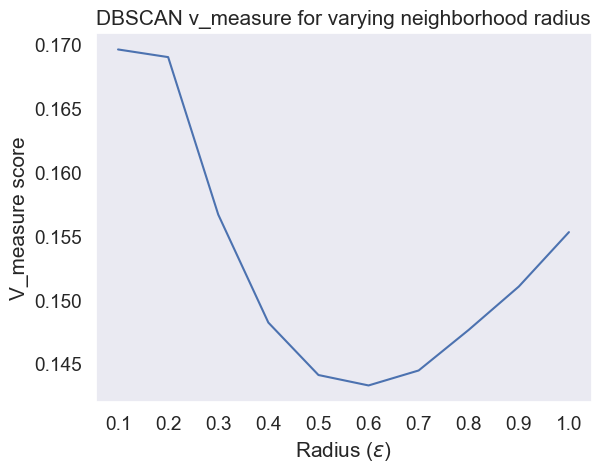

In [474]:
plt.figure()

plt.plot(eps, v_measure_values_dbs)
plt.xticks(eps)

plt.title('DBSCAN v_measure for varying neighborhood radius')
plt.xlabel('Radius ($\epsilon$)')
plt.ylabel('V_measure score')
plt.grid()
plt.show()

Since V_measure represents the harmonic mean of the two metrics above, the graph starts with a value lower than 0.2, then decreases further due to the poor results of completeness as the radius increases.<br>
The minimum is reached with `eps=0.6`, then gradually recovers as this parameter increases, but without ever reaching an adequate value.

4. **Silhouette**

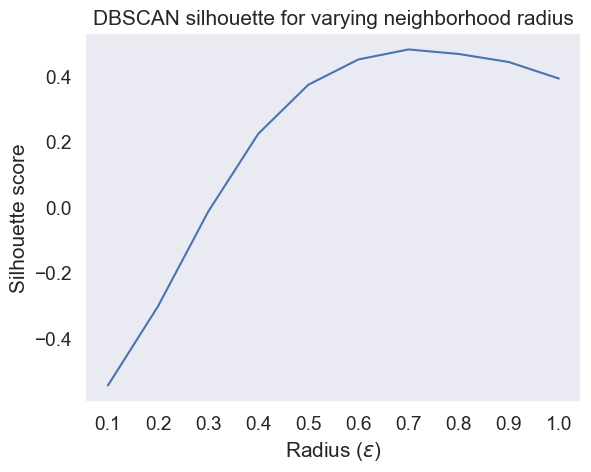

In [477]:
plt.figure()

plt.plot(eps, silhouette_values_dbs)
plt.xticks(eps)

plt.title('DBSCAN silhouette for varying neighborhood radius')
plt.xlabel('Radius ($\epsilon$)')
plt.ylabel('Silhouette score')
plt.grid()
plt.show()

The silhouette score improves as epsilon increases, peaking around `eps = 0.7`. <br>
Larger epsilon values help form well-separated clusters, since the points within the cluster are more similar to the other points in the cluster itself.

5. **Calinski-Harabasz**

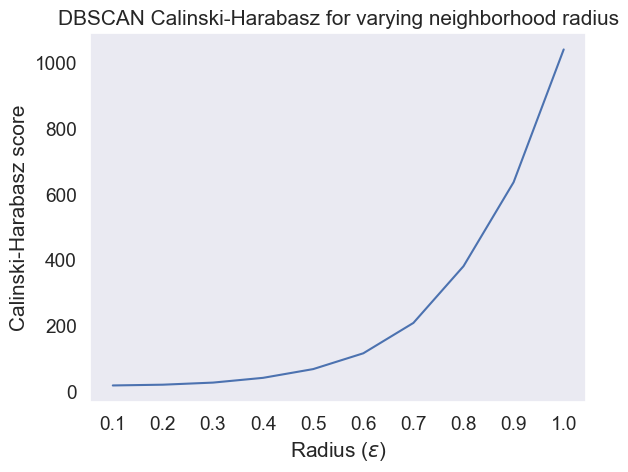

In [480]:
plt.figure()

plt.plot(eps, calinksi_harabasz_values_dbs)
plt.xticks(eps)

plt.title('DBSCAN Calinski-Harabasz for varying neighborhood radius')
plt.xlabel('Radius ($\epsilon$)')
plt.ylabel('Calinski-Harabasz score')
plt.grid()
plt.show()

The score increases exponentially with larger `eps`, indicating improved cluster compactness and separation.

The radius greatly affects clustering results as small `eps` leads to fragmented clusters and lower scores. While, larger `eps` merges clusters, improving homogeneity and silhouette score.

I found that homogeneity and silhouette scores improve with increasing `eps`. Completeness and V-measure are sensitive to small `eps` values. Finally, the Calinski-Harabasz index increases sharply, suggesting better-defined clusters at higher `eps`.

### 4.4 Hierarchical Clustering

**Hierarchical Clustering** is an unsupervised machine learning algorithm used for clustering data by building a hierarchy of clusters, organizing data points into a tree-like structure, where each node represents a cluster. 

**Agglomerative Clustering** is a bottom-up hierarchical clustering method. It starts with each data point as its own cluster and iteratively merges the closest clusters until a single cluster or a defined number of clusters is achieved.

Since the Hierachical Clustering technique requires a considerable memory allocation, I will only use the first 20000 arrays contained within `X_embedded`, so as to be able to also analyze this clustering technique.

In [485]:
X_embedded_hc = X_embedded[:20000]
true_labels = cluster_df['label'][:20000].values

<div class ="alert alert-info" role="alert">
    Define a Hierchical clustering algorithm and fit it with different number of clusters
</div>

I iterate over different values of the `n_clusters` parameter. <br>
I also compute the different **extrinsic** and **intrinsic evaluation metrics** using the **elbow method**

In [488]:
homogeneity_values_hc = []
completeness_values_hc = []
v_measure_values_hc = []
silhouette_values_hc = []
calinksi_harabasz_values_hc = []

In [489]:
for k in n_clusters:
    # Fit clustering algorithms
    hier = AgglomerativeClustering(n_clusters=k).fit(X_embedded_hc)
    predicted_clusters = hier.labels_

    # Save predictions when there are 2 clusters (chart plotted later)
    if k==2:
        predicted_clusters_hc_2 = predicted_clusters
    
    # Compute the different scores with corrent configuration and append it to the list of collected scores
    homogeneity_values_hc.append(homogeneity_score(true_labels, predicted_clusters))
    completeness_values_hc.append(completeness_score(true_labels, predicted_clusters))
    v_measure_values_hc.append(v_measure_score(true_labels, predicted_clusters))
    silhouette_values_hc.append(silhouette_score(X_embedded_hc, predicted_clusters))
    calinksi_harabasz_values_hc.append(calinski_harabasz_score(X_embedded_hc, predicted_clusters))

<div class ="alert alert-info" role="alert">
    Plot the values of the different evaluating measures
</div>

1. **Homogeneity**

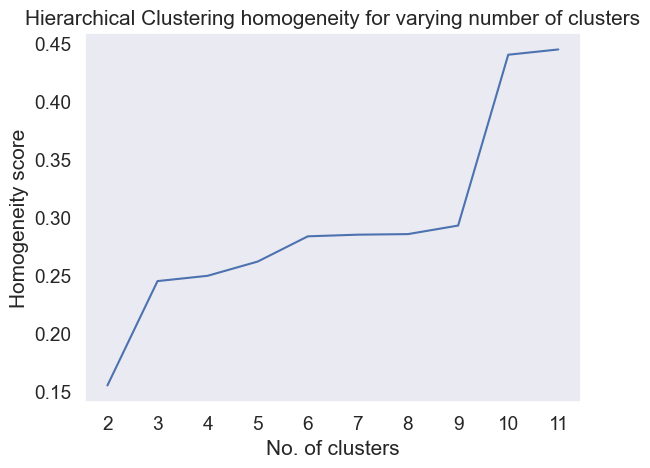

In [492]:
plt.figure()

plt.plot(n_clusters, homogeneity_values_hc)
plt.xticks(n_clusters)

plt.title('Hierarchical Clustering homogeneity for varying number of clusters')
plt.xlabel('No. of clusters')
plt.ylabel('Homogeneity score')
plt.grid()
plt.show()

Homogeneity score improves with more clusters, with a significant rise after `n_clusters = 9`, as observed also in the K-Means clustering.

2. **Completeness**

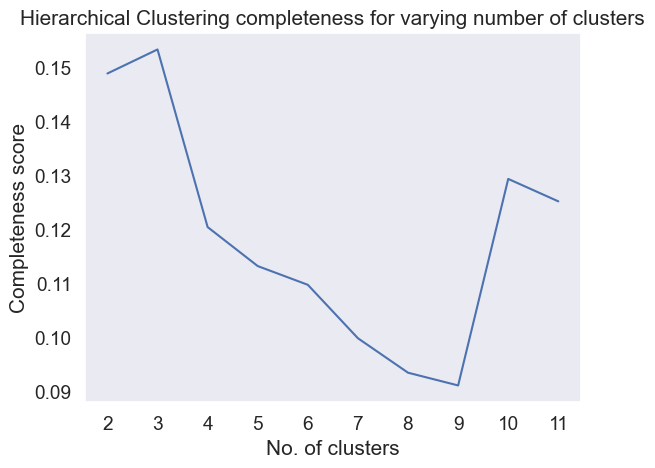

In [495]:
plt.figure()

plt.plot(n_clusters, completeness_values_hc)
plt.xticks(n_clusters)

plt.title('Hierarchical Clustering completeness for varying number of clusters')
plt.xlabel('No. of clusters')
plt.ylabel('Completeness score')
plt.grid()
plt.show()

Completeness decreases initially, stabilizes, and slightly rises around `n_clusters = 10`, but once again with inadequate values.

3. **V_measure**

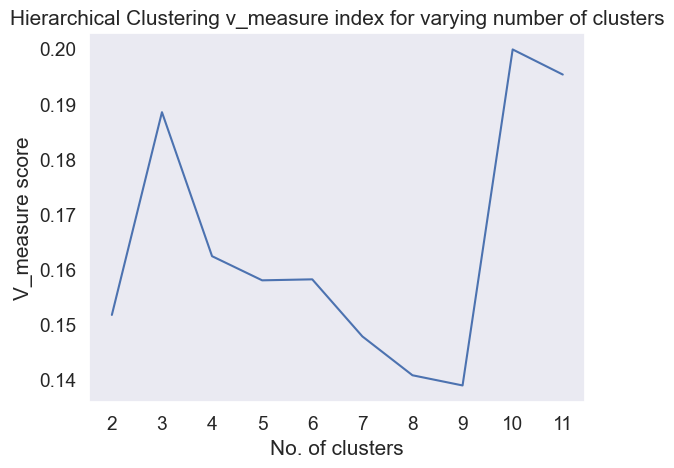

In [498]:
plt.figure()

plt.plot(n_clusters, v_measure_values_hc)
plt.xticks(n_clusters)

plt.title('Hierarchical Clustering v_measure index for varying number of clusters')
plt.xlabel('No. of clusters')
plt.ylabel('V_measure score')
plt.grid()
plt.show()

The V_measure, being the harmonic mean of the two previous metrics, never reaches adequate values, but above all stable ones. In fact, two local maximum points and a local minimum are identified, even though the interval of interest is not so wide.

4. **Silhouette**

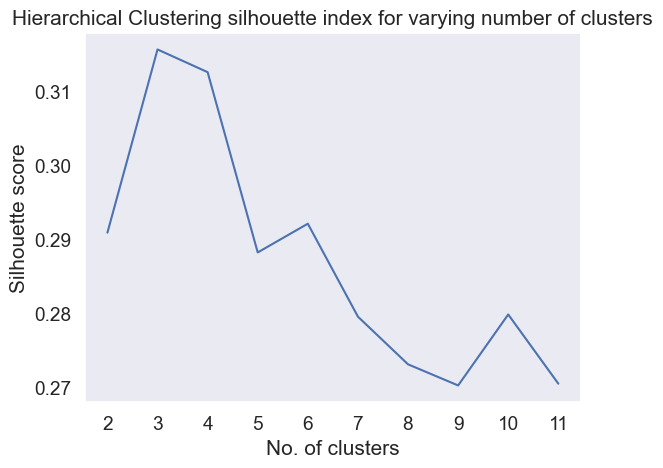

In [501]:
plt.figure()

plt.plot(n_clusters, silhouette_values_hc)
plt.xticks(n_clusters)

plt.title('Hierarchical Clustering silhouette index for varying number of clusters')
plt.xlabel('No. of clusters')
plt.ylabel('Silhouette score')
plt.grid()
plt.show()

Silhouette index peaks at `n_clusters = 3` and decrease as the number of clusters increases, suggesting that smaller numbers of clusters produce more compact and well-separated clusters.

5. **Calinski-Harabasz**

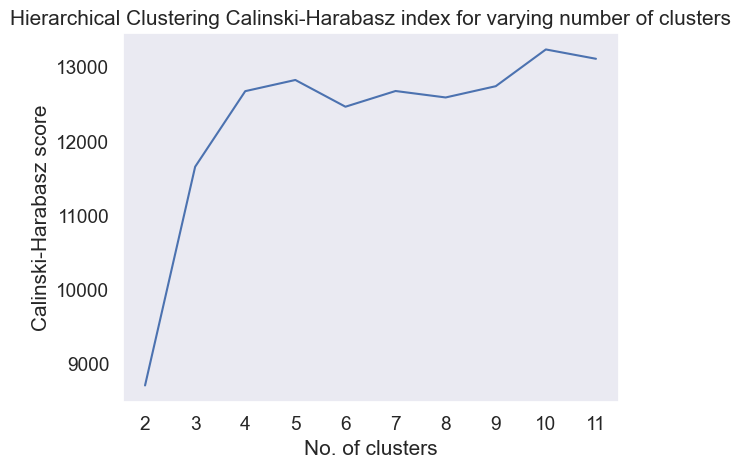

In [504]:
plt.figure()

plt.plot(n_clusters, calinksi_harabasz_values_hc)
plt.xticks(n_clusters)

plt.title('Hierarchical Clustering Calinski-Harabasz index for varying number of clusters')
plt.xlabel('No. of clusters')
plt.ylabel('Calinski-Harabasz score')
plt.grid()
plt.show()

The Calinski-Harabasz index increases steadly from 2 to 3 clusters, then it stabilised around 13000, indicating that this range offers optimal cluster separation and compactness.

Overall, homogeneity improves as the number of clusters increases, which is expected because more clusters allow finer grouping.

Completeness and V-measure fluctuate, indicating sensitivity to the number of clusters. The Silhouette Score peaks for smaller numbers of clusters (`n_clusters = 3`), suggesting that compact clusters are best achieved with fewer groups. The Calinski-Harabasz Index peaks around `n_clusters = 10`, which aligns with an optimal trade-off between cluster separation and compactness.

### 4.5 Unsupervised Learning clustering algorihtms comparison

<div class ="alert alert-info" role="alert">
    Compare the different unsupervised learning clustering algorihtms
</div>

Aggregate the evaluation metrics for all algorithms into a single table for comparison.

In [510]:
results = {
    'Algorithm': ['K-Means', 'DBSCAN', 'Hierchical Clustering'],
    'Homogeneity': [homogeneity_values_km, homogeneity_values_dbs, homogeneity_values_hc],
    'Completeness': [completeness_values_km, completeness_values_dbs, completeness_values_hc],
    'V_measure': [v_measure_values_km, v_measure_values_dbs, v_measure_values_hc],
    'Silhouette': [silhouette_values_km, silhouette_values_dbs, silhouette_values_hc],
    'Calinski-Harabasz': [calinksi_harabasz_values_km, calinksi_harabasz_values_dbs, calinksi_harabasz_values_hc]
}
comparison_df = pd.DataFrame(results)
comparison_df

,Algorithm,Homogeneity,Completeness,V_measure,Silhouette,Calinski-Harabasz
0,K-Means,"[0.02203019651202381, 0.11983338902491254, 0.1...","[0.021142571791422284, 0.07257571867654491, 0....","[0.021577259445622606, 0.0904010671202041, 0.0...","[0.3330766, 0.36464453, 0.3445905, 0.32774305,...","[26992.260777661024, 36475.1354301235, 38483.8..."
1,DBSCAN,"[0.33114415592878543, 0.5066105467760768, 0.64...","[0.1140232415491991, 0.10144052961493111, 0.08...","[0.1696356484908168, 0.16903462280996973, 0.15...","[-0.5447492, -0.3027569, -0.013994303, 0.22430...","[18.891150938580434, 21.193025879460475, 27.53..."
2,Hierchical Clustering,"[0.15484109322339315, 0.24485361521240726, 0.2...","[0.14879193569418944, 0.15323707379641752, 0.1...","[0.15175625700435103, 0.18850303480869166, 0.1...","[0.29087052, 0.3155992, 0.3125329, 0.28819928,...","[8704.217906346359, 11650.916415360769, 12669...."


Visual comparison using a bar chart.

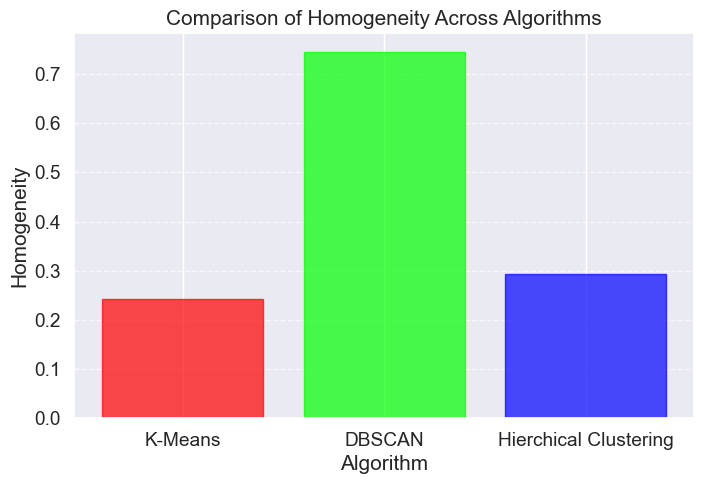

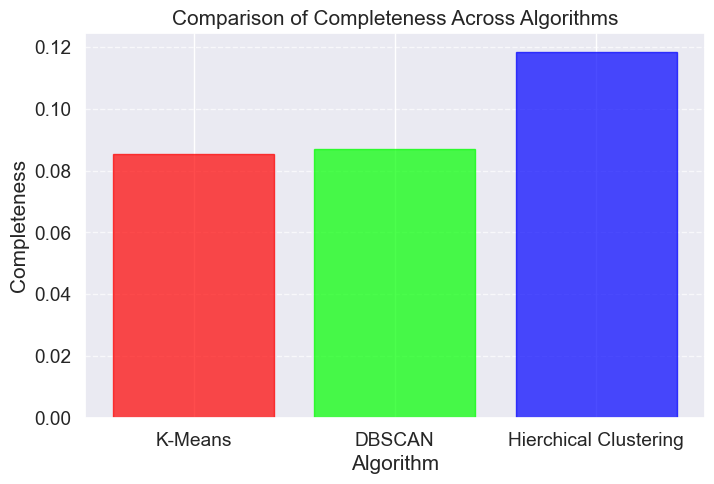

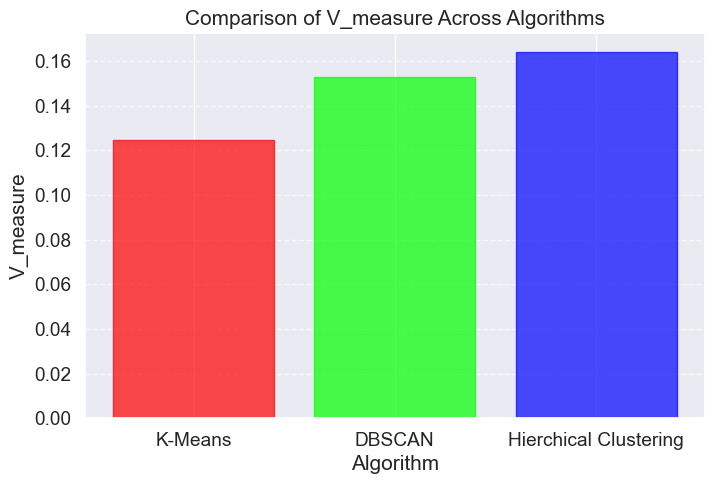

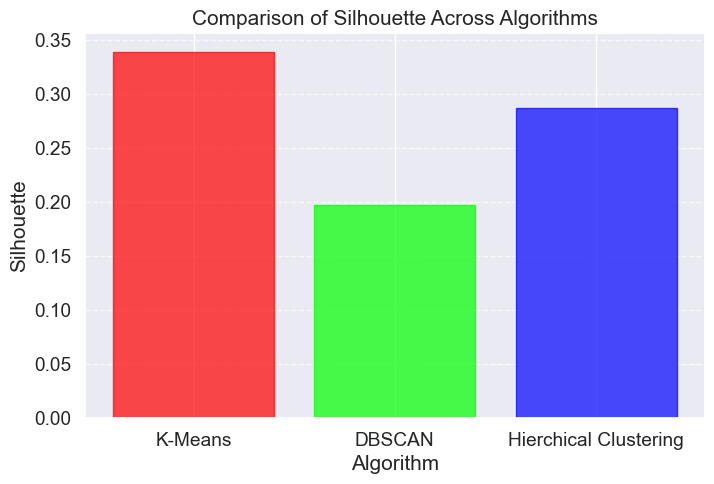

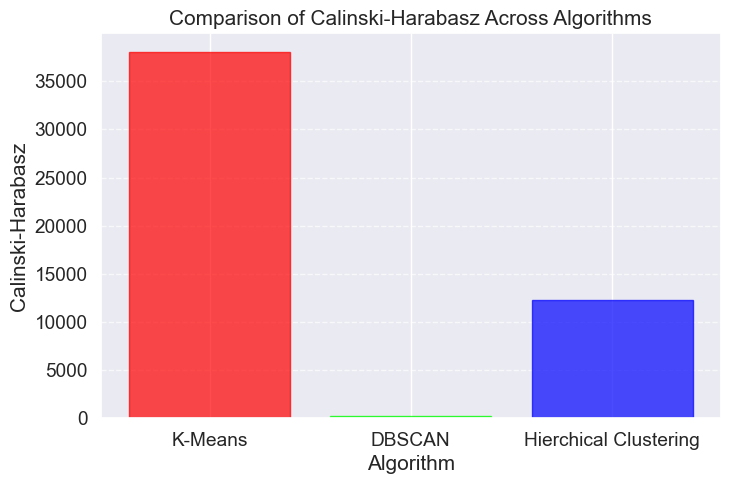

In [512]:
colors = ['#FF0000', '#00FF00', '#0000FF']  # red, green, blue
metrics = ['Homogeneity', 'Completeness', 'V_measure', 'Silhouette', 'Calinski-Harabasz']

# Map dtype: from object to float
for col in ['Homogeneity', 'Completeness', 'V_measure', 'Silhouette', 'Calinski-Harabasz']:
    comparison_df[col] = comparison_df[col].apply(
        lambda x: float(np.mean(x)) if isinstance(x, (list, np.ndarray)) else float(x)
    )

for metric in metrics:
    plt.figure(figsize=(8, 5))
    
    # Create the bar chart with different colors for each algorithm
    bars = plt.bar(comparison_df['Algorithm'], comparison_df[metric], alpha=0.7)

    # Assign colors to each bar based on the index (cycling through 3 colors)
    for i, bar in enumerate(bars):
        bar.set_color(colors[i % len(colors)])
    
    plt.title(f'Comparison of {metric} Across Algorithms')
    plt.xlabel('Algorithm')
    plt.ylabel(metric)
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.show()

1. **Homogeneity**

DBSCAN clearly outperforms the other algorithms, achieving the highest homogeneity score (`~0.8`). This indicates that DBSCAN produces clusters where data points belong to the same ground truth class and excels in forming clusters where members are highly homogeneous, making it ideal for problems where label purity is critical.
Hierarchical Clustering follows with a moderate score (`~0.3`), suggesting reasonably pure clusters.
K-Means performs the worst (`~0.25`), highlighting that its clusters are less consistent with ground truth labels.

2. **Completeness**

Hierarchical Clustering achieves the highest completeness score (`~0.12`), meaning it is better at grouping all points of a class into the same cluster (Hierarchical Clustering was performed on 20000 data points, not 50000.).
DBSCAN and K-Means are similar, with K-Means slightly lower.

3. **V-measure**

Hierarchical Clustering achieves the highest V-measure (`~0.16`), followed closely by DBSCAN. K-Means lags behind (`~0.12`).<br>
Overall, DBSCAN balances homogeneity and completeness better than the other algorithms, making it the most reliable clustering method when both criteria are important.

4. **Silhouette Score**

K-Means achieves the highest silhouette score (`~0.35`), indicating that its clusters are the most compact and well-separated, making it ideal for spherical or regularly shaped data.
Hierarchical Clustering follows with a moderate silhouette score (`~0.28`).
DBSCAN performs poorly (`~0.2`), with the lowest score, suggesting that its clusters may be less compact or overlap.

5. **Calinski-Harabasz Index**

K-Means dominates with a significantly higher Calinski-Harabasz score (`~38,000`), showing it forms clusters with strong inter-cluster separation and low intra-cluster dispersion. It outperforms the other algorithms in maintaining well-separated and internally consistent clusters, highlighting its superiority for structured, compact data.
Hierarchical Clustering has a moderate score (`~12500`).
DBSCAN performs poorly, with scores near between `0` and `1000`.

Since the goal is to classify URLs as phishing or legitimate, I now reporte below how K-Means and Hierarchical Clustering perform considering `n_clusters=2`, and DBSCAN.

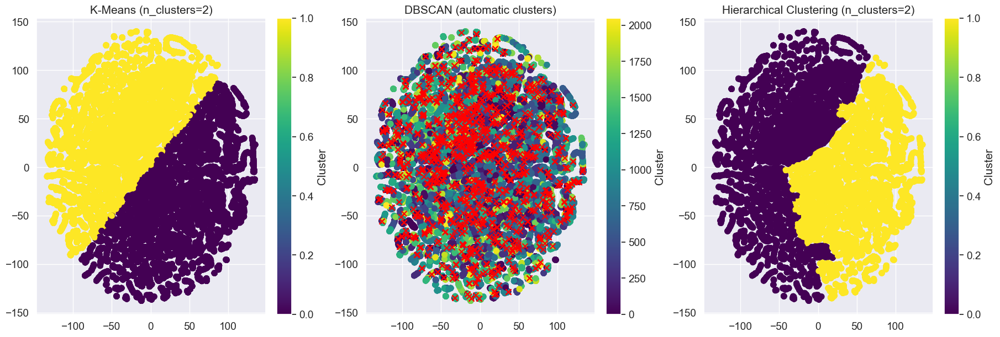

In [515]:
# Create a figure with 3 side-by-side subplots
fig, axes = plt.subplots(1, 3, figsize=(18, 6), constrained_layout=True)

titles = ['K-Means (n_clusters=2)', 'DBSCAN (automatic clusters)', 'Hierarchical Clustering (n_clusters=2)']
datasets = [X_embedded, X_embedded, X_embedded_hc]
labels = [predicted_clusters_km_2, predicted_clusters_dbs, predicted_clusters_hc_2]

# Plot clusters for each algorithm
for ax, title, data, cluster_labels in zip(axes, titles, datasets, labels):
    scatter = ax.scatter(data[:, 0], data[:, 1], c=cluster_labels, cmap='viridis', s=50)
    ax.set_title(title)
    fig.colorbar(scatter, ax=ax, label='Cluster')

    # Highlight points classified as noise by DBSCAN (DBSCAN marks noise points as -1)
    if title == 'DBSCAN (automatic clusters)':
        noise_points = cluster_labels == -1
        ax.scatter(data[noise_points, 0], data[noise_points, 1], c='red', s=50, label='Noise', marker='x')

plt.show()


From the charts above, I can understand that the two algorithms **K-Means** and **Hierarchical Clustering** create clusters differently, leveraging different internal parameters. However, observing how the data were distributed using t-SNE at the beginning of this section, the clusters created do not divide the two classes exactly, thus generating the presence of both classes in both clusters. This fact can also be deduced from the values ​​of the extrinsic and intrinsic metrics for `n_clusters=2` shown previously.

Instead, **DBSCAN** works differently from KMeans and Hierarchical Clustering. In particular, DBSCAN does not require specifying a fixed number of clusters. Instead, it forms clusters based on the density of points.<br>
As said before, DBSCAN does not directly provide a predefined number of clusters, but rather labels the points into three categories:

- *Core Points*: Points that have a sufficient number of neighbors (defined by `min_samples`).
- *Border Points*: Points that are close to a core point but do not have enough neighbors to be considered a core point.
- *Noise Points*: Points that are not close to any core points and are considered noise (outliers), indicated with a red X in the chart in the middle.

When performing clustering with DBSCAN, points that are not assigned to any cluster (i.e., the "noise" points) are labeled with a special value (`-1`).

Now I count the occurrences of the three categories of points identified by DBSCAN.

In [517]:
# Classify points
core_points = (predicted_clusters_dbs != -1) & (predicted_clusters_dbs >= 0)
border_points = (predicted_clusters_dbs >= 0) & (predicted_clusters_dbs != -1)
noise_points = (predicted_clusters_dbs == -1)

# Calculate number of points for each category
num_core_points = np.sum(core_points)
num_border_points = np.sum(border_points)
num_noise_points = np.sum(noise_points)
num_total_points = len(predicted_clusters_dbs)

# Print statistics for DBSCAN
print(f"DBSCAN clustering statistics:")
print(f"Core points: {num_core_points} / {num_total_points}")
print(f"Border points: {num_border_points} / {num_total_points}")
print(f"Noise points: {num_noise_points} / {num_total_points}")

DBSCAN clustering statistics:
Core points: 48171 / 50000
Border points: 48171 / 50000
Noise points: 1829 / 50000


As I can see from the output, all *core points* are also classified as *border points*.

### 4.6 Conclusion on Unsupervised Learning

- **DBSCAN** stood out for its strong homogeneity, indicating it successfully grouped URLs belonging to the same ground-truth class. This suggests that DBSCAN can effectively identify dense clusters of phishing URLs, which often share distinct patterns, such as unusual structures, domain anomalies, or specific URL characteristics. The high homogeneity score confirms that the resulting clusters align well with the phishing and legitimate labels.

- **K-Means**, with its superior Silhouette Score, produced compact and well-separated clusters. While K-Means did not perform as well in terms of homogeneity, its ability to create distinct, structured clusters suggests that it effectively captures global patterns in the data. The separation achieved between clusters could provide useful boundaries for distinguishing phishing URLs from legitimate ones when combined with a classifier.

- **Hierarchical Clustering** balanced both homogeneity and completeness, offering reasonably interpretable groupings. Its performance suggests that it can capture hierarchical relationships within the URL data, which may reflect subsets of phishing or legitimate URLs exhibiting similar structural features.

The insights gained from clustering demonstrate that unsupervised learning can reveal hidden patterns within the data that are not immediately visible through traditional analysis.

The cluster labels can serve as new features that provide additional insights to a classifier, potentially improving its accuracy in distinguishing phishing URLs. Running the clustering separately for phishing and legitimate subsets could further refine the groupings, revealing more nuanced patterns specific to each class. For example, phishing clusters might display certain URL length distributions, suspicious subdomains, or keyword-based anomalies.

In conclusion, the clustering techniques identified meaningful patterns in the data that align with the phishing against legitimate distinction. While unsupervised, the results demonstrate the potential for these methods to support and enhance phishing detection systems, either through refined feature extraction or as a preliminary analysis step for supervised models.

## 5. Anomaly Detection

Evaluation of the dataset using four different anomaly detection algorithms:
1. **Elliptic envelope**
2. **One-Class SVM**
3. **Isolation Forest**
4. **Local Outlier Factor**

### 5.1 Undersampling

<div class ="alert alert-info" role="alert">
    Undersample the data
</div>

Since the starting database is quite balanced (57% legitimate URLs and 43% phishing URLs), I proceed with an undersampling on the phishing URLs, so as to have the majority of URLs as legitimate URLs. By doing so, anomaly detection algorithms can recognize phisihed URLs as anomalies.<br>

For computational reasons, I will not use the full dataset during this phase.<br>
Of the approximately 220,000 rows, I use the first 50000 legitimate URLs and then perform the undersampling on the phishing URLs.

Separate the dataset into two based on the label

In [527]:
df_legitimate = numerical_df[numerical_df['label'] == 0][:50000]
df_phishing = numerical_df[numerical_df['label'] == 1]

In [528]:
n_phishing_samples = int(len(df_legitimate) * 0.1)

Perform the undersampling

In [530]:
df_phishing_resampled = df_phishing.sample(n=n_phishing_samples, random_state=random_seed)

df_resampled = pd.concat([df_legitimate, df_phishing_resampled])

Check the final balance

       Count  Percentage
label                   
0      50000      90.909
1       5000       9.091


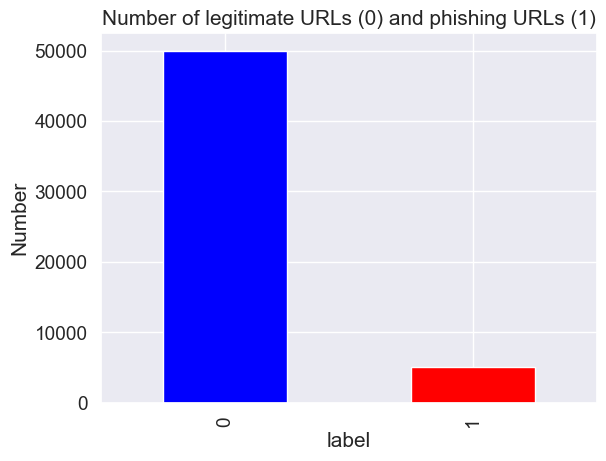

In [532]:
# Calculating value_counts for the column 'label'
labels_counts = df_resampled['label'].value_counts()

# Calculating the percentage of values
labels_percentages = df_resampled['label'].value_counts(normalize=True) * 100

# Combining the counting with the corresponding percentage value.
summary = pd.DataFrame({
    'Count': labels_counts,
    'Percentage': labels_percentages
})

# Show the result
summary['Percentage'] = summary['Percentage'].round(3)  # Round the percentage to three decimal digits
print(summary)

labels_counts.plot(kind='bar', color=custom_colors, xlabel='label', ylabel='Number', title='Number of legitimate URLs (0) and phishing URLs (1)')
plt.show()

The DataFrame exhibits an unbalanced distribution of the target labels:

| **Label** | **Count** | **Percentage** |
|-----------|-----------|----------------|
| 0 (Legitimate URLs: Non-anomalies) | 50,000 | 90.909% |
| 1 (Phishing URLs: Anomalies) | 5,000 | 9.091% |

Drop label

In [535]:
df_resampled.drop(columns = ['label'], axis=1, inplace = True)
df_resampled.sample(10)

,URLLength,DomainLength,IsDomainIP,TLD,URLCharProb,TLDLength,NoOfSubDomain,HasObfuscation,LetterRatioInURL,NoOfAmpersandInURL,...,HasHiddenFields,HasPasswordField,Bank,Pay,Crypto,NoOfImage,NoOfCSS,NoOfJS,NoOfSelfRef,NoOfEmptyRef
2656,27,20,0,587,0.046665,2,1,0,0.481,0,...,1,0,0,0,0,22,2,10,244,6
84091,35,28,0,112554,0.061129,3,1,0,0.629,0,...,1,0,1,1,0,20,62,5,203,0
51262,31,24,0,6395,0.061242,2,2,0,0.548,0,...,0,0,0,0,0,10,3,11,27,0
82238,24,17,0,295,0.059903,2,2,0,0.417,0,...,1,0,1,1,0,18,17,21,269,61
193725,40,34,0,2,0.061735,10,1,0,0.675,0,...,0,0,0,0,0,0,0,0,0,0
51282,27,20,0,2219,0.051587,2,1,0,0.481,0,...,0,0,0,0,0,91,5,8,82,0
70194,25,18,0,112554,0.060645,3,1,0,0.480,0,...,1,0,0,1,0,94,39,64,180,6
26135,34,27,0,1846,0.058079,2,3,0,0.559,0,...,1,0,0,0,0,10,2,5,11,0
59080,27,20,0,112554,0.059879,3,1,0,0.519,0,...,1,0,0,0,0,54,9,9,247,2
77366,19,12,0,112554,0.074648,3,1,0,0.316,0,...,1,0,0,0,0,21,42,39,87,22


Calculate percentage of outliers 

In [537]:
outliers_fraction = n_phishing_samples/len(df_resampled)

### 5.2 Elliptic envelope

**Elliptic Envelope** is an anomaly detection method that assumes the data follow a Gaussian distribution; it models the data with an elliptical shape and estimates the parameters by a multivariate normal distribution.<br>
The technique works quite well when the dataset is roughly Gaussian.

<div class ="alert alert-info" role="alert">
    Initialize Elliptic Envelope algorithm and detect anomalies
</div>

Initialize Elliptic Envelope and make predictions

In [542]:
y_pred_ee = EllipticEnvelope(contamination=outliers_fraction).fit_predict(df_resampled)

Show how many anomalies does it found

In [544]:
np.unique(y_pred_ee, return_counts=True)

(array([-1,  1]), array([ 5000, 50000], dtype=int64))

Display charts

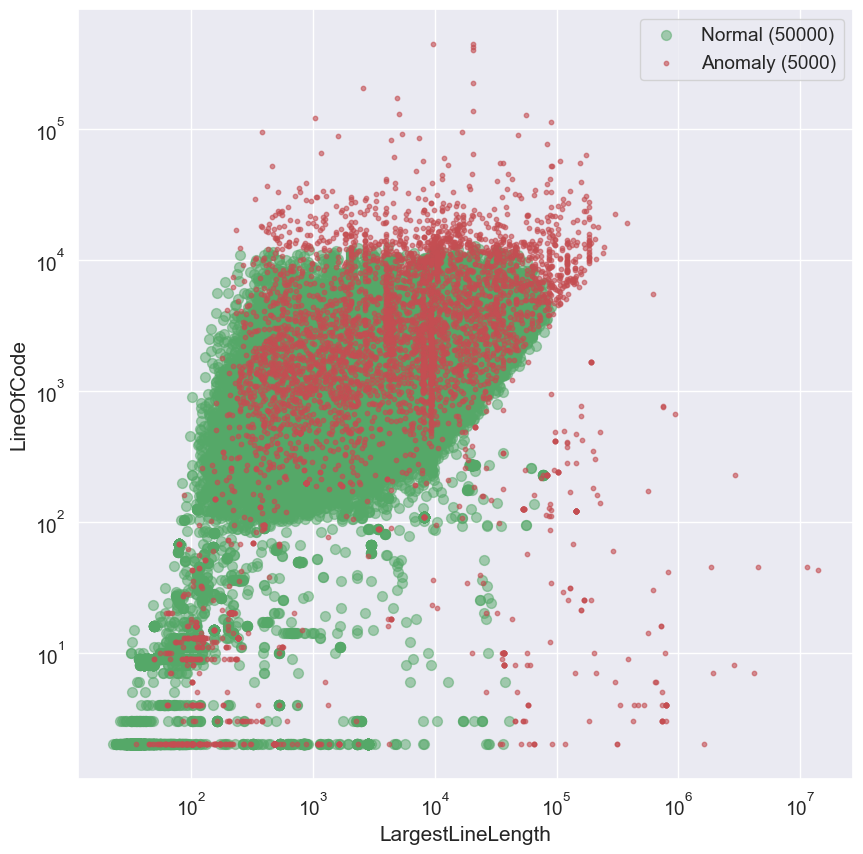

In [546]:
normal_count = np.sum(y_pred_ee == 1)
anomaly_count = np.sum(y_pred_ee == -1)

fig, ax = plt.subplots(figsize=(10, 10))

normal_points = ax.scatter(df_resampled['LargestLineLength'][y_pred_ee == 1], 
                           df_resampled['LineOfCode'][y_pred_ee == 1], 
                           color='g', alpha=0.5, s=50, label=f'Normal ({normal_count})')

anomaly_points = ax.scatter(df_resampled['LargestLineLength'][y_pred_ee == -1], 
                            df_resampled['LineOfCode'][y_pred_ee == -1], 
                            color='r', alpha=0.6, s=10, label=f'Anomaly ({anomaly_count})')

ax.set_xlabel('LargestLineLength')
ax.set_xscale('log')
ax.set_ylabel('LineOfCode')
ax.set_yscale('log')
ax.legend(loc='upper right')

plt.show()

The above scatter plot illustrates the results of anomaly detection using the **Elliptic Envelope** algorithm, wth respect to the features `LargestLineLength` and `LineOfCode`.<br>
**Normal points** (in green) cluster around the main distribution of the data, indicating regions where the model detects few anomalies. The density and spread of these points suggest the areas the algorithm considers as following a Gaussian distribution.<br>
**Anomalous points** (in red) lie outside the elliptical decision boundary assumed by the Elliptic Envelope. They appear at outlier values of both axes, highlighting deviations from the expected data pattern. Thier distribution is scattered in the space considered, while the distribution of the non-anomalous points is more concentrated.

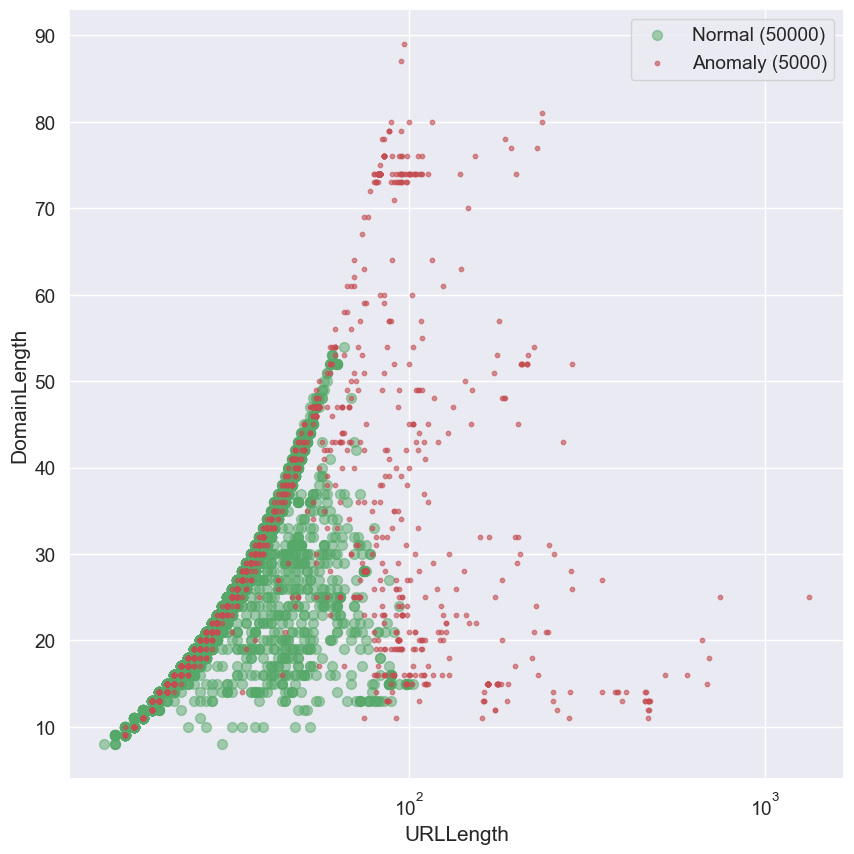

In [548]:
normal_count = np.sum(y_pred_ee == 1)
anomaly_count = np.sum(y_pred_ee == -1)

fig, ax = plt.subplots(figsize=(10, 10))

normal_points = ax.scatter(df_resampled['URLLength'][y_pred_ee == 1], 
                           df_resampled['DomainLength'][y_pred_ee == 1], 
                           color='g', alpha=0.5, s=50, label=f'Normal ({normal_count})')

anomaly_points = ax.scatter(df_resampled['URLLength'][y_pred_ee == -1], 
                            df_resampled['DomainLength'][y_pred_ee == -1], 
                            color='r', alpha=0.6, s=10, label=f'Anomaly ({anomaly_count})')

ax.set_xlabel('URLLength')
ax.set_xscale('log')
ax.set_ylabel('DomainLength')
ax.legend(loc='upper right')

plt.show()

From this other scatter plot, I can deduce the same conclusions made before.<br>
In fact, even showing the data distributions using the features `DomainLength` and `URLLength`, **normal points** (in green) follow a Gaussian distribution and most of them are spread along the "central line" that can be seen in the figure. Instead, the vast majority of the **anomalous points** (in red) lie outside.

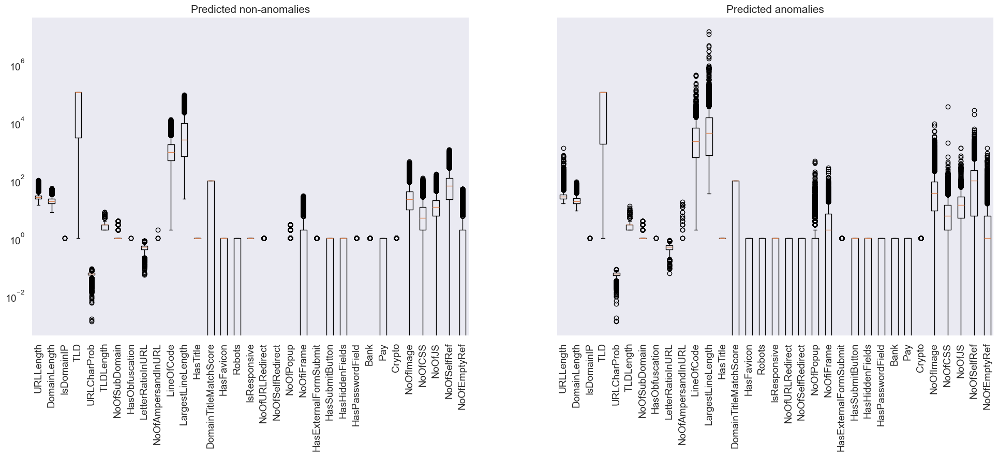

In [550]:
fig, ax = plt.subplots(1, 2, figsize=(24, 8), sharey=True)

ax[0].boxplot(df_resampled[y_pred_ee == 1])
ax[0].set_yscale('log')
ax[0].set_title('Predicted non-anomalies')

ax[1].boxplot(df_resampled[y_pred_ee == -1])
ax[0].set_yscale('log')
ax[1].set_title('Predicted anomalies')

for idx in [0, 1]:
    ax[idx].set_xticklabels(df_resampled.columns, rotation=90)
    ax[idx].grid()

plt.show()

The boxplots above show a comparison between the **predicted non-anomalies** (left) and **predicted anomalies** (right) across all features in the dataset.<br>
In the **non-anomalies plot**, the majority of the features show compact ranges with limited outliers, suggesting that these points conform to the expected data distribution.<br>
In contrast, the **anomalies plot** reveals a significant increase in variance and the presence of extreme values across many features. The features contain values that deviate significantly from the main distribution observed in the non-anomalies.

Overall, the boxplots confirm that anomalies are characterized by unusual patterns in specific features. The Elliptic Envelope successfully identifies these anomalies by capturing deviations from the Gaussian distribution it assumes.

### 5.3 One-Class SVM

**One-Class Support Vector Machine**, or **One-Class SVM**, is a boundary-based anomaly detection method that tries to identify a decision boundary around the majority of the data points (inliers); the anomalies are, therefore, points that lie outside this boundary.<br>
One-Class SVM is powerful in outlier detection for complex and high-dimensional spaces but suffers from being sensitive to hyperparameters: the choice of kernel and number of parameters controlling the trade-off between false positives and false negatives.

<div class ="alert alert-info" role="alert">
    Initialize One-Class SVM algorithm and detect anomalies
</div>

Initialize One-Class SVM and make predictions

In [556]:
y_pred_svm = OneClassSVM(nu=outliers_fraction, kernel='rbf').fit(df_resampled).predict(df_resampled)

Show how many anomalies does it found

In [558]:
np.unique(y_pred_svm, return_counts=True)

(array([-1,  1], dtype=int64), array([ 5001, 49999], dtype=int64))

Display charts

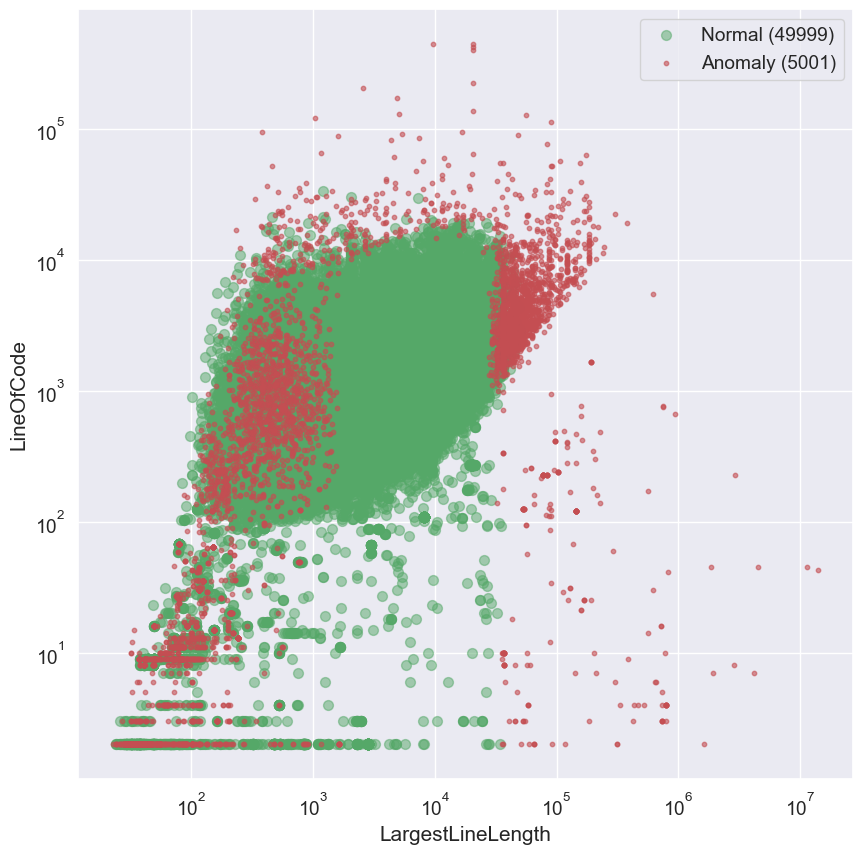

In [560]:
normal_count = np.sum(y_pred_svm == 1)
anomaly_count = np.sum(y_pred_svm == -1)

fig, ax = plt.subplots(figsize=(10, 10))

normal_points = ax.scatter(df_resampled['LargestLineLength'][y_pred_svm == 1], 
                           df_resampled['LineOfCode'][y_pred_svm == 1], 
                           color='g', alpha=0.5, s=50, label=f'Normal ({normal_count})')

anomaly_points = ax.scatter(df_resampled['LargestLineLength'][y_pred_svm == -1], 
                            df_resampled['LineOfCode'][y_pred_svm == -1], 
                            color='r', alpha=0.6, s=10, label=f'Anomaly ({anomaly_count})')

ax.set_xlabel('LargestLineLength')
ax.set_xscale('log')
ax.set_ylabel('LineOfCode')
ax.set_yscale('log')
ax.legend(loc='upper right')

plt.show()

This scatter plot for **One-Class SVM** reveals the results of its hyperplane-based classification.<br>
**Normal points** (in green) fall within the decision boundary defined by the SVM, forming a compact cluster in the centre.<br>
Instead, the **anomalous points** (in red) lie in a big cluster in the centre, even if they represent deviations from the patterns, with some outliers on the right.<br>
The distribution of points is similar to the one shown for Elliptic Envelope, but in that case it is a Gaussian distribution, while in this case the decision boundary is calculated on various hyperplanes.

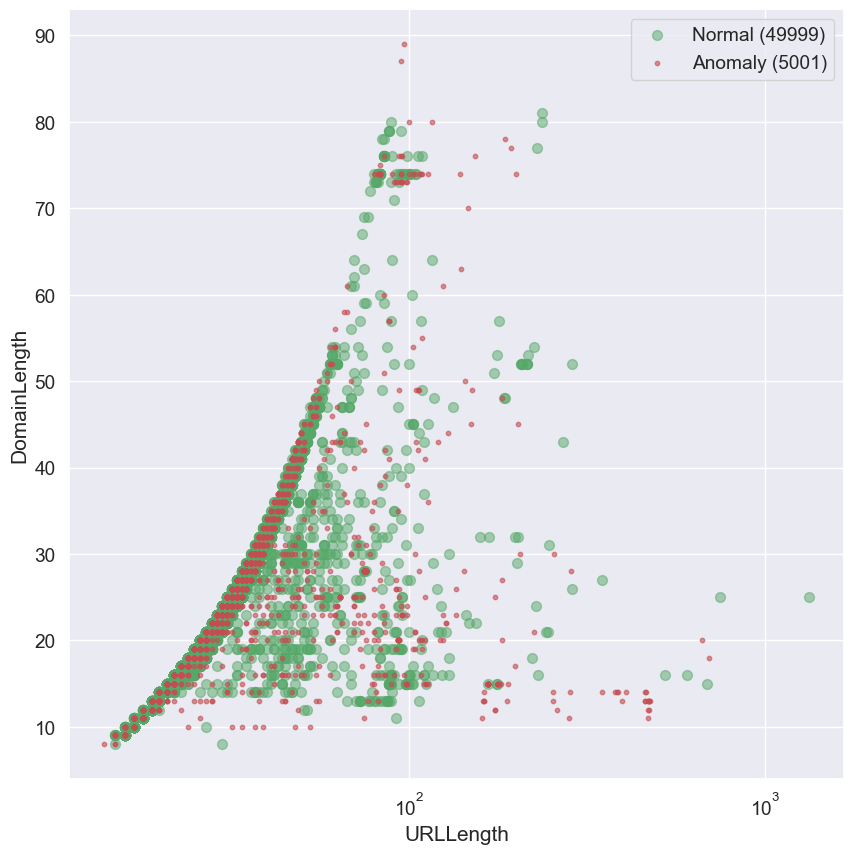

In [562]:
normal_count = np.sum(y_pred_svm == 1)
anomaly_count = np.sum(y_pred_svm == -1)

fig, ax = plt.subplots(figsize=(10, 10))

normal_points = ax.scatter(df_resampled['URLLength'][y_pred_svm == 1], 
                           df_resampled['DomainLength'][y_pred_svm == 1], 
                           color='g', alpha=0.5, s=50, label=f'Normal ({normal_count})')

anomaly_points = ax.scatter(df_resampled['URLLength'][y_pred_svm == -1], 
                            df_resampled['DomainLength'][y_pred_svm == -1], 
                            color='r', alpha=0.6, s=10, label=f'Anomaly ({anomaly_count})')

ax.set_xlabel('URLLength')
ax.set_xscale('log')
ax.set_ylabel('DomainLength')
ax.legend(loc='upper right')

plt.show()

The scatter plot above highlights notable differences compared to the one referring to the Elliptic Envelope.<br>
In fact, the **non-anomalous points** (in green) are no longer concentrated in the large "central line", but are also distributed outside of it.<br>
As for the **anomalous points** (in red), they are more concentrated in the large "central line" as if there was a trend inversion compared to the Elliptic Envelope.<br>
All this is due to the different way of calculating the decision boundary and the assumption of the distribution of the points.

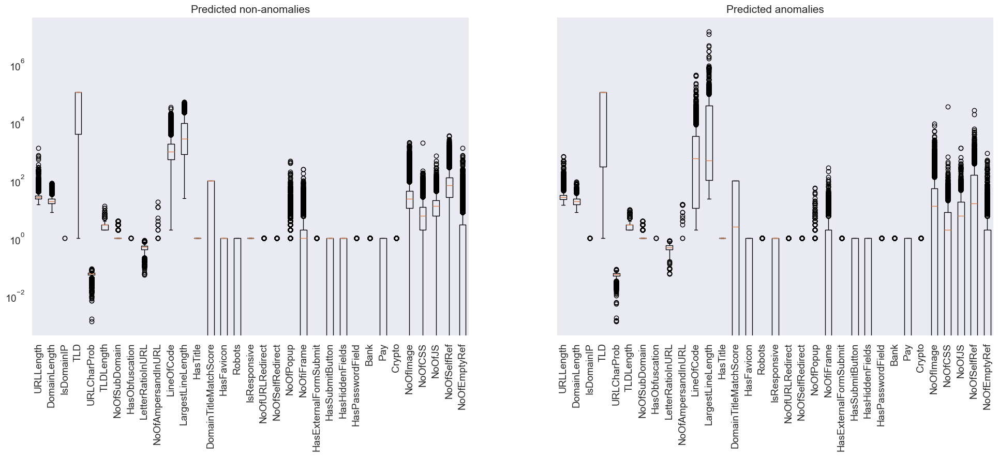

In [564]:
fig, ax = plt.subplots(1, 2, figsize=(24, 8), sharey=True)

ax[0].boxplot(df_resampled[y_pred_svm == 1])
ax[0].set_yscale('log')
ax[0].set_title('Predicted non-anomalies')

ax[1].boxplot(df_resampled[y_pred_svm == -1])
ax[1].set_yscale('log')
ax[1].set_title('Predicted anomalies')

for idx in [0, 1]:
    ax[idx].set_xticklabels(df_resampled.columns, rotation=90)
    ax[idx].grid()

plt.show()

The boxplots for the **One-Class SVM** exhibit overall similarities to the Elliptic Envelope but reveal some unique behaviors for specific features.<br>
For example, `NoOfPopup`, `HasPasswordField` and `Bank` show different irregularities in the anomalies plot compared to the previous plot.<br>
This suggests that the One-Class SVM is particularly sensitive to deviations in binary features, where it places a sharper boundary between normal and anomalous points.

Overall, the One-Class SVM provides a complementary perspective by detecting anomalies that may not be evident under strictly Gaussian or density-based assumptions.

### 5.4 Isolation Forest

**Isolation Forest** is a tree-based anomaly detection algorithm that isolates data points by recursively partitioning the feature space.<br>
It identifies anomalies as points that are isolated quickly with few splits, as they lie in sparse regions of the dataset.<br>
Isolation Forest is efficient and scalable to large datasets and performs well on the identification of global anomalies.

<div class ="alert alert-info" role="alert">
    Initialize Isolation Forest algorithm and detect anomalies
</div>

Initialize Isolation Forest and make predictions

In [570]:
y_pred_is  = IsolationForest(contamination=outliers_fraction, random_state=random_seed).fit(df_resampled).predict(df_resampled)

Show how many anomalies does it found

In [572]:
np.unique(y_pred_is, return_counts=True)

(array([-1,  1]), array([ 5000, 50000], dtype=int64))

Display charts

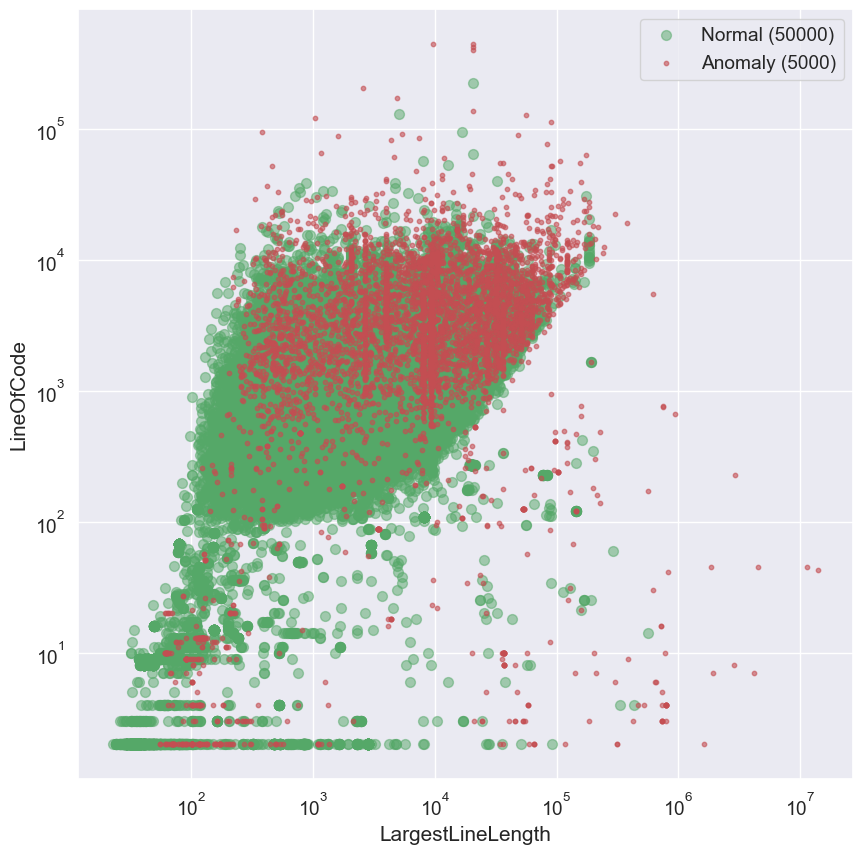

In [574]:
normal_count = np.sum(y_pred_is == 1)
anomaly_count = np.sum(y_pred_is == -1)

fig, ax = plt.subplots(figsize=(10, 10))

normal_points = ax.scatter(df_resampled['LargestLineLength'][y_pred_is == 1], 
                           df_resampled['LineOfCode'][y_pred_is == 1], 
                           color='g', alpha=0.5, s=50, label=f'Normal ({normal_count})')

anomaly_points = ax.scatter(df_resampled['LargestLineLength'][y_pred_is == -1], 
                            df_resampled['LineOfCode'][y_pred_is == -1], 
                            color='r', alpha=0.6, s=10, label=f'Anomaly ({anomaly_count})')

ax.set_xlabel('LargestLineLength')
ax.set_xscale('log')
ax.set_ylabel('LineOfCode')
ax.set_yscale('log')
ax.legend(loc='upper right')

plt.show()

The scatter plot above is very similar to the one shown for the Elliptic Envelope.<br>
In this plot too, the **normal points** (in green) are identified in the center of a large cluster or in the lower left.<br>
The **anomalous points** (in red) are located just above the large cluster of normal points, with some outliners scattered in space.

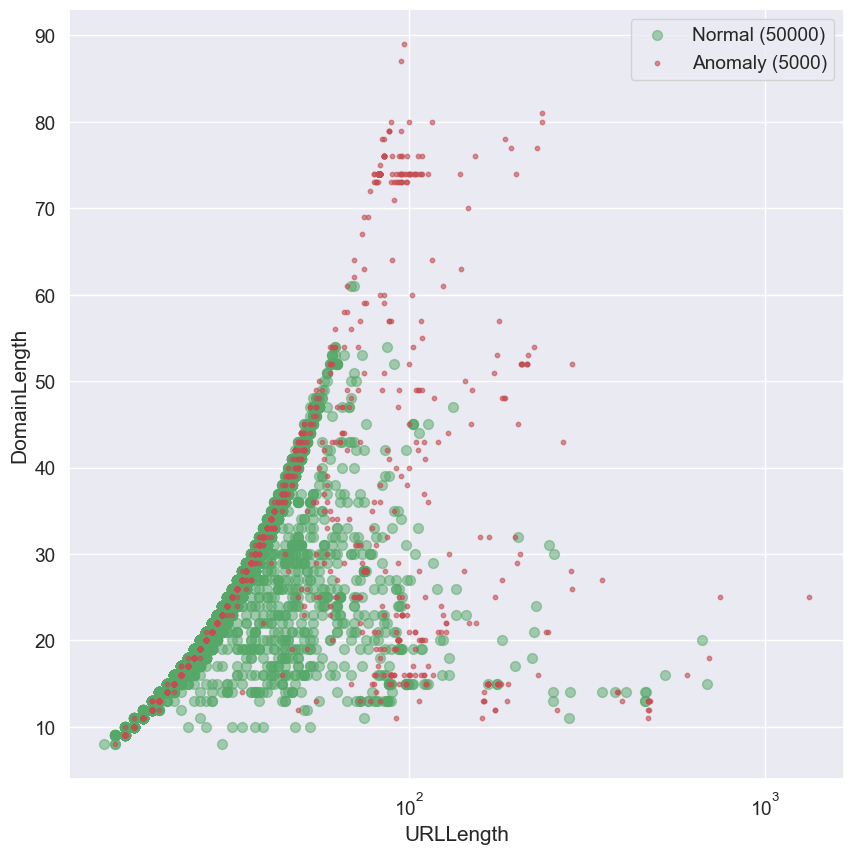

In [576]:
normal_count = np.sum(y_pred_is == 1)
anomaly_count = np.sum(y_pred_is == -1)

fig, ax = plt.subplots(figsize=(10, 10))

normal_points = ax.scatter(df_resampled['URLLength'][y_pred_is == 1], 
                           df_resampled['DomainLength'][y_pred_is == 1], 
                           color='g', alpha=0.5, s=50, label=f'Normal ({normal_count})')

anomaly_points = ax.scatter(df_resampled['URLLength'][y_pred_is == -1], 
                            df_resampled['DomainLength'][y_pred_is == -1], 
                            color='r', alpha=0.6, s=10, label=f'Anomaly ({anomaly_count})')

ax.set_xlabel('URLLength')
ax.set_xscale('log')
ax.set_ylabel('DomainLength')
ax.legend(loc='upper right')

plt.show()

Although the previous scatter plot was very similar to that of the Elliptic Envelope, this one just reported is very similar to that of the One-Class SVM.<br>
In fact, the **normal points** (in green) are distributed along the large "central line", but they are also present outside it, and this representation is also represented for One-Class SVM, but not for Elliptic Envelope.<br>
The **anomalous points** (in red) are also distributed similarly to those of the One-Class SVM.

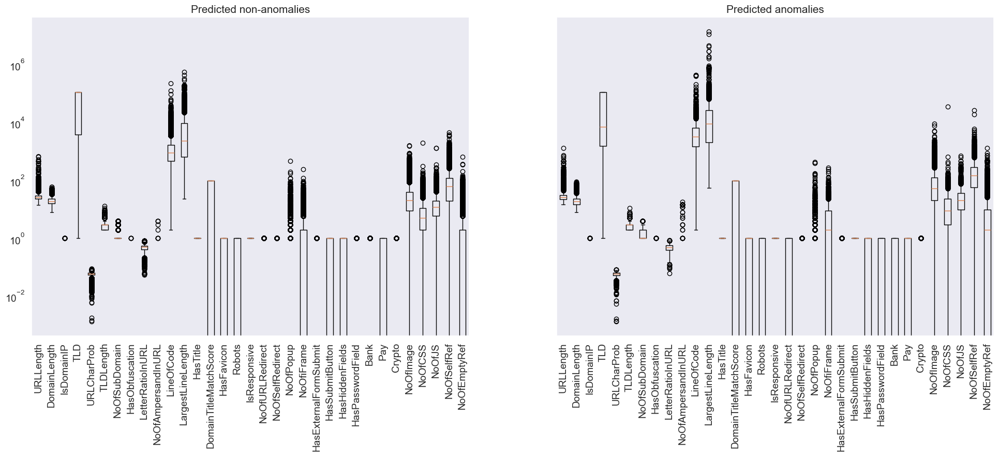

In [578]:
fig, ax = plt.subplots(1, 2, figsize=(24, 8), sharey=True)

ax[0].boxplot(df_resampled[y_pred_is == 1])
ax[0].set_yscale('log')
ax[0].set_title('Predicted non-anomalies')

ax[1].boxplot(df_resampled[y_pred_is == -1])
ax[1].set_yscale('log')
ax[1].set_title('Predicted anomalies')

for idx in [0, 1]:
    ax[idx].set_xticklabels(df_resampled.columns, rotation=90)
    ax[idx].grid()

plt.show()

The boxplots for the **Isolation Forest** algorithm display trends similar to the Elliptic Envelope and One-Class SVM. However, certain features, such as `NoOfCSS` and `NoOfJS` show a more significant similarity between normal and anomalous points, while it is not the case for the other two techniques.

In general, the Isolation Forest emphasizes anomalies with global deviations, especially in features where extreme values occur, further validating its effectiveness in detecting outliers in sparse regions.

### 5.5 Local Outlier Factor

**Local Outlier Factor**, or **LOF**, is a density-based anomaly detection method that computes the local density of a point relative to its neighbors.<br>
The LOF identifies anomalies as points that have a considerably lower local density value compared to their neighbors.<br>In particular, LOF excels in datasets with changing densities because it adapts to local changes.<br>
Still, it may perform very poorly in high-dimensional data and might misclassify outliers if the local neighborhood is ill-defined.

<div class ="alert alert-info" role="alert">
    Initialize Local Outlier Factor algorithm and detect anomalies
</div>

Initialize Local Outlier Factor and make predictions

In [584]:
y_pred_lof = LocalOutlierFactor(n_neighbors=35, contamination=outliers_fraction).fit_predict(df_resampled)

Show how many anomalies does it found

In [586]:
np.unique(y_pred_lof, return_counts=True)

(array([-1,  1]), array([ 5000, 50000], dtype=int64))

Display charts

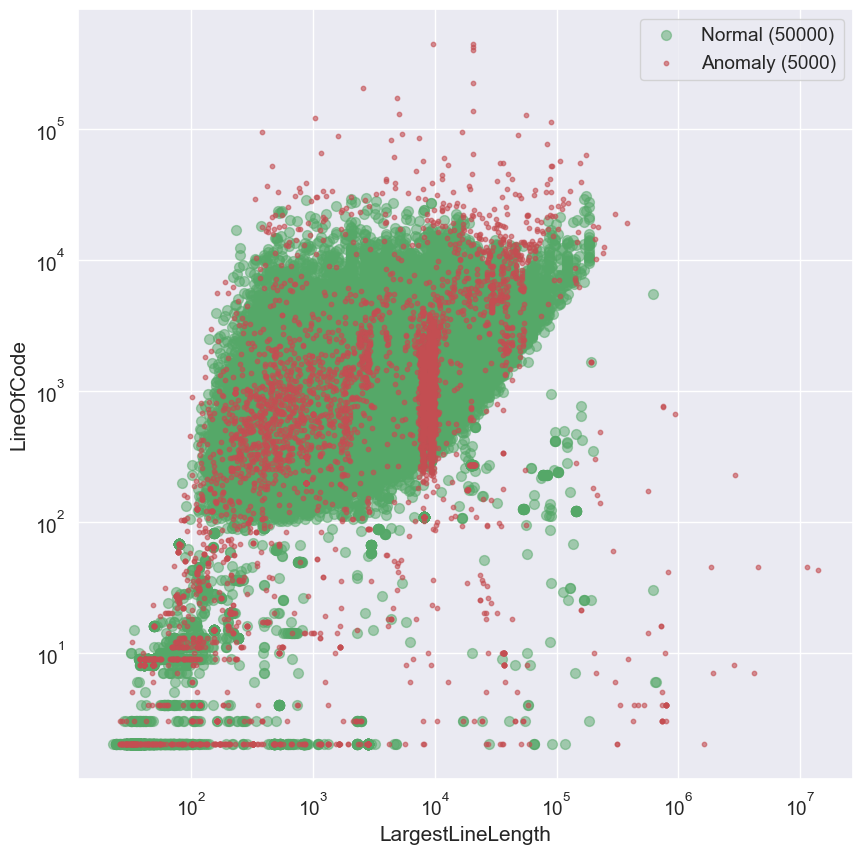

In [588]:
normal_count = np.sum(y_pred_lof == 1)
anomaly_count = np.sum(y_pred_lof == -1)

fig, ax = plt.subplots(figsize=(10, 10))

normal_points = ax.scatter(df_resampled['LargestLineLength'][y_pred_lof == 1], 
                           df_resampled['LineOfCode'][y_pred_lof == 1], 
                           color='g', alpha=0.5, s=50, label=f'Normal ({normal_count})')

anomaly_points = ax.scatter(df_resampled['LargestLineLength'][y_pred_lof == -1], 
                            df_resampled['LineOfCode'][y_pred_lof == -1], 
                            color='r', alpha=0.6, s=10, label=f'Anomaly ({anomaly_count})')

ax.set_xlabel('LargestLineLength')
ax.set_xscale('log')
ax.set_ylabel('LineOfCode')
ax.set_yscale('log')
ax.legend(loc='upper right')

plt.show()

The scatter plot above has same similar with respect to the ones shown for Elliptic Envelope and Isolation Forest.<br>
In this plot too, the **normal points** (in green) are identified in the center of a large cluster or in the lower left.<br>
Instead, the **anomalous points** (in red) are distributed quite randomly within the central cluster, which is not the case for Elliptic Envelope and Isolation Forest.

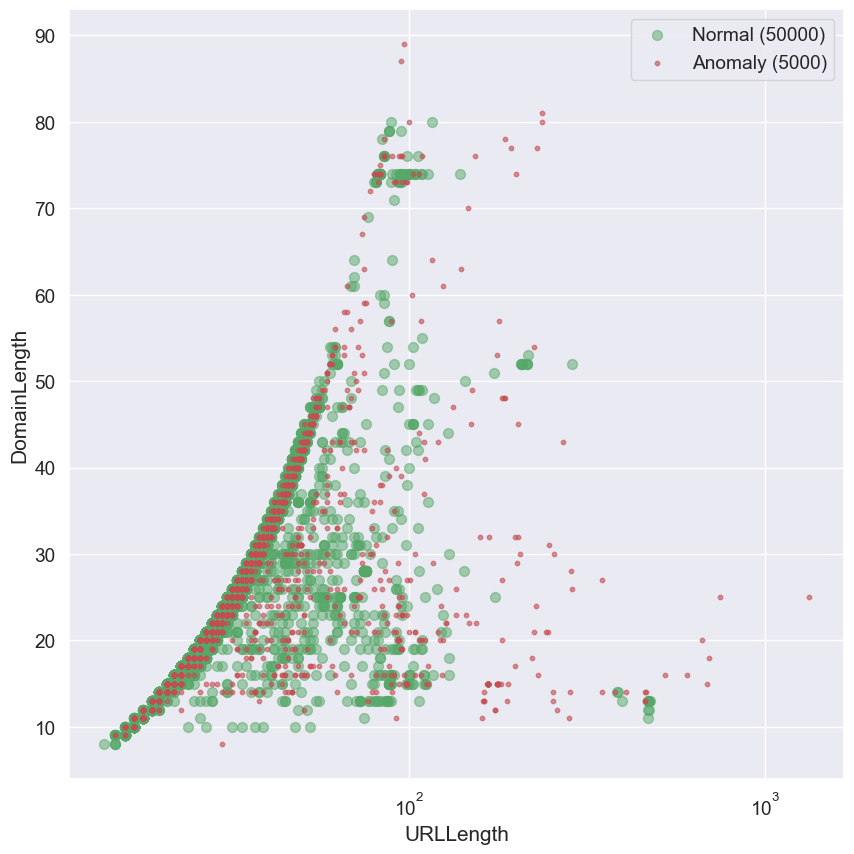

In [590]:
normal_count = np.sum(y_pred_lof == 1)
anomaly_count = np.sum(y_pred_lof == -1)

fig, ax = plt.subplots(figsize=(10, 10))

normal_points = ax.scatter(df_resampled['URLLength'][y_pred_lof == 1], 
                           df_resampled['DomainLength'][y_pred_lof == 1], 
                           color='g', alpha=0.5, s=50, label=f'Normal ({normal_count})')

anomaly_points = ax.scatter(df_resampled['URLLength'][y_pred_lof == -1], 
                            df_resampled['DomainLength'][y_pred_lof == -1], 
                            color='r', alpha=0.6, s=10, label=f'Anomaly ({anomaly_count})')

ax.set_xlabel('URLLength')
ax.set_xscale('log')
ax.set_ylabel('DomainLength')
ax.legend(loc='upper right')

plt.show()

From this other scatter plot I can instead notice how the distribution of the points with respect to the two analyzed features is almost the same as that of Isolation Forest.<br>
This is quite strange since the two methods of calculating the decision boundary are different.

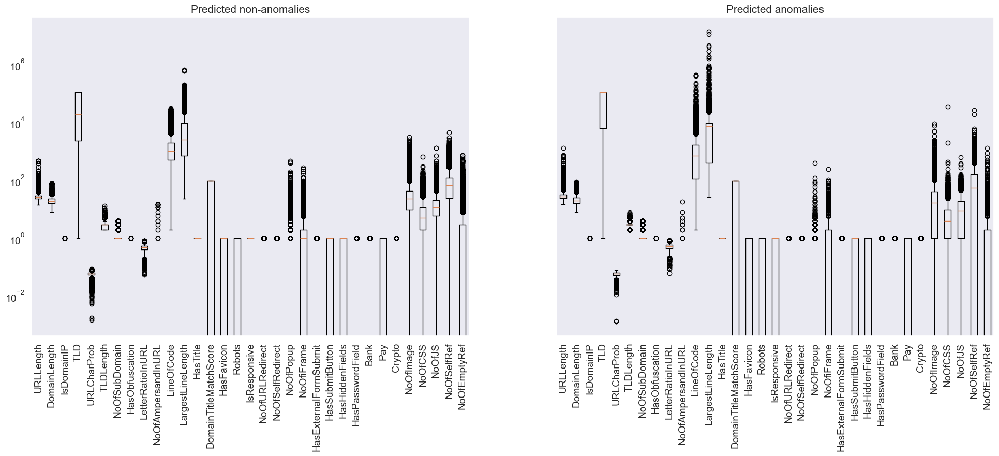

In [592]:
fig, ax = plt.subplots(1, 2, figsize=(24, 8), sharey=True)

ax[0].boxplot(df_resampled[y_pred_lof == 1])
ax[0].set_yscale('log')
ax[0].set_title('Predicted non-anomalies')

ax[1].boxplot(df_resampled[y_pred_lof == -1])
ax[1].set_yscale('log')
ax[1].set_title('Predicted anomalies')

for idx in [0, 1]:
    ax[idx].set_xticklabels(df_resampled.columns, rotation=90)
    ax[idx].grid()

plt.show()

The boxplots for the **Local Outlier Factor** show a distribution similar to all the other technique, but again some features have different distribution, based on how the decision boundaries is calculated.<br>
Infact, LOF is sensibile to local density, highlighting outliers in regions where density differences are more prominent.

Overall, LOF's results confirm that anomalies are often characterized by local deviations in density, particularly in features involving counts or lengths.

### 5.6 Anomaly detection algorihtms comparison

<div class ="alert alert-info" role="alert">
    Compare the different anomaly detection algorihtms
</div>

Define the anomaly detection algorithms.

In [597]:
anomaly_algorithms = {
    'Elliptic Envelope': EllipticEnvelope(contamination=outliers_fraction),
    'One-Class SVM': OneClassSVM(nu=outliers_fraction, kernel='rbf'),
    'Isolation Forest': IsolationForest(contamination=outliers_fraction, random_state=random_seed),
    'Local Outlier Factor': LocalOutlierFactor(n_neighbors=35, contamination=outliers_fraction)
}

Create a meshgrid for plotting decision boundaries.

In [599]:
# Determine the range of the data in X_embedded for the meshgrid
x_min, x_max = X_embedded[:, 0].min() - 1, X_embedded[:, 0].max() + 1
y_min, y_max = X_embedded[:, 1].min() - 1, X_embedded[:, 1].max() + 1

# Define the meshgrid using the range of the data
xx, yy = np.meshgrid(np.linspace(x_min, x_max, 150), np.linspace(y_min, y_max, 150))

Go through each anomaly detection algorithms, make prediction and visualize the decision boundary

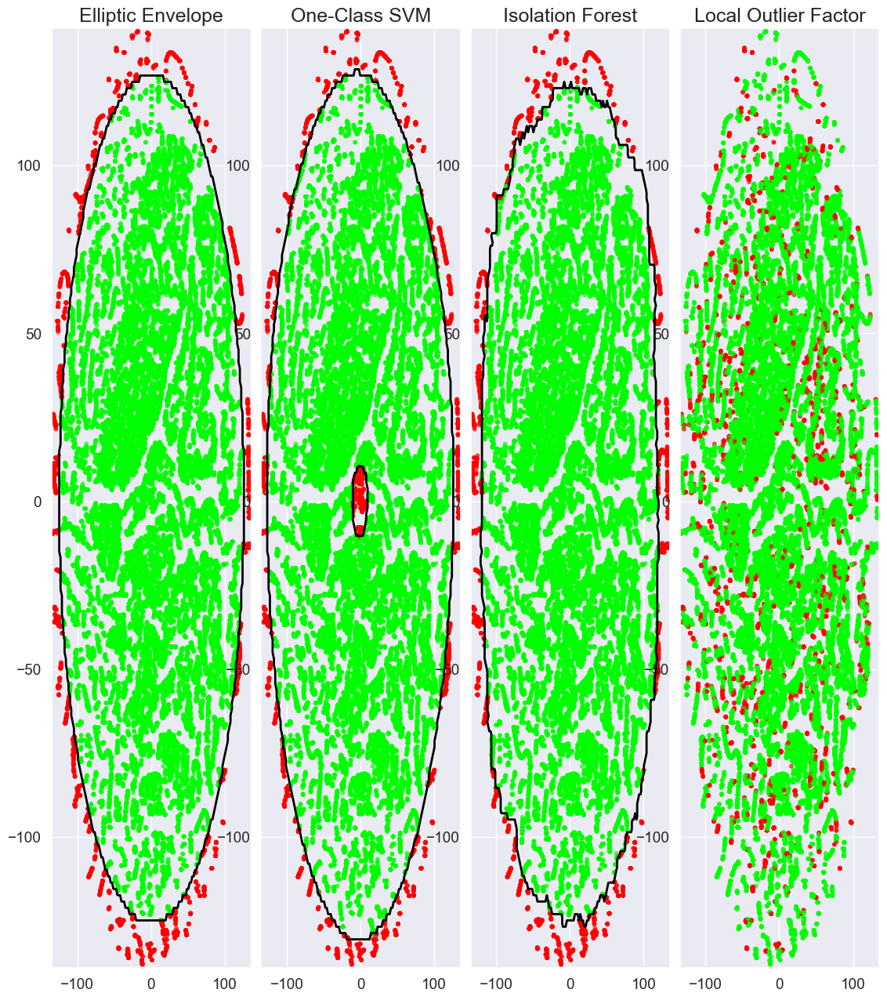

In [601]:
# Initialize variables
plot_idx = 1

# Prepare figure with the results
plt.figure(figsize=(len(anomaly_algorithms) * 2 + 3, 12.5))
plt.subplots_adjust(left=.02, right=.98, bottom=.001, top=.96, wspace=.05, hspace=.01)

# Colors for the scatter plot: green for normal, red for anomalous
colors = np.array(['#00FF00', '#FF0000'])

# Apply the anomaly detection algorithms
for algorithm, estimator in anomaly_algorithms.items():
    # Fit the algorithm to the dataset X_embedded
    estimator.fit(X_embedded)

    # Add a new subplot for the current algorithm
    plt.subplot(1, len(anomaly_algorithms), plot_idx)
    plt.title(algorithm, size=18)

    # Make predictions (normal vs anomaly)
    if algorithm == 'Local Outlier Factor':
        # LOF uses fit_predict instead of predict
        y_pred = estimator.fit_predict(X_embedded)
    else:
        # Other algorithms use predict
        y_pred = estimator.predict(X_embedded)

        # Plot decision boundary (not supported by LOF)
        Z = estimator.predict(np.c_[xx.ravel(), yy.ravel()])
        Z = Z.reshape(xx.shape)
        plt.contour(xx, yy, Z, levels=[0], linewidths=2, colors='black')

    # Modify the prediction results to label 0 (normal) or 1 (anomalous)
    y_pred = np.where(y_pred == 1, 0, 1)

    # Scatter plot of the data, colored based on the prediction
    plt.scatter(X_embedded[:, 0], X_embedded[:, 1], s=10, color=colors[y_pred], alpha=0.6)
    plt.xlim(x_min, x_max)
    plt.ylim(y_min, y_max)

    # Update the index for the next subplot
    plot_idx += 1

plt.show()

The charts above provide a clear representation of the distribution of projected points via t-SNE embeddings, where anomalies are in red and normal points are in green. The decision boundaries are provided for each subplot of the respective anomaly detection techniques: Elliptic Envelope, One-Class SVM, Isolation Forest. This is not supported in LOF.

- **Elliptic Envelope:**<br>
The algorithm assumes a Gaussian distribution of the data, and as such, the decision boundary is represented by a regular elliptical shape that surrounds normal points. Anomalies are found at the edges of the distribution, far from the elliptical center. This representation reflects the global approach of the Elliptic Envelope, which identifies outliers based on statistical deviation from the elliptical shape.

- **One-Class SVM:**<br>
The decision boundary is more focused around the central points of the distribution. One-Class SVM actually builds a compact region in space for the normal points, disregarding large portions of the distribution altogether, only to flag anomalies even those well-populated areas laying at the edge.

- **Isolation Forest:**<br>
The decision boundary of the Isolation Forest is less regular than the Elliptic Envelope but wider than that of the One-Class SVM. The model detects outliers at the margins of the distribution and in some of the sparser areas within. It is worth noting that a few anomalies are spread out along the edge of the point cloud, which proves that the Isolation Forest has the capability to isolate the points having extreme values in the less dense region.

- **Local Outlier Factor (LOF):**<br>
Unlike the other algorithms, LOF does not produce a decision boundary since it is based on local density. The identified anomalies are then more diffuse and irregularly distributed within the points space, which suggest that LOF is sensitive to local variations in data density. This behavior makes it unique in outlier detection, even in central areas of the distribution where, by other techniques, points are considered normal.

### 5.7 Conclusion on Anomaly detection

The four methods of anomaly detection (Elliptic Envelope, One-Class SVM, Isolation Forest, and Local Outlier Factor) provide different approaches and trade-offs depending on the nature of the data.

- **Elliptic Envelope** is good for data that are Gaussian, as it marks anomalies based on statistical deviation from an elliptical boundary. It works well with datasets where outliers are expected to be at the edges of a well-defined distribution. However, it may not perform well with highly skewed or non-Gaussian data.

- **One-Class SVM** is more rigid and tends to create a compact region around the normal points. It is sensitive to deviations, which makes it good in situations when a tight decision boundary is required and small variations of the peripheral points are crucial; otherwise, it would overfit in cases of complex structures in data or non-central distributions.

- **Isolation Forest** offers more flexibility in finding anomalies in both sparse and peripheral regions. It works well with high-dimensional data and datasets of varying densities. It excels at finding large datasets or ones that do not follow a clear, global distribution because, for this method, one is not bound to a particular data shape.

- **Local Outlier Factor (LOF)** is unique in that it finds anomalies based on local density, not global distribution. It does a great job of finding subtle anomalies that might show up in central areas of the data cloud. LOF comes in very handy for a dataset with varying local densities, although it is sensitive to noise and outliers within the dense regions.

## Project conlusion

During this project, I first did an **overview of a dataset** containing **phishing and legitimate URLs**. Different charts are used to help visualize the distribution and various correlations among the features of these datasets. Afterward, I preprocess our data, which could result in the better training of the various classifiers.

Thereafter, the **supervised learning techniques** were employed: Logistic Regression, Gaussian Naive Bayes, Linear Support Vector Machine, Decision Tree, k-Nearest Neighbors, Deep Neural Network, XGBoost, and Random Forest. I compared the performance of these models using the Precision-Recall curves, ROC curves, and calibration plots to evaluate their ability in classifying phishing and legitimate URLs.

I then proceeded to **unsupervised learning clustering** using K-Means, DBSCAN, and Hierarchical Clustering algorithms. These clustering methods allow analyzing the inherent structure of the data without labeled outcomes and provide insight into the natural grouping of URLs.

Last but not least, I implemented **anomaly detection techniques** using Elliptic Envelope, One-Class SVM, Isolation Forest, and Local Outlier Factor. These methods thus helped in the identification of potential outliers and anomalies within the dataset to further improve the ability in finding phishing URLs that are far from the normal patterns.

This was a really challenging but exciting project. I got hands-on with so many machine-learning techniques and, more importantly, learned how to evaluate their performance and determine the suitability of each for different kinds of data. The combination of supervised, unsupervised, and anomaly detection methods really brought forth a holistic approach in trying to solve this problem statement of phishing URL detection, and I am now more confident in selecting appropriate techniques in different scenarios.